In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import os
from funzioni import compute_dataset_weighted
from funzioni import compute_annual_mean_weighted
from funzioni import convert_dataset_celsius
from funzioni import compute_anomaly
from funzioni import create_djf_dataset
from funzioni import compute_mean_time_season
from funzioni import compute_mean_resample_mar
from funzioni import plot_bias_atmos
from funzioni import plot_bias_tos
from funzioni import plot_mean_cluster_atmos
from funzioni import plot_5_mean_cluster_atmos
from funzioni import plot_5_mean_cluster_tos
from funzioni import plot_5_mean_cluster_zonmean
from funzioni import plot_mean_cluster_tos
from funzioni import plot_bias_2_models_atmos
from funzioni import plot_bias_2_models_tos
from funzioni import plot_std_cluster_atmos
from funzioni import plot_zonmean
from funzioni import plot_zonmean_2_cluster
from funzioni import plot_mean_cluster_zonmean
from funzioni import plot_std_cluster_tos
from funzioni import plot_std_cluster_zonmean
from funzioni import bs_sample_mean
from funzioni import bs_compute_array_mean_std_95cl
from funzioni import plot_bs_95cl_mean_std
from funzioni import bs_compute_matrix10
from funzioni import plot_bs_mean_cluster_matrix10
from funzioni import plot_bs_diff_cluster
from funzioni import compute_mean
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import pylab as pl
import plotly.express as px
import dill
import pickle
import cartopy.crs as ccrs
import random
from matplotlib.lines import Line2D
from scipy import stats
import sklearn
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

Caricamento dei file pickle

In [2]:
# Caricamento di models e models_atmos
with open('models_atmos.pkl','rb') as file:
    models_atmos = dill.load(file)
    era_na_seas_mean = dill.load(file)   
with open('modelli_atmos.pickle', 'rb') as f:
    # Caricamento delle 5 liste contenenti i nomi dei modelli all'interno dei 5 cluster
    list_cluster0 = pickle.load(f)
    list_cluster1 = pickle.load(f)
    list_cluster2 = pickle.load(f)
    list_cluster3 = pickle.load(f)
    
    # Caricamento dei 5 cluster in formato pdf
    atmos_cluster0 = pickle.load(f)
    atmos_cluster1 = pickle.load(f)
    atmos_cluster2 = pickle.load(f)
    atmos_cluster3 = pickle.load(f)
    
    # Caricamento dei cluster medi in formato pdf
    atmos_cluster0_mean = pickle.load(f)
    atmos_cluster1_mean = pickle.load(f)
    atmos_cluster2_mean = pickle.load(f)
    atmos_cluster3_mean = pickle.load(f)

    #Caricamento dei cluster standard deviation in formato pdf
    atmos_cluster0_std = pickle.load(f)
    atmos_cluster1_std = pickle.load(f)
    atmos_cluster2_std = pickle.load(f)
    atmos_cluster3_std = pickle.load(f)

In [3]:
with open('models.pkl', 'rb') as file:
    models = dill.load(file)
    esa_na_seas_mean_tos = dill.load(file)
    dataset_ESA_na_celsius = dill.load(file)
     
with open('models_zonmean.pkl','rb') as file:
    models_zonmean = dill.load(file)
    era_seas_mean = dill.load(file)

Clustering su zonal wind bias

In [4]:
#Riduco la latitudine a (30,80)
#for name in models_atmos.keys():
#    era_na_seas_mean[4] = era_na_seas_mean[4].sel(lat=slice(30,80))
#    models_atmos[name]['atmos North Atlantic seasonal mean DJF'] = models_atmos[name]['atmos North Atlantic seasonal mean DJF'].sel(lat=slice(30,80))
#    models_atmos[name]['atmos North Atlantic bias DJF'] = models_atmos[name]['atmos North Atlantic bias DJF'].sel(lat=slice(30,80))

In [8]:
for name in models_atmos.keys():
    models_atmos[name]['atmos North Atlantic bias DJF'] = models_atmos[name]['atmos North Atlantic bias DJF'].sel(lon=slice(-105.,30.))

Creo la feature matrix con dimensioni = (35,25x78)

In [10]:
n_rows = len(models_atmos['ACCESS-CM2']['atmos North Atlantic bias DJF'].lat.values) # prendo un modello generico e calcolo il numero di righe, pari al numero di grid cell sulla latitudine
n_cols = len(models_atmos['ACCESS-CM2']['atmos North Atlantic bias DJF'].lon.values) #il numero di colonne è pari al numero di grid cell sulla longitudine
n_elements = n_rows * n_cols
n_models = len(models_atmos) # numero di modelli

In [11]:
np_array_models_2d = np.zeros((n_rows,n_cols)) #inizializzazione array 2-dim, che ha sulle colonne la longitudine e sulle righe la latitudine e andrò a mettere i valori dei bias di temperatura della stagione MAM
np_array_models_1d = np.zeros(n_elements) #inizializzazione array 1-dim, creato con righe di np_array_models_2d messe una accanto all'altra
feature_matrix_init = np.zeros((n_models,n_elements)) #inizializzazione matrice con righe pari al numero di modelli e per ogni riga vado a mettere 
i = 0 #inizializzazione indice righe feature_matrix_init
feature_matrix_init.shape

(35, 2040)

In [12]:
for name in models_atmos.keys(): #models_list è una lista contenente il nome di tutti i modelli che sto utilizzando. Quindi ciclo sul numero dei modelli
    #Creo array
    np_array_models_2d = models_atmos[name]['atmos North Atlantic bias DJF'].values #estraggo i valori da bias MAM e li metto in un array 2d, dove sulle righe c'è la latitudine e sulle colonne la longitudine
    np_array_models_1d = np_array_models_2d.flatten() #array 1d con numero di elementi pari a lat x lon (messe una accanto all'altra le righe dell'array 2d precedente)
    #Creo feature matrix
    feature_matrix_init[i,:] = np_array_models_1d #ogni riga di feature_matrix_init è pari a np_array_models_1d
    i = i + 1 #aggiorno indice i

feature_matrix_init.shape

(35, 2040)

Elimino le colonne contenenti 'nan'

In [13]:
#Elimino le colonne che contengono almeno un nan e creo la feature_matrix
feature_matrix = np.empty((n_models,0)) #inizializzo la nuova feature matrix, cioè la matrice senza nan
number_nan = 0 #inizializzo il numero dei number nan
arr = np.zeros(n_models) #inizializzo array di dimensione pari al numero di modelli
cell_grid_nan = [] #lista vuota che contiene il numero delle celle della griglia che hanno elementi nan e che quindi vengono eliminate per il calcolo di feature_matrix

for j in range(n_elements): #ciclo sulle colonne di feature_matrix_init   
    if np.isnan(feature_matrix_init[:,j]).any(): #se c'è almeno un elemento nan all'interno della colonna
        cell_grid_nan.append(j) #costruisco la cella con il numero delle colonne che contengono elementi nan
        number_nan = number_nan + 1 #aggiorno il numero di colonne che hanno almeno un elemento nan
    else: #se la colonna non contiene nan
        arr = feature_matrix_init[:,j]
        feature_matrix = np.column_stack((feature_matrix,arr)) #aggiungo la colonna di feature_matrix_init senza nan alla matrice feature_matrix
    

In [14]:
print(cell_grid_nan)

[0, 1, 2, 68, 69, 136, 137, 476, 477, 544, 545, 612, 613, 680, 681, 748, 749, 1457, 1458, 1524, 1525, 1526, 1590, 1591, 1592, 1593, 1594, 1595, 1596, 1597, 1598, 1599, 1600, 1601, 1656, 1657, 1658, 1659, 1660, 1661, 1662, 1663, 1664, 1665, 1666, 1667, 1668, 1669, 1670, 1723, 1724, 1725, 1726, 1727, 1728, 1729, 1730, 1731, 1732, 1733, 1734, 1735, 1736, 1737, 1738, 1739, 1740, 1791, 1792, 1793, 1794, 1795, 1796, 1797, 1798, 1799, 1800, 1801, 1802, 1803, 1804, 1805, 1806, 1807, 1808, 1859, 1860, 1861, 1862, 1863, 1864, 1865, 1866, 1867, 1868, 1869, 1870, 1871, 1872, 1873, 1874, 1875, 1876, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012]


In [15]:
len(cell_grid_nan)

140

In [16]:
feature_matrix.shape

(35, 1900)

Plot delle grid cell che non vengono considerate perché contengono elementi nan

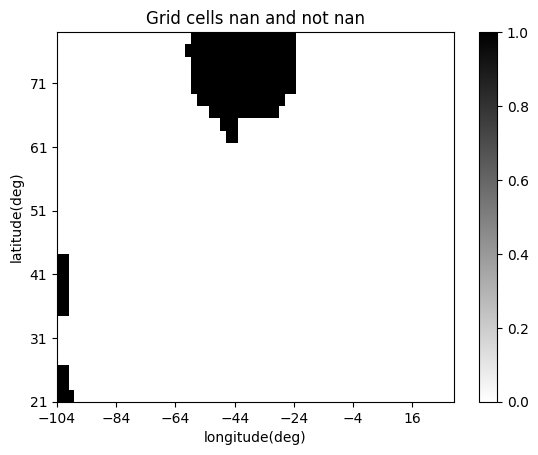

In [17]:
#Creo matrice
min_lon = models_atmos['ACCESS-CM2']['atmos North Atlantic bias DJF'].lon.values.min()
max_lon = models_atmos['ACCESS-CM2']['atmos North Atlantic bias DJF'].lon.values.max()
min_lat = models_atmos['ACCESS-CM2']['atmos North Atlantic bias DJF'].lat.values.min()
max_lat = models_atmos['ACCESS-CM2']['atmos North Atlantic bias DJF'].lat.values.max()
total_elements = n_rows * n_cols
matrix_to_plot = np.arange(total_elements).reshape((n_rows,n_cols))

#Sostituisco l'elemento nan con -999, usando cell_grid_nan
k = 0 #Inizializzo indice per cell_grid_nan
for i in range(n_rows):#ciclo sulle righe
    for j in range(n_cols): #ciclo sulle colonne
        if k < len(cell_grid_nan) and matrix_to_plot[i,j] == cell_grid_nan[k]:
            matrix_to_plot[i,j] = -999 #se l'elemento è nan allora lo inizializzo con -999
            k = k + 1 #ciclo su cell_grid_nan   
#Plot
matrix_to_plot[matrix_to_plot != -999] = 0 #Gli elementi diversi da -999 (nan) sono plottati in bianco
matrix_to_plot[matrix_to_plot == -999] = 1 # nero --> elementi nan
plt.imshow(matrix_to_plot[::-1], aspect='auto',cmap='binary',extent=[min_lon, max_lon, min_lat, max_lat],vmin=0,vmax=1)  # 'binary' cmap per bianco e nero
plt.xticks(np.arange(min_lon,max_lon, 20))
plt.yticks(np.arange(min_lat,max_lat, 10))
plt.colorbar()
plt.title('Grid cells nan and not nan')
plt.xlabel('longitude(deg)')
plt.ylabel('latitude(deg)')
plt.show()

Silhouette coefficient

In [18]:
X = feature_matrix
X.shape

(35, 1900)

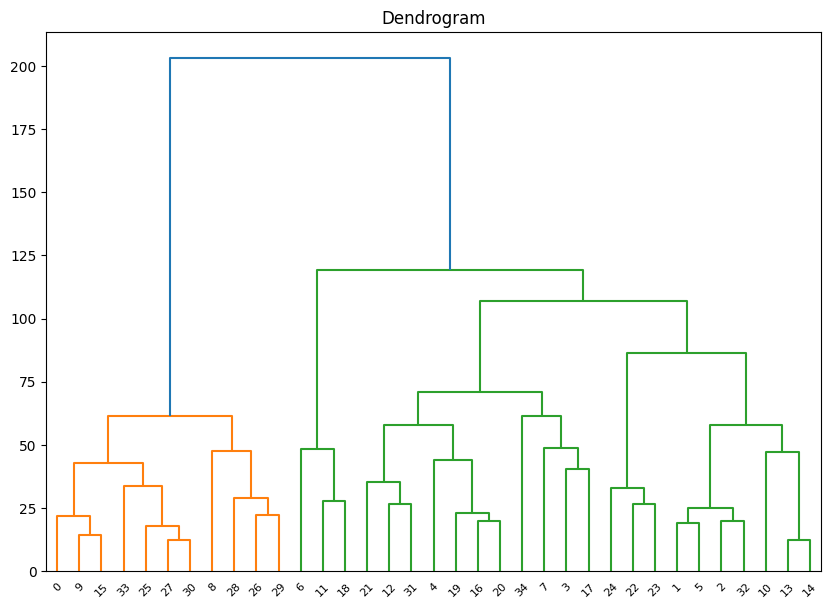

Etichette dei cluster: [27 30 28 33 29 31 23 21 25 32 13 22 10 34 26 18 14 19  6 12 24 17 11 20
  9 15  5 16  4  7  8  2  3  1  0]


In [19]:
#Hierarchical clustering agglomerative
# Definire il modello di clustering gerarchico
cluster_model = AgglomerativeClustering(n_clusters=None, distance_threshold=0).fit(X) #The linkage distance threshold at or above which clusters will not be merged. = 0 ha senso solo se si desidera ottenere un dendrogramma completo, senza effettuare alcuna fusione automatica dei cluster

# Visualizzare il dendrogramma
plt.figure(figsize=(10, 7))
plt.title("Dendrogram")
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.show()

# Ottenere le etichette dei cluster
cluster_labels = cluster_model.labels_

# Stampare le etichette dei cluster
print("Etichette dei cluster:", cluster_labels)

#asse y distanza tra i cluster, asse x il numero dei cluster


Numero di componenti principali: 35
Varianza spiegata cumulativa: [0.51002062 0.6538381  0.75877337 0.81692509 0.86253073 0.88669916
 0.90445441 0.91748753 0.92862125 0.93829866 0.94735095 0.95468069
 0.96139959 0.96696211 0.97230238 0.97637433 0.98023442 0.98353143
 0.9862761  0.98856943 0.99062757 0.99235344 0.99365556 0.99476503
 0.99571874 0.99663348 0.99741698 0.99799327 0.99845253 0.99890543
 0.99926599 0.99956689 0.99979691 1.         1.        ]


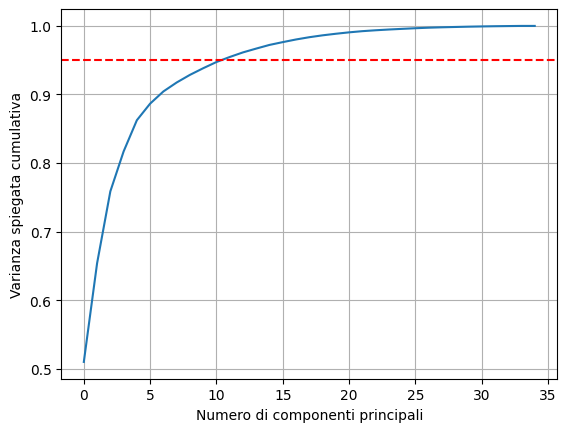

In [20]:
# Applica la PCA
pca = PCA() # se non indico il numero di componenti prende il minimo tra il numero di samples (41) e il numero di features (491)
X_pca = pca.fit_transform(X)

# Numero di componenti principali
num_components = pca.n_components_
print("Numero di componenti principali:", num_components)

# Varianza spiegata cumulativa
explained_variance_ratio_cumulative = np.cumsum(pca.explained_variance_ratio_)
print("Varianza spiegata cumulativa:", explained_variance_ratio_cumulative)

plt.plot(explained_variance_ratio_cumulative)
plt.axhline(y=0.95, color='r', linestyle='--') #retta al 95%
plt.xlabel('Numero di componenti principali')
plt.ylabel('Varianza spiegata cumulativa')
plt.grid(True)
plt.show()

In [21]:
pca = PCA(n_components=12)  # n_components = 10 per 95%, n_components = 22 per 99%
X_pca = pca.fit_transform(X)
X_pca.shape

(35, 12)

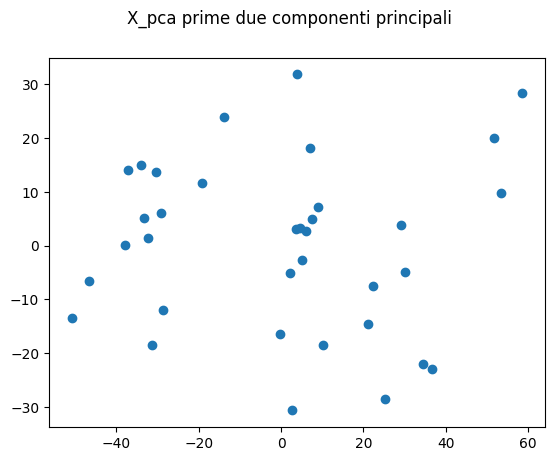

In [22]:
#plotto sulle prime due componenti principali X_pca
pca = PCA(n_components=2)  # n_components = 10 per 95%, n_components = 22 per 99%
X_pca2_plot = pca.fit_transform(X) #41x2
pl.scatter(X_pca2_plot[:, 0], X_pca2_plot[:, 1]) #plotto prima tutte le righe della prima colonna di X_pca_plot e poi tutte le righe della seconda colonna
plt.suptitle('X_pca prime due componenti principali')
plt.show()

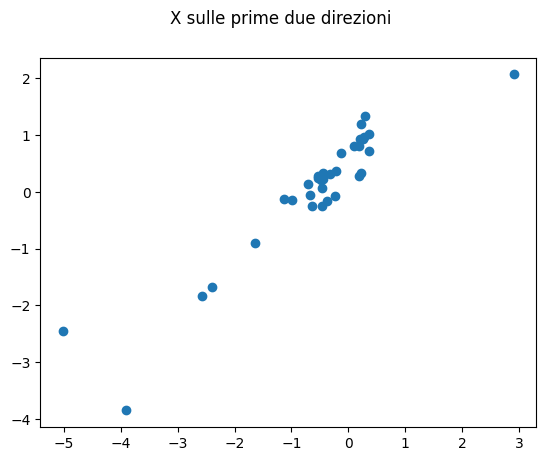

In [23]:
#plot X sulle prime due direzioni
pl.scatter(X[:,0], X[:,1])
plt.suptitle('X sulle prime due direzioni')
plt.show()

Clusterizzazione

clusterization 2 iteration number 0 max_sil_avg =  0.27028596113403847
clusterization 2 iteration number 0 max_sil_avg =  0.27028596113403847
clusterization 3 iteration number 0 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 0 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 0 max_sil_avg =  0.26844872926436586
clusterization 4 iteration number 0 max_sil_avg =  0.26844872926436586
clusterization 5 iteration number 0 max_sil_avg =  0.25349494147795354
clusterization 5 iteration number 0 max_sil_avg =  0.25349494147795354
clusterization 6 iteration number 0 max_sil_avg =  0.2317627542852741
clusterization 6 iteration number 0 max_sil_avg =  0.2317627542852741


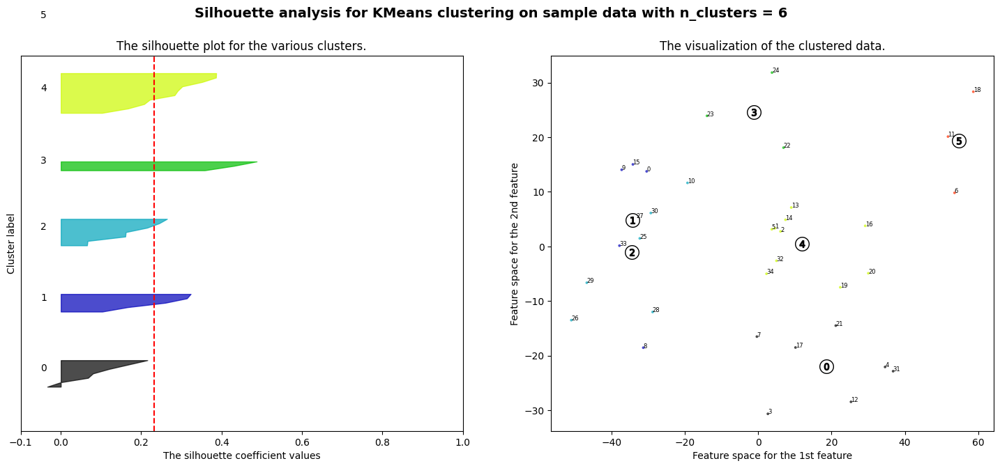

clusterization 7 iteration number 0 max_sil_avg =  0.2419478123121288
clusterization 7 iteration number 0 max_sil_avg =  0.2419478123121288
clusterization 8 iteration number 0 max_sil_avg =  0.22492854984483557
clusterization 8 iteration number 0 max_sil_avg =  0.22492854984483557
clusterization 2 iteration number 1 max_sil_avg =  0.3313391752080792
clusterization 6 iteration number 1 max_sil_avg =  0.23543235315847838


<Figure size 640x480 with 0 Axes>

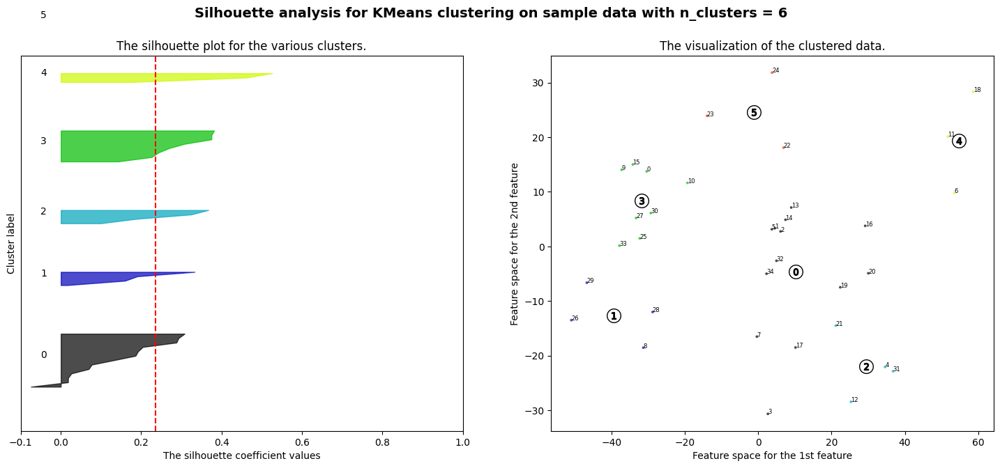

clusterization 8 iteration number 1 max_sil_avg =  0.28626367924701174
clusterization 7 iteration number 2 max_sil_avg =  0.27722209775247053
clusterization 5 iteration number 3 max_sil_avg =  0.2780309033917074
clusterization 6 iteration number 3 max_sil_avg =  0.27890324378560155


<Figure size 640x480 with 0 Axes>

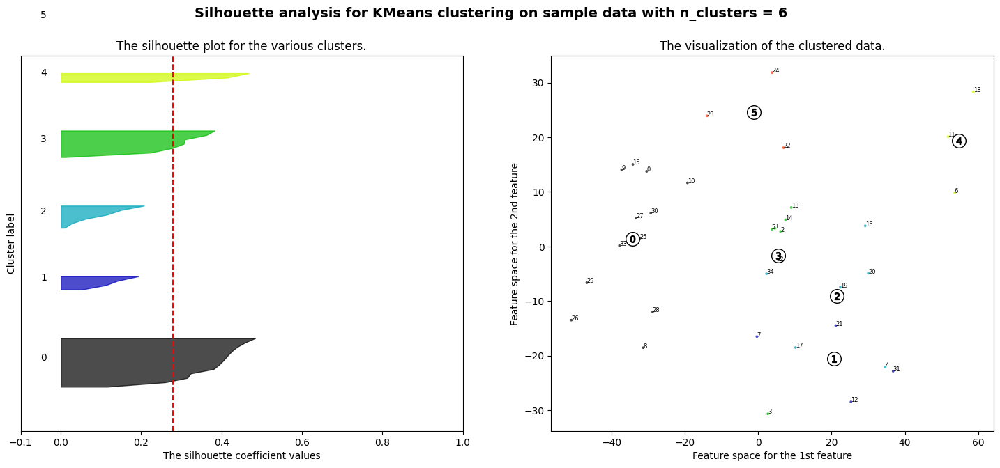

clusterization 2 iteration number 4 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5 max_sil_avg =  0.3313391752080792
clusterization 8 iteration number 5 max_sil_avg =  0.3003179887688385
clusterization 2 iteration number 6 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 8 max_sil_avg =  0.273179863010174
clusterization 5 iteration number 8 max_sil_avg =  0.2790760126679324
clusterization 4 iteration number 9 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 10 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 12 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 12 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 13 max_sil_avg =  0.3313391752080792
clusterization

<Figure size 640x480 with 0 Axes>

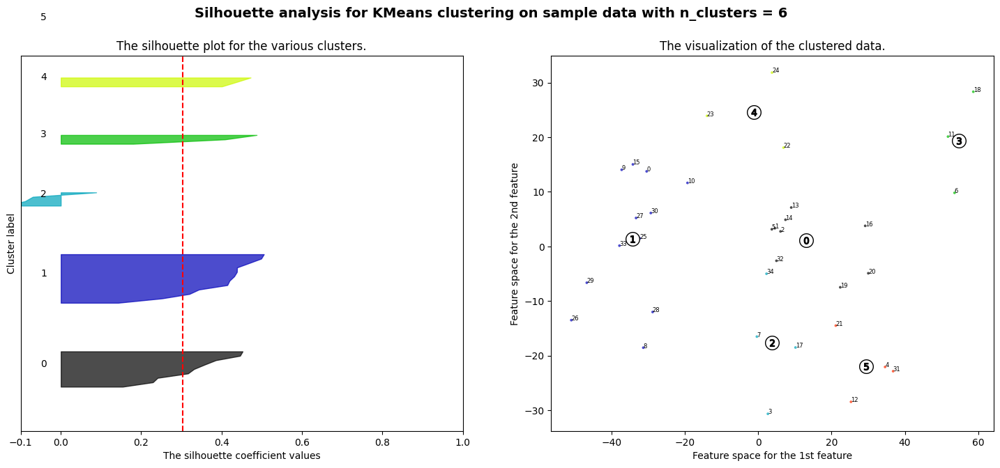

clusterization 2 iteration number 16 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 16 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 16 max_sil_avg =  0.33185350824204135
clusterization 5 iteration number 16 max_sil_avg =  0.30830235666569833
clusterization 7 iteration number 17 max_sil_avg =  0.28276145845454514
clusterization 2 iteration number 18 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 18 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 19 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 20 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 20 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 21 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 22 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 23 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 24 max_sil_avg =  0.3066524256754517

<Figure size 640x480 with 0 Axes>

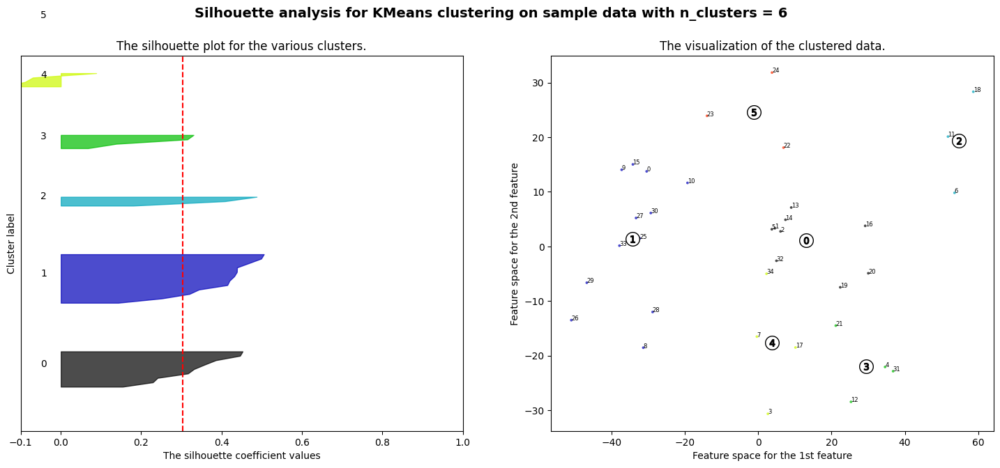

clusterization 2 iteration number 35 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 36 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 36 max_sil_avg =  0.33185350824204135
clusterization 3 iteration number 37 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 38 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 38 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 39 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 40 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 42 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 42 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 43 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 43 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 44 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 44 max_sil_avg =  0.30665242567545176

<Figure size 640x480 with 0 Axes>

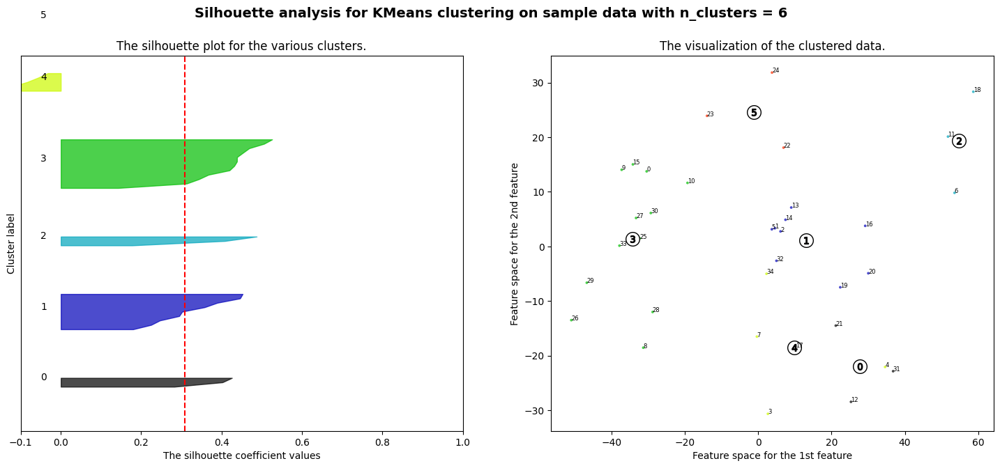

clusterization 2 iteration number 184 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 184 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 185 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 186 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 187 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 187 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 188 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 188 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 189 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 190 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 191 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 192 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 192 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 193 max_sil_avg =  0.331

<Figure size 640x480 with 0 Axes>

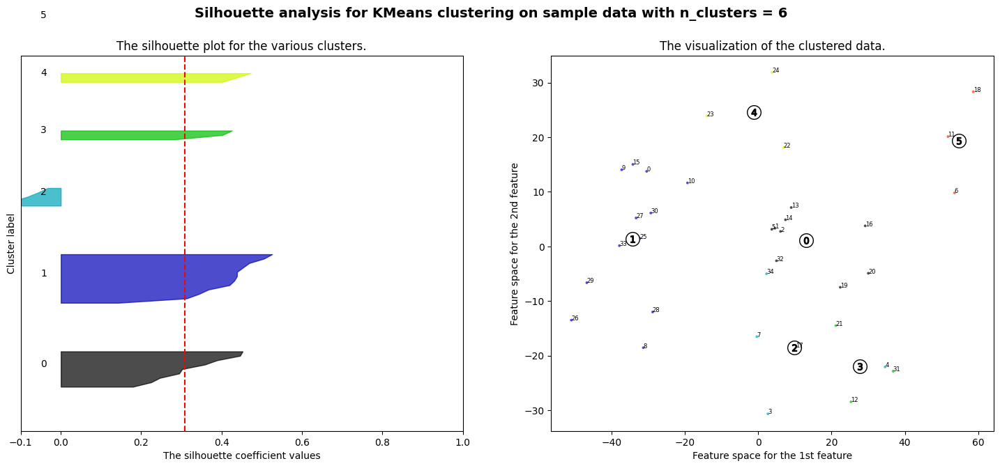

clusterization 2 iteration number 313 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 314 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 316 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 316 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 317 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 319 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 320 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 323 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 323 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 324 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 325 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 326 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 327 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 327 max_sil_avg =  0.30665

<Figure size 640x480 with 0 Axes>

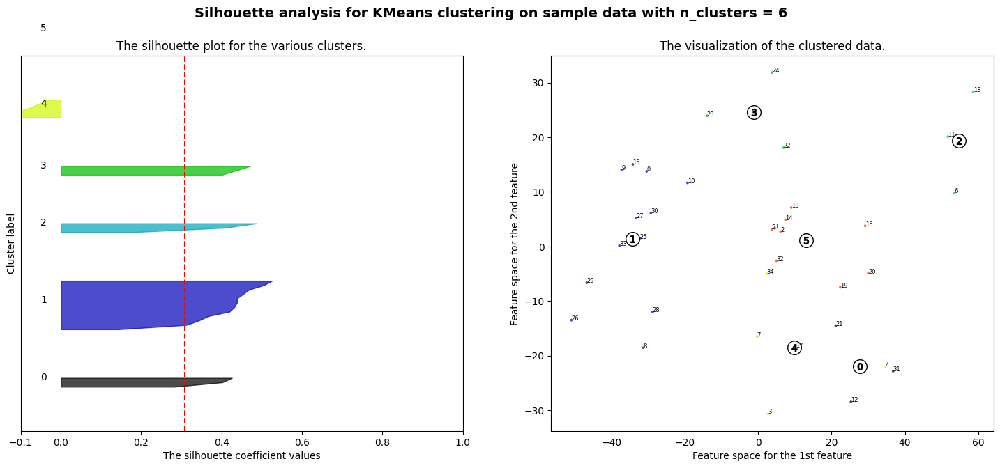

clusterization 2 iteration number 465 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 465 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 466 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 467 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 467 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 468 max_sil_avg =  0.3313391752080792
clusterization 7 iteration number 468 max_sil_avg =  0.3065024816052255
clusterization 2 iteration number 469 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 469 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 470 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 473 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 474 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 474 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 475 max_sil_avg =  0.33133

<Figure size 640x480 with 0 Axes>

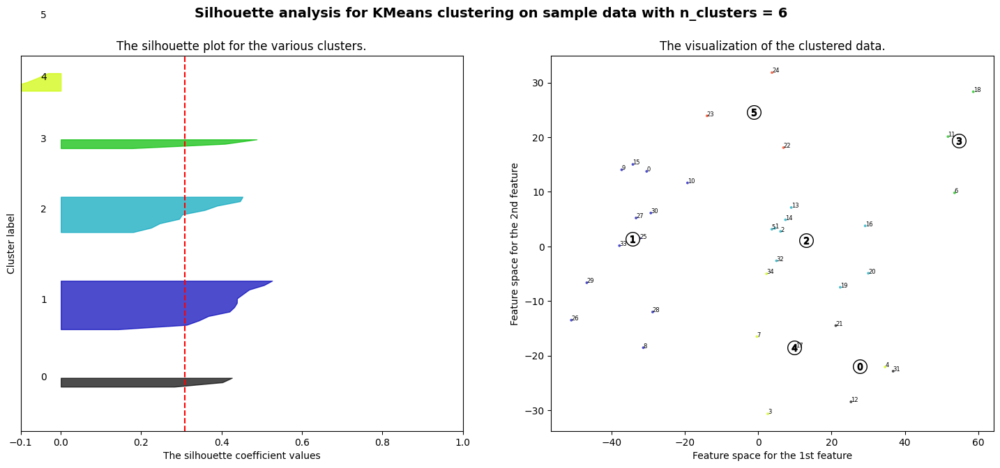

clusterization 2 iteration number 555 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 556 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 556 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 557 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 557 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 557 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 558 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 560 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 561 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 561 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 561 max_sil_avg =  0.33185350824204135
clusterization 3 iteration number 563 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 564 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 566 max_sil_avg =  0.33

<Figure size 640x480 with 0 Axes>

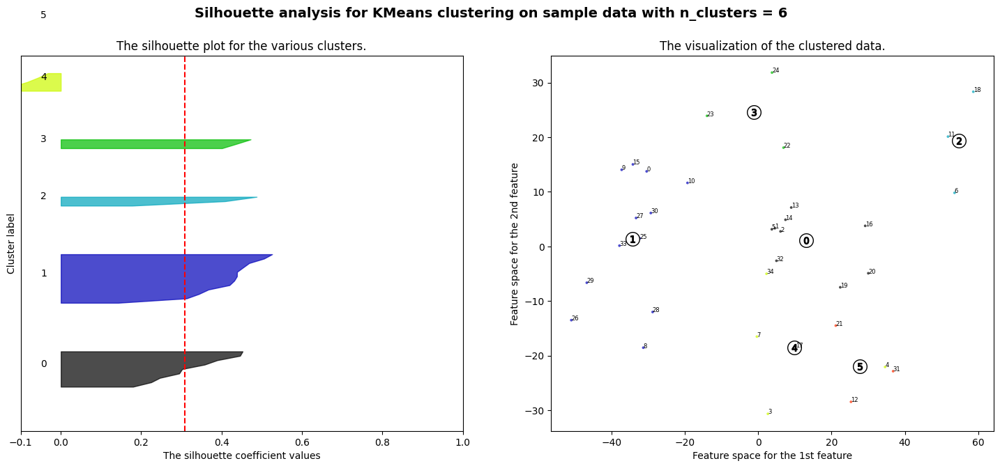

clusterization 2 iteration number 651 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 651 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 653 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 653 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 654 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 655 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 656 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 658 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 659 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 659 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 660 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 661 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 662 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 663 max_sil_avg =  0.331339

<Figure size 640x480 with 0 Axes>

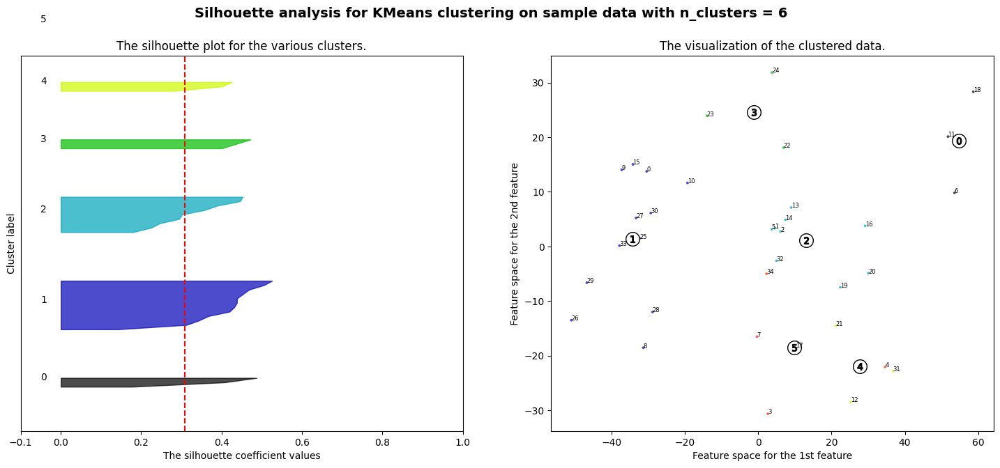

clusterization 2 iteration number 876 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 877 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 877 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 878 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 878 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 879 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 879 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 880 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 881 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 883 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 887 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 887 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 888 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 888 max_sil_avg =  0.3066

<Figure size 640x480 with 0 Axes>

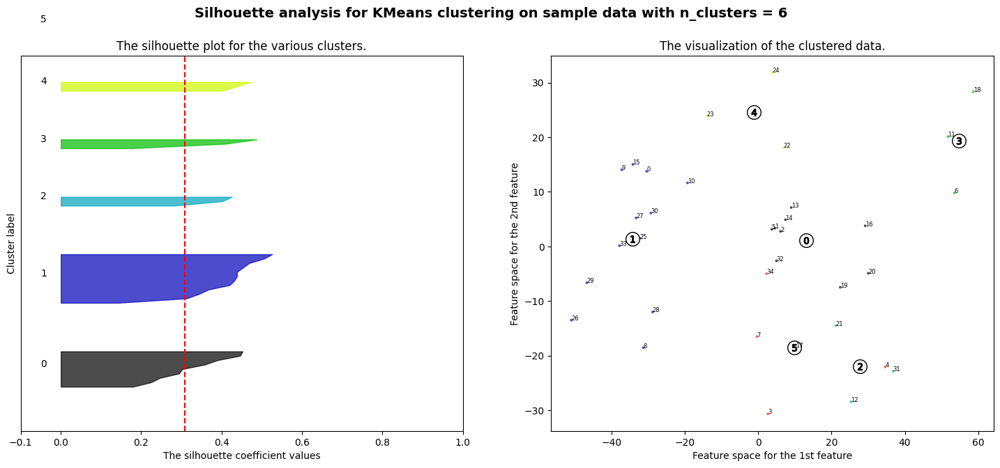

clusterization 2 iteration number 1560 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 1560 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 1561 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 1563 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 1564 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 1565 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 1567 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 1567 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 1568 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 1570 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 1571 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 1573 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 1575 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 1576 max_sil_av

<Figure size 640x480 with 0 Axes>

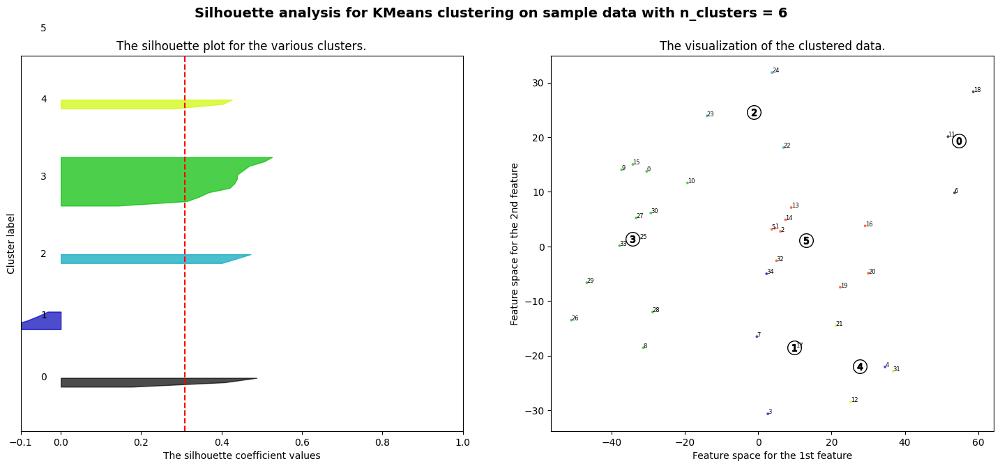

clusterization 2 iteration number 1958 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 1958 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 1958 max_sil_avg =  0.33185350824204135
clusterization 4 iteration number 1959 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 1960 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 1961 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 1962 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 1962 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 1963 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 1964 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 1964 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 1964 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 1965 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 1965 max_s

<Figure size 640x480 with 0 Axes>

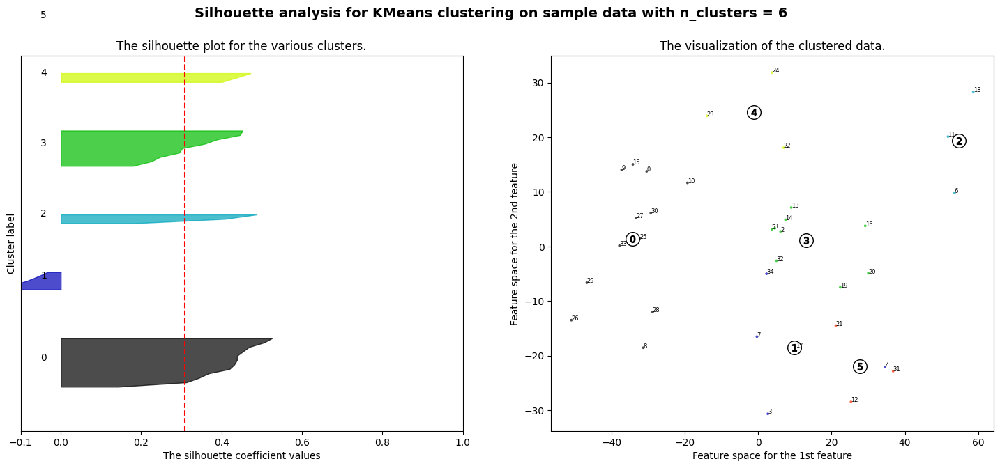

clusterization 4 iteration number 2018 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 2019 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2020 max_sil_avg =  0.3313391752080792
clusterization 6 iteration number 2021 max_sil_avg =  0.30791347448636325


<Figure size 640x480 with 0 Axes>

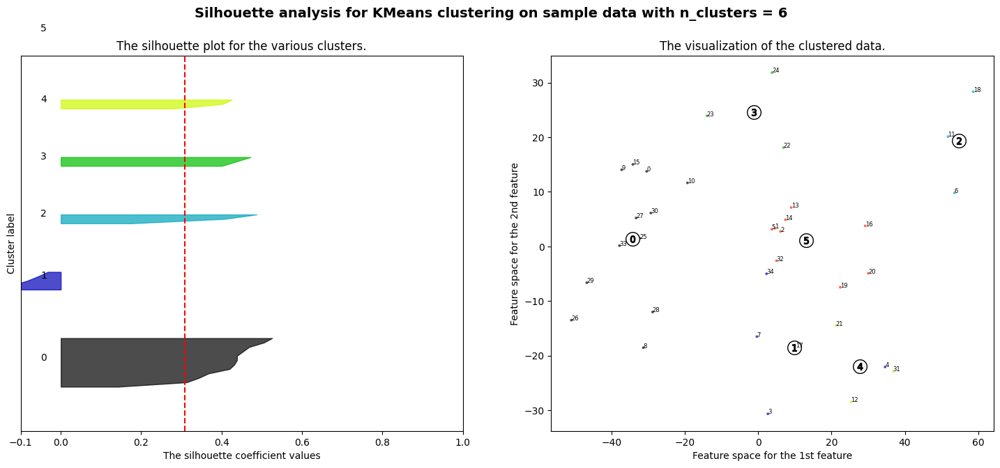

clusterization 2 iteration number 2022 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2024 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2025 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2026 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2027 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2029 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2031 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2031 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2032 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2032 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2033 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2034 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2035 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2036 max_sil_av

<Figure size 640x480 with 0 Axes>

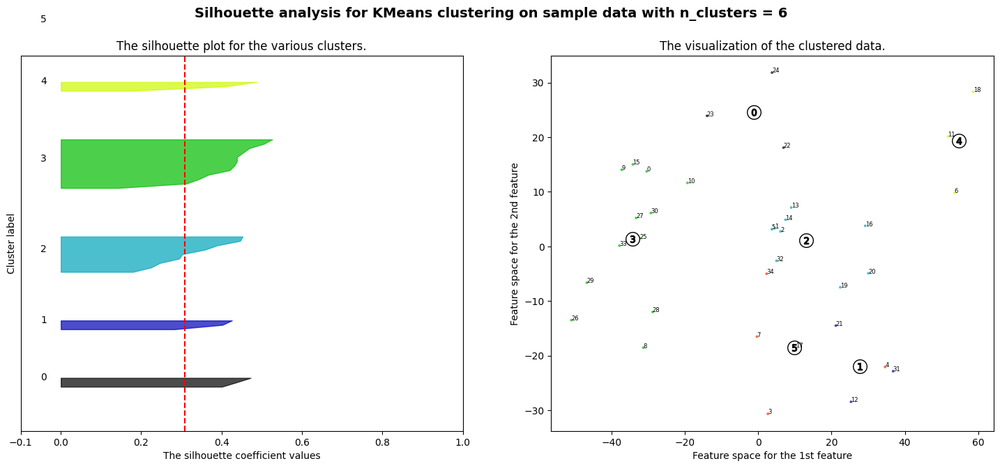

clusterization 2 iteration number 2096 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 2096 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 2098 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2098 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2099 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2102 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2104 max_sil_avg =  0.30665242567545176
clusterization 6 iteration number 2104 max_sil_avg =  0.30791347448636325


<Figure size 640x480 with 0 Axes>

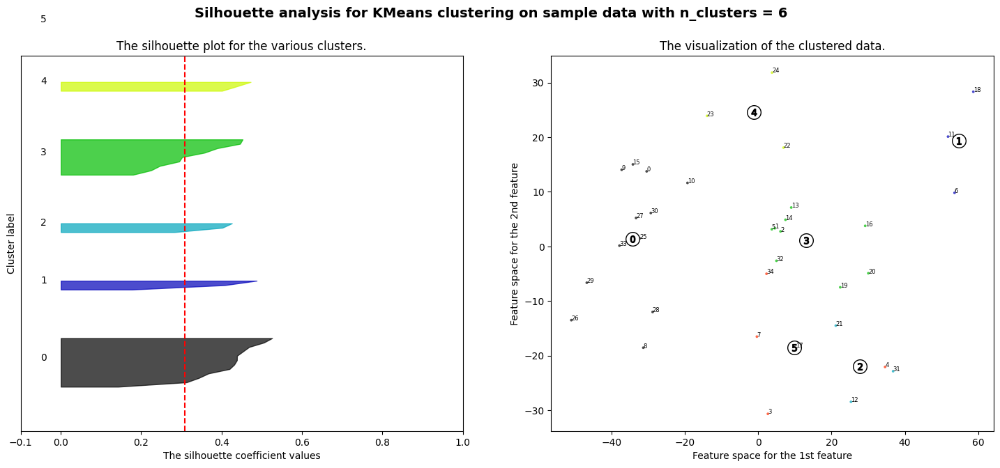

clusterization 2 iteration number 2105 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2105 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2106 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2107 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 2107 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 2108 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2109 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2109 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2110 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2113 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2114 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2115 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 2115 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 2116 max_sil_

<Figure size 640x480 with 0 Axes>

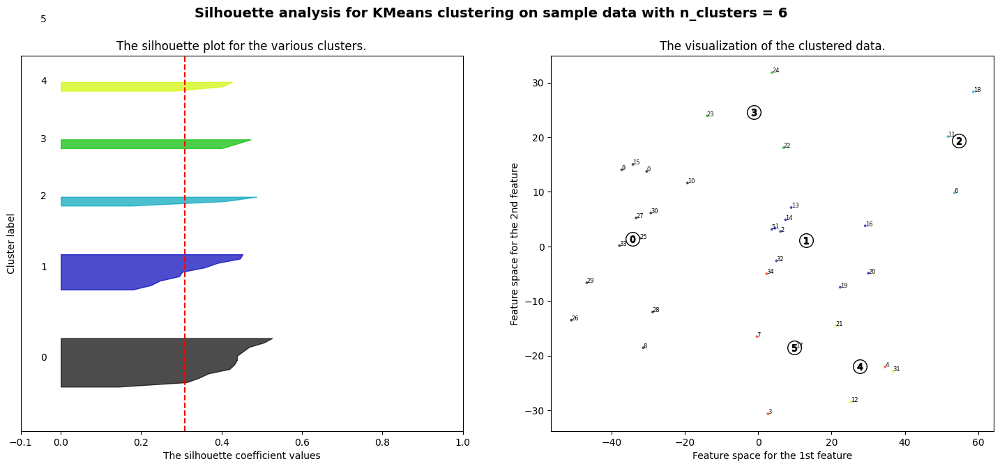

clusterization 2 iteration number 2127 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2127 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2128 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2129 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2131 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2131 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2132 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2132 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2133 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2134 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2134 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2135 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2136 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2137 max_sil_

<Figure size 640x480 with 0 Axes>

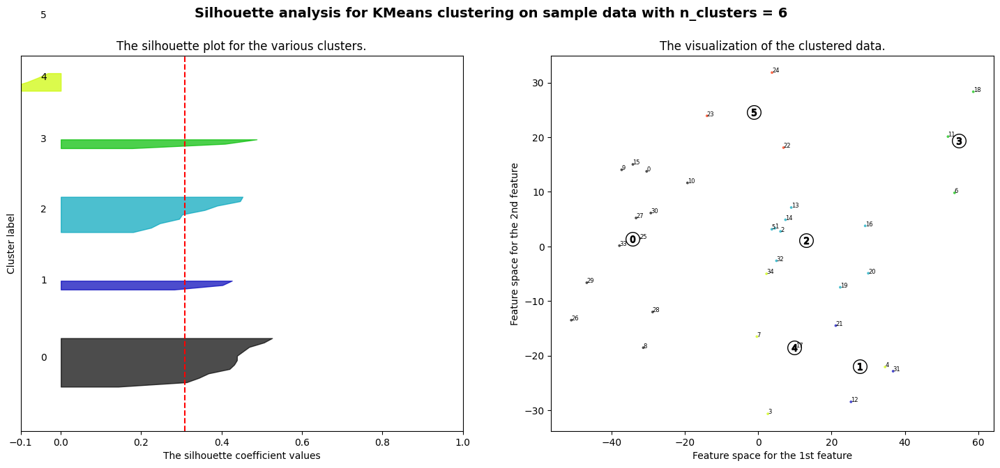

clusterization 2 iteration number 2157 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2157 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2158 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2159 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2159 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2161 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2162 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2162 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2163 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2164 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2164 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 2165 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2166 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2167 max_sil

<Figure size 640x480 with 0 Axes>

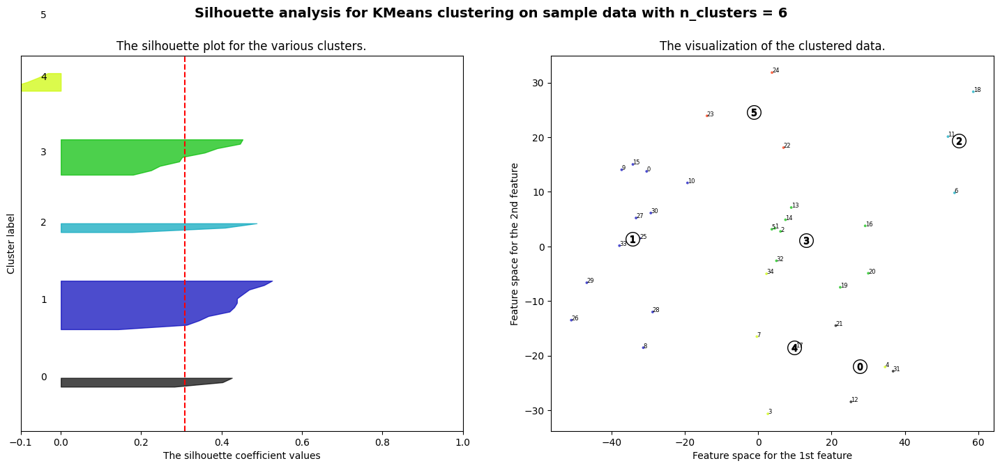

clusterization 2 iteration number 2253 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2254 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2254 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2256 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 2256 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 2257 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2259 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2259 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2260 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2261 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 2262 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 2262 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 2263 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 2263 max_si

<Figure size 640x480 with 0 Axes>

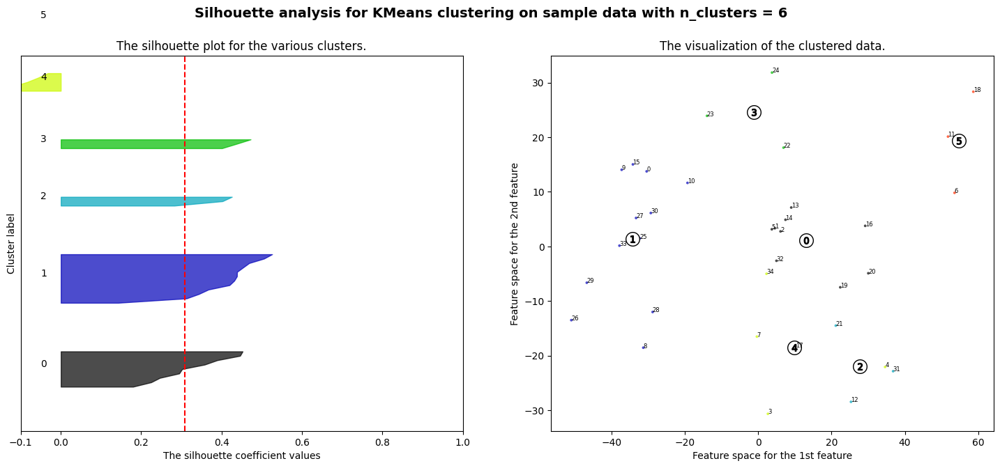

clusterization 2 iteration number 2288 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2288 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2289 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2290 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2291 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2293 max_sil_avg =  0.3313391752080792
clusterization 5 iteration number 2294 max_sil_avg =  0.3152966644188816
clusterization 2 iteration number 2295 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2295 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2296 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2296 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2297 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2297 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2298 max_sil_

<Figure size 640x480 with 0 Axes>

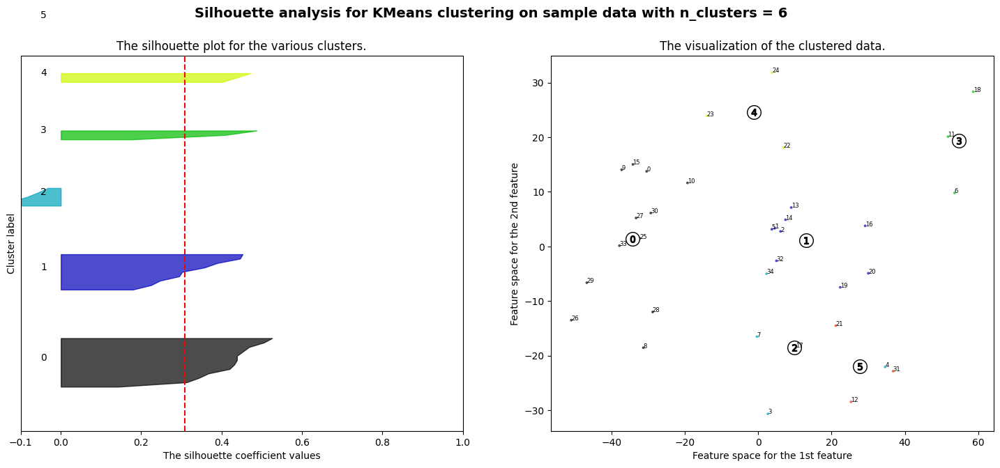

clusterization 2 iteration number 2439 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2440 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2440 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 2440 max_sil_avg =  0.33185350824204135
clusterization 6 iteration number 2440 max_sil_avg =  0.30791347448636325


<Figure size 640x480 with 0 Axes>

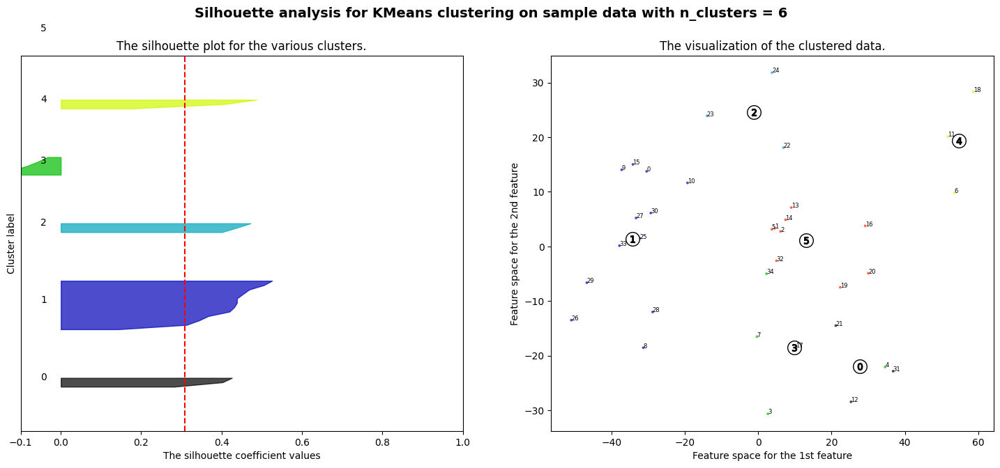

clusterization 2 iteration number 2441 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2442 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2443 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2444 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2446 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2447 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 2447 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 2449 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2450 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2451 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 2452 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 2453 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2454 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2455 max_sil_a

<Figure size 640x480 with 0 Axes>

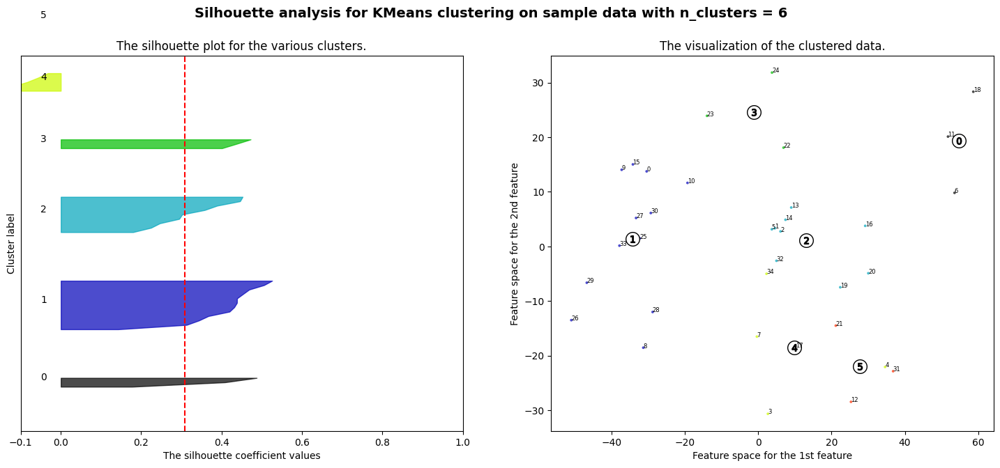

clusterization 2 iteration number 2560 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2561 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2561 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2562 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2562 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2563 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2563 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2564 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2565 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2566 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2566 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 2567 max_sil_avg =  0.30665242567545176
clusterization 5 iteration number 2567 max_sil_avg =  0.3152966644188816
clusterization 2 iteration number 2568 max_sil

<Figure size 640x480 with 0 Axes>

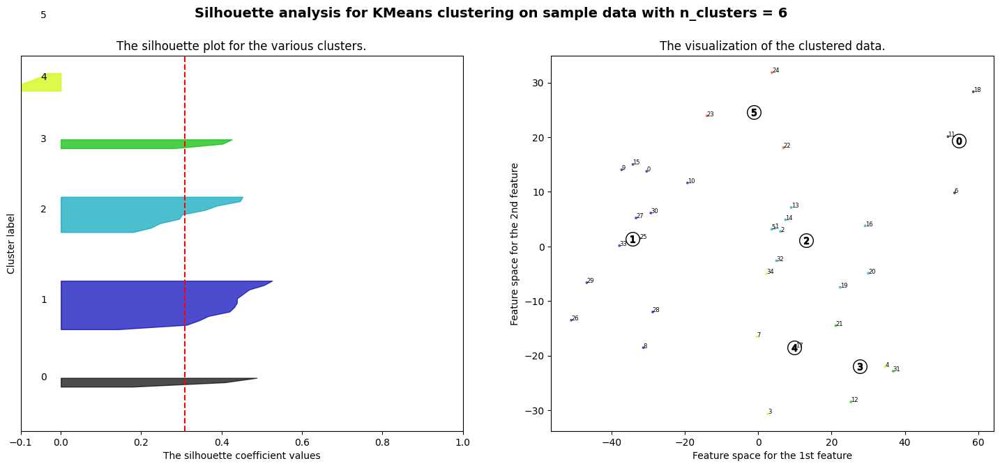

clusterization 2 iteration number 2696 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2696 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2697 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2697 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2698 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2699 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2701 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2704 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2704 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2705 max_sil_avg =  0.3313391752080792
clusterization 7 iteration number 2705 max_sil_avg =  0.3065466447685414
clusterization 2 iteration number 2706 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2707 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2708 max_sil_a

<Figure size 640x480 with 0 Axes>

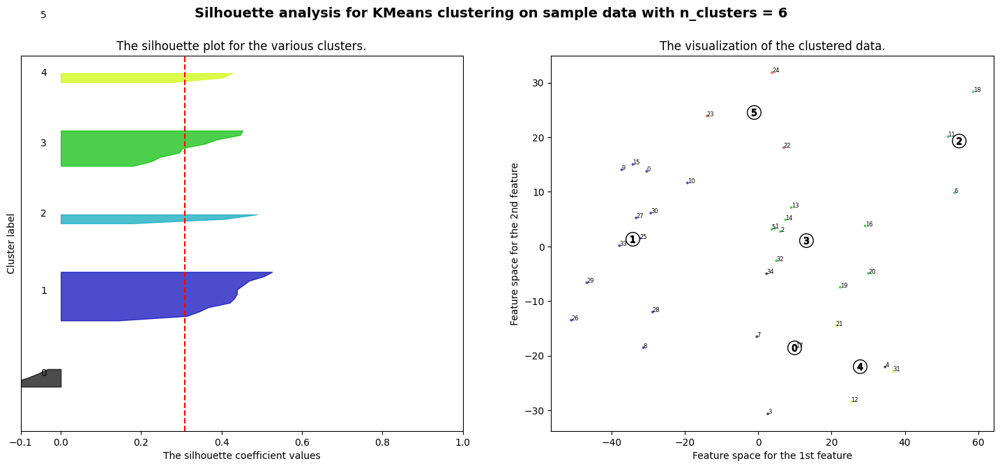

clusterization 2 iteration number 2881 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2882 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2883 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2884 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2885 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2886 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2887 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2887 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2888 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2889 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2890 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2890 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2891 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2891 max_sil_a

<Figure size 640x480 with 0 Axes>

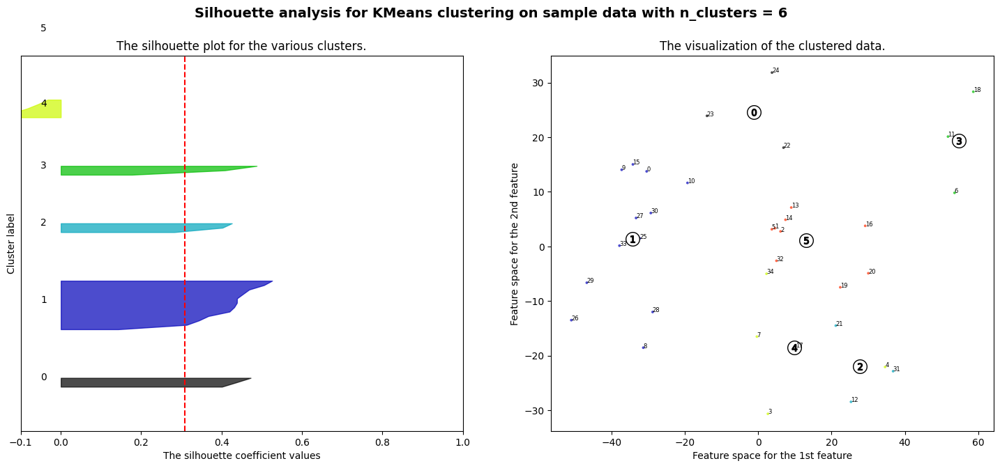

clusterization 2 iteration number 2912 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2913 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2914 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2914 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 2915 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2916 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2917 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2918 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2919 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2920 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2921 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2922 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 2923 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 2924 max_sil_avg

<Figure size 640x480 with 0 Axes>

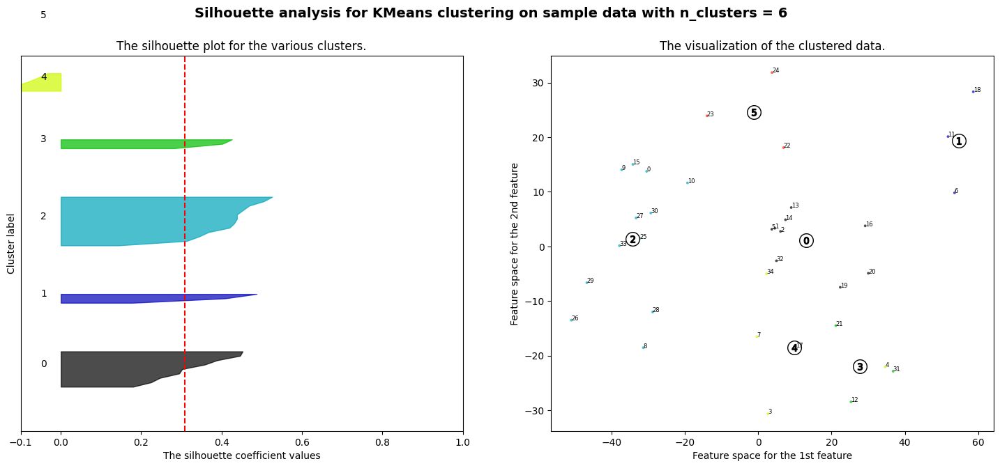

clusterization 2 iteration number 3019 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3020 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3021 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 3021 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 3022 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3022 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3023 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3024 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3025 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3025 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3027 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3028 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3028 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 3030 max_sil_

<Figure size 640x480 with 0 Axes>

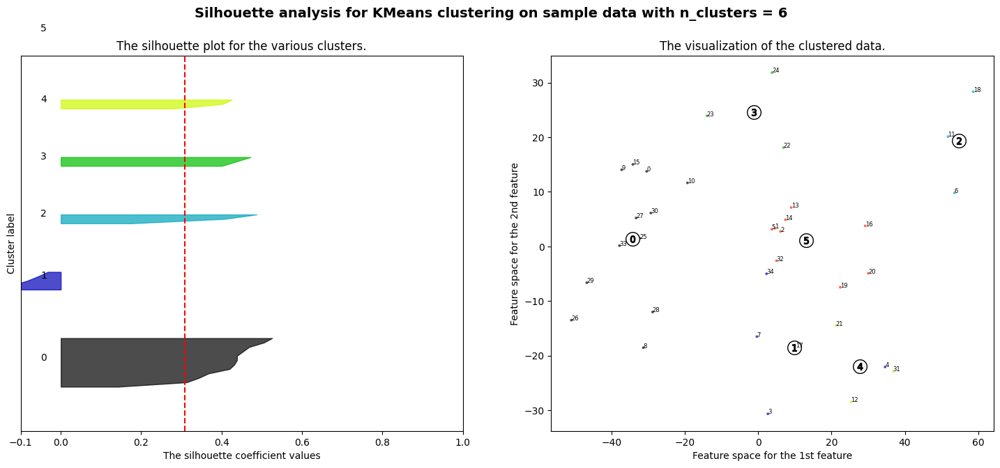

clusterization 2 iteration number 3137 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3137 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3138 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3138 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3139 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3140 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3141 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3142 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 3142 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 3143 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3145 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3146 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 3146 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 3147 max_sil_

<Figure size 640x480 with 0 Axes>

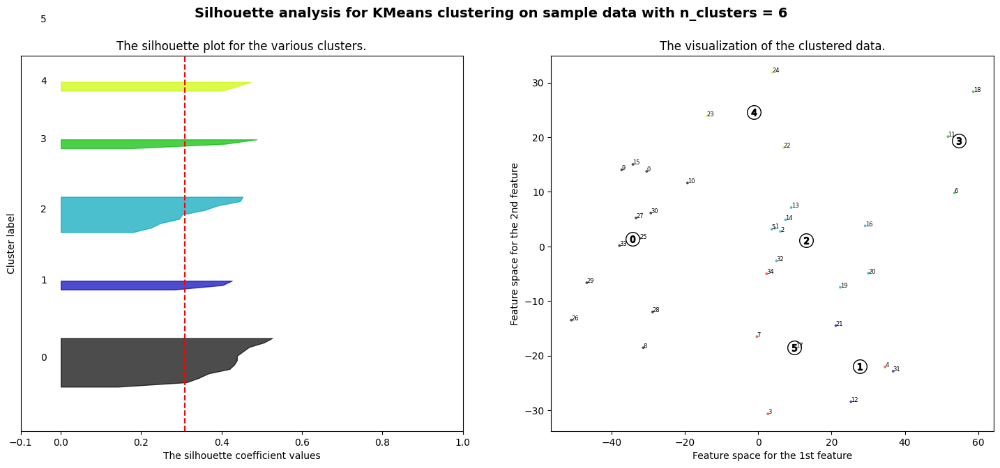

clusterization 2 iteration number 3570 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3571 max_sil_avg =  0.3313391752080792
clusterization 5 iteration number 3571 max_sil_avg =  0.3152966644188816
clusterization 3 iteration number 3572 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 3574 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3575 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3576 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3576 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3577 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 3577 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 3578 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3579 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3580 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 3580 max_sil

<Figure size 640x480 with 0 Axes>

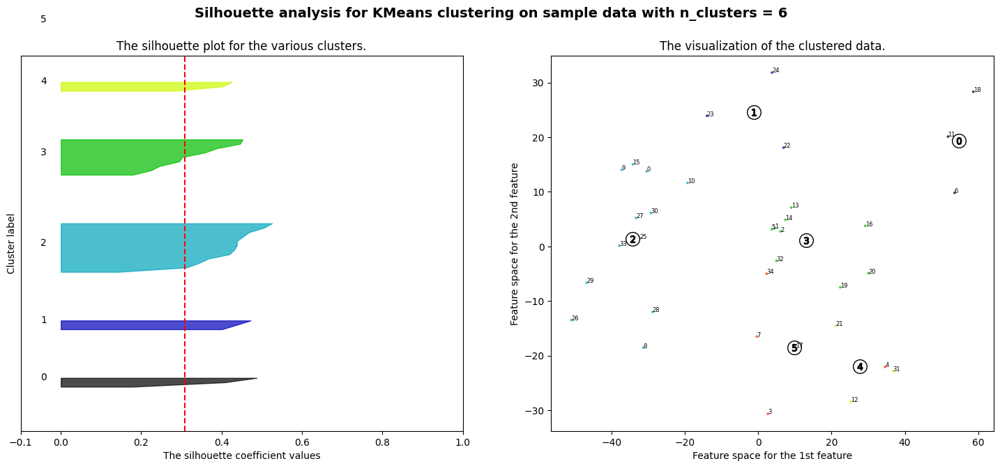

clusterization 2 iteration number 3600 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3601 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 3601 max_sil_avg =  0.33185350824204135
clusterization 4 iteration number 3602 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 3603 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 3603 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 3604 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3605 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3606 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 3606 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 3607 max_sil_avg =  0.3313391752080792
clusterization 6 iteration number 3607 max_sil_avg =  0.30791347448636325


<Figure size 640x480 with 0 Axes>

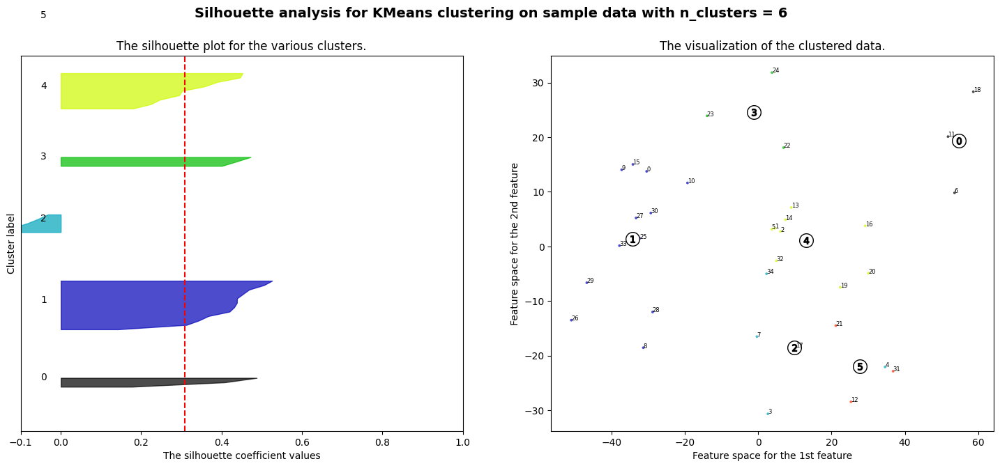

clusterization 2 iteration number 3608 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3610 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 3610 max_sil_avg =  0.33185350824204135
clusterization 6 iteration number 3610 max_sil_avg =  0.30791347448636325


<Figure size 640x480 with 0 Axes>

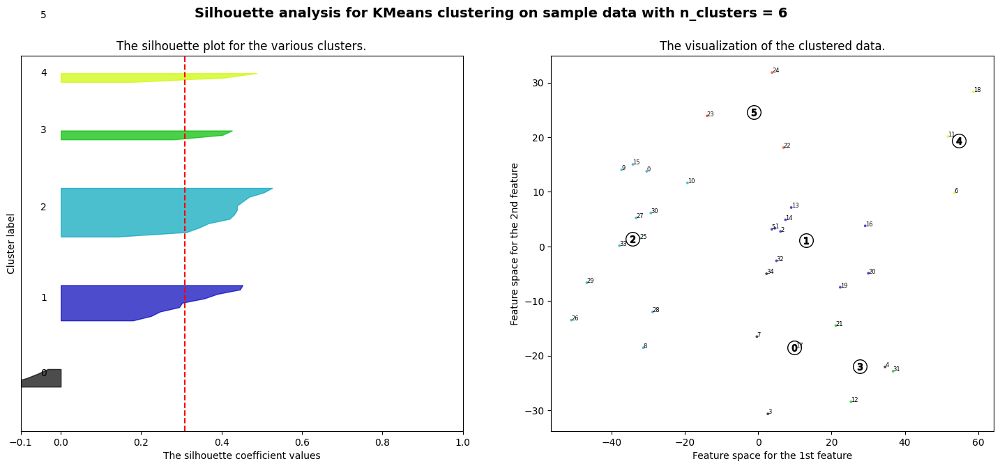

clusterization 3 iteration number 3611 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3612 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3613 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3614 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3615 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3615 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 3616 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 3617 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3618 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3619 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3620 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3620 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3621 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3623 max_sil_

<Figure size 640x480 with 0 Axes>

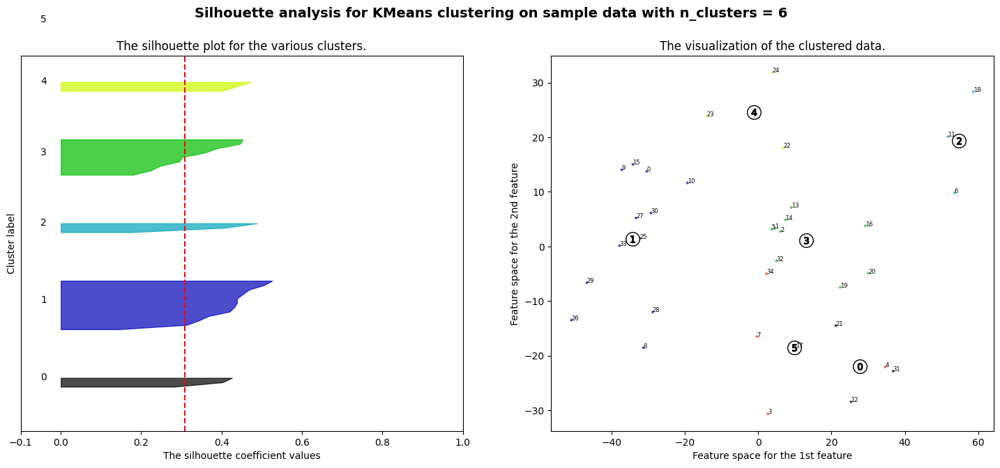

clusterization 2 iteration number 3657 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3658 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 3658 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 3659 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3660 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3660 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3662 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3662 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3663 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3665 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3665 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3666 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3667 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3667 max_sil_

<Figure size 640x480 with 0 Axes>

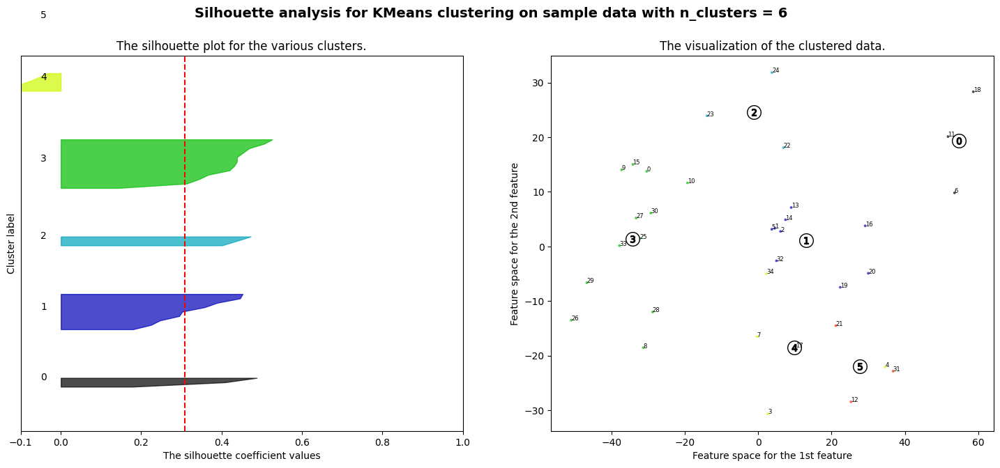

clusterization 2 iteration number 3701 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3701 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3703 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3704 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 3704 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 3706 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3707 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3708 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3708 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3709 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 3709 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 3710 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 3711 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 3712 max_sil

<Figure size 640x480 with 0 Axes>

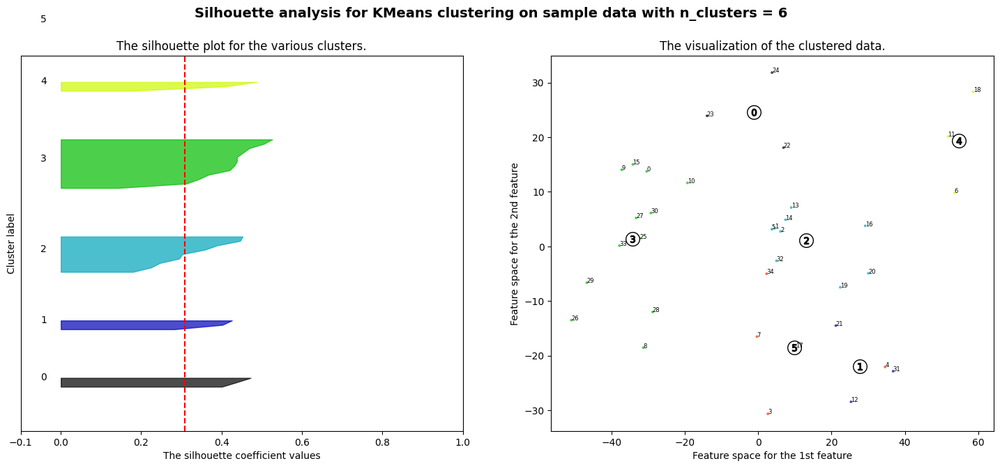

clusterization 2 iteration number 4055 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4056 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4056 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4057 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4059 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4059 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4061 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4061 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4064 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4065 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4066 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4067 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4068 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4069 max_sil_a

<Figure size 640x480 with 0 Axes>

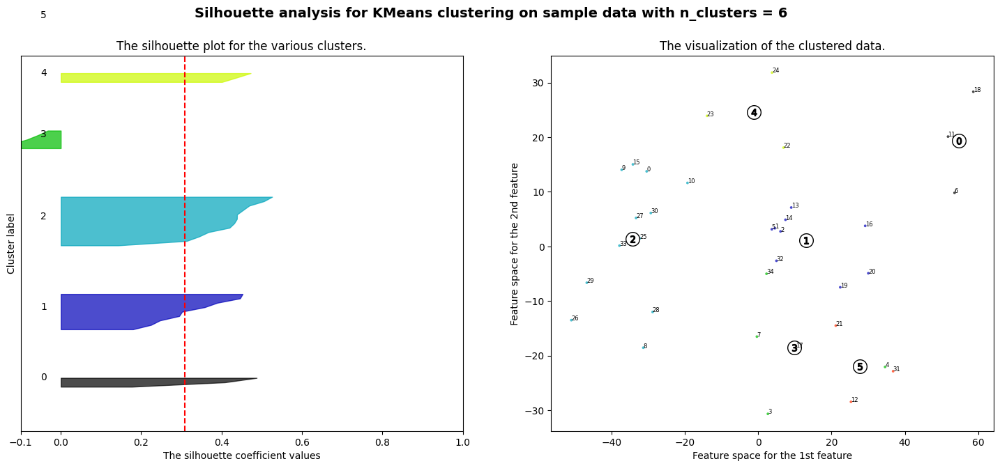

clusterization 2 iteration number 4182 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4182 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4183 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4183 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4184 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4184 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4185 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4186 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4187 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4187 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4189 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4190 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4191 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4191 max_sil_

<Figure size 640x480 with 0 Axes>

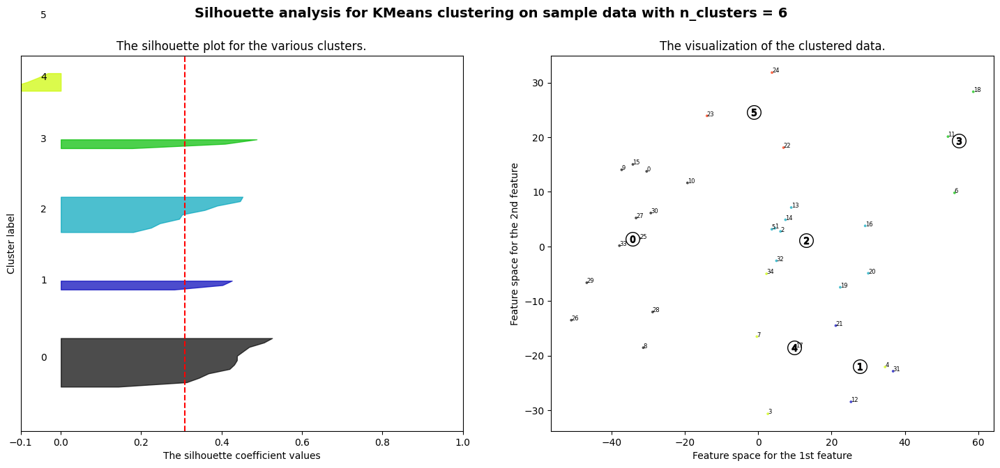

clusterization 2 iteration number 4352 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4353 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4354 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4356 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4357 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4358 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4358 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4359 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4361 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4361 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4362 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 4362 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 4363 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4364 max_sil_a

<Figure size 640x480 with 0 Axes>

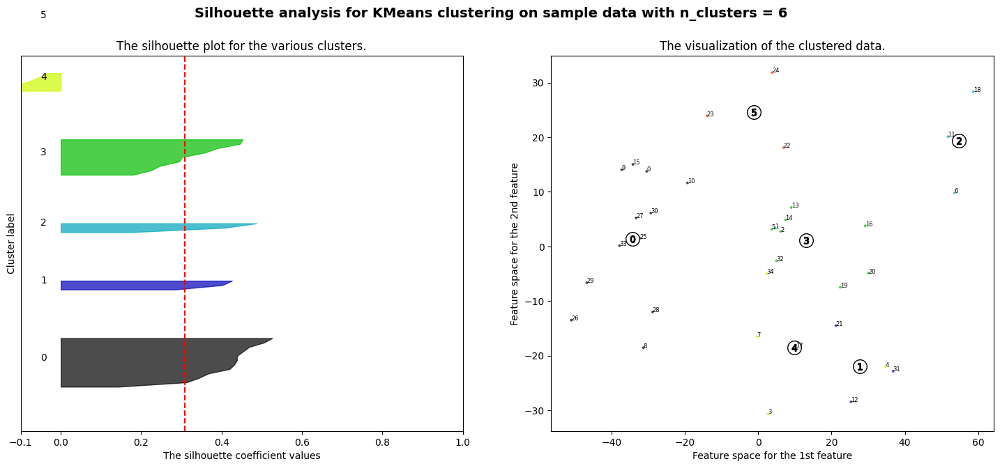

clusterization 2 iteration number 4419 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4419 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4420 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4421 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4422 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4422 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4423 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 4423 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 4424 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4425 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4427 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 4428 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4429 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4430 max_sil

<Figure size 640x480 with 0 Axes>

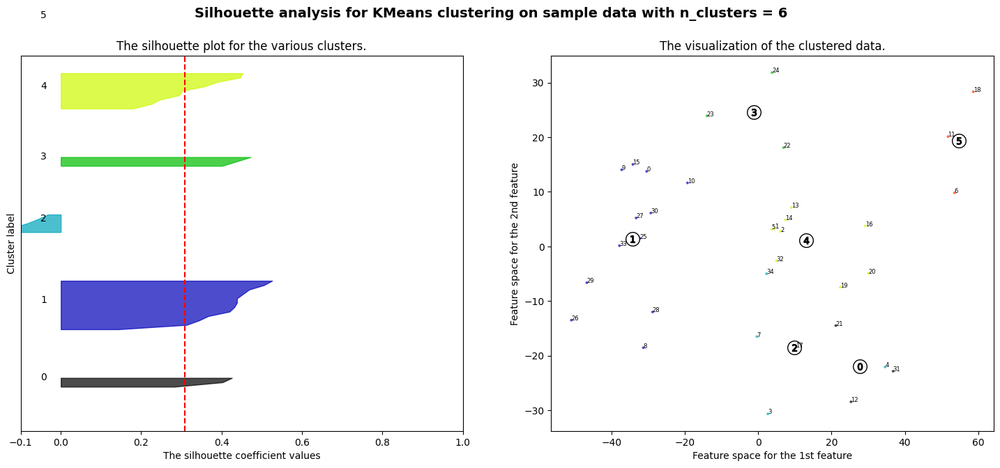

clusterization 2 iteration number 4502 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4502 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4503 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4504 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4505 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4505 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4506 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4507 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4507 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4508 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4509 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4510 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4511 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4512 max_sil_a

<Figure size 640x480 with 0 Axes>

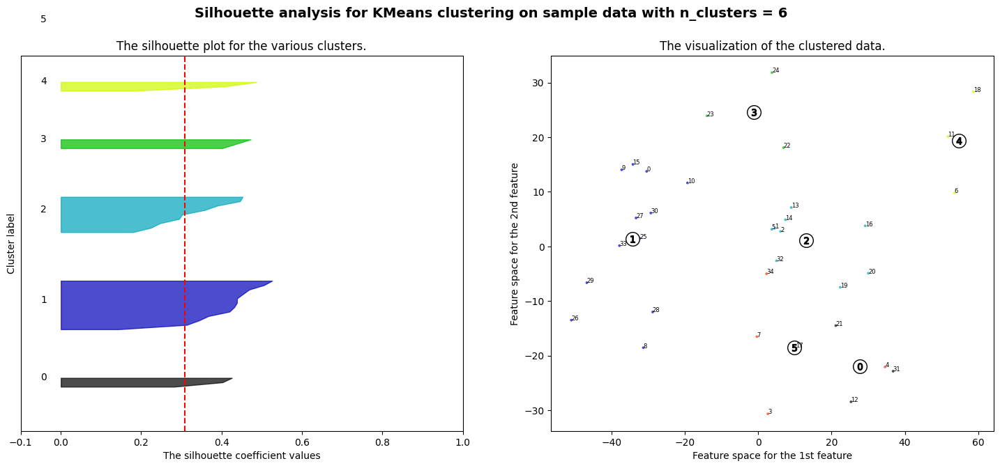

clusterization 2 iteration number 4604 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4606 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4607 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4608 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4609 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4610 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4611 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 4611 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 4612 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4613 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4614 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4615 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4616 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4618 max_sil_avg

<Figure size 640x480 with 0 Axes>

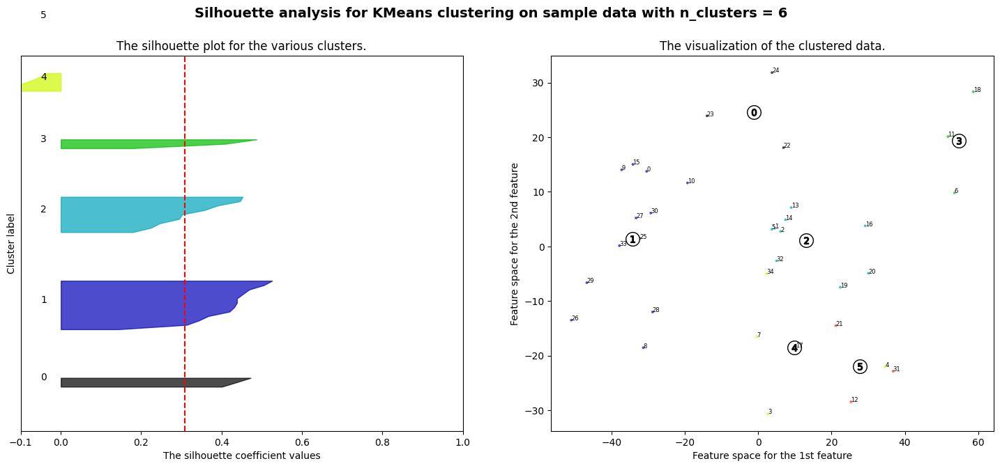

clusterization 2 iteration number 4624 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4625 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4625 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4628 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4629 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4632 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4632 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 4633 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4634 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4634 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4635 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4636 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 4636 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 4637 max_sil

<Figure size 640x480 with 0 Axes>

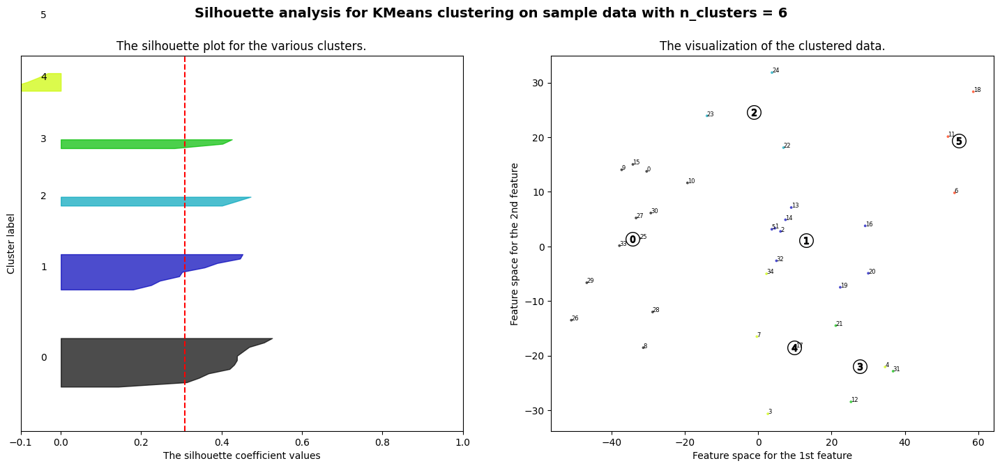

clusterization 2 iteration number 4888 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4888 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4892 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4893 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4894 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4895 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 4895 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 4896 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4898 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 4898 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 4899 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4900 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4901 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 4902 max_sil_

<Figure size 640x480 with 0 Axes>

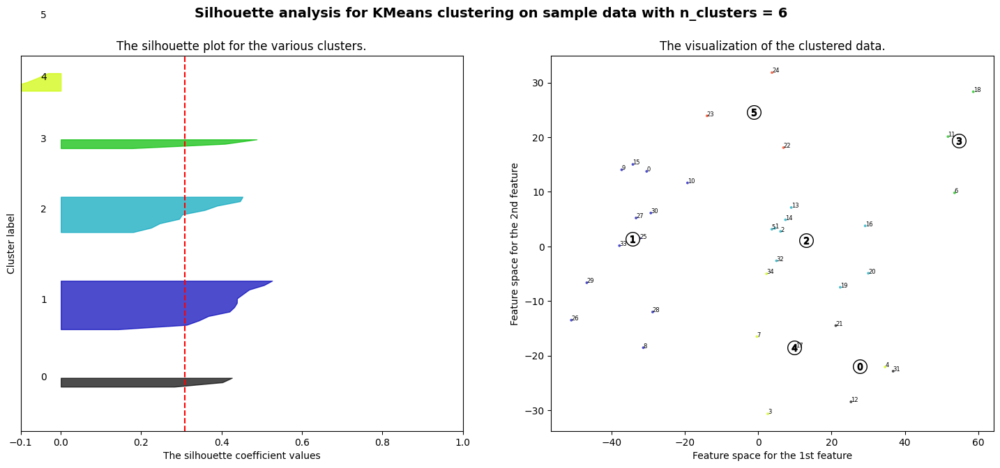

clusterization 2 iteration number 5000 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5001 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5001 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 5002 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5002 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 5004 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5004 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 5007 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5007 max_sil_avg =  0.30665242567545176
clusterization 6 iteration number 5007 max_sil_avg =  0.30791347448636325


<Figure size 640x480 with 0 Axes>

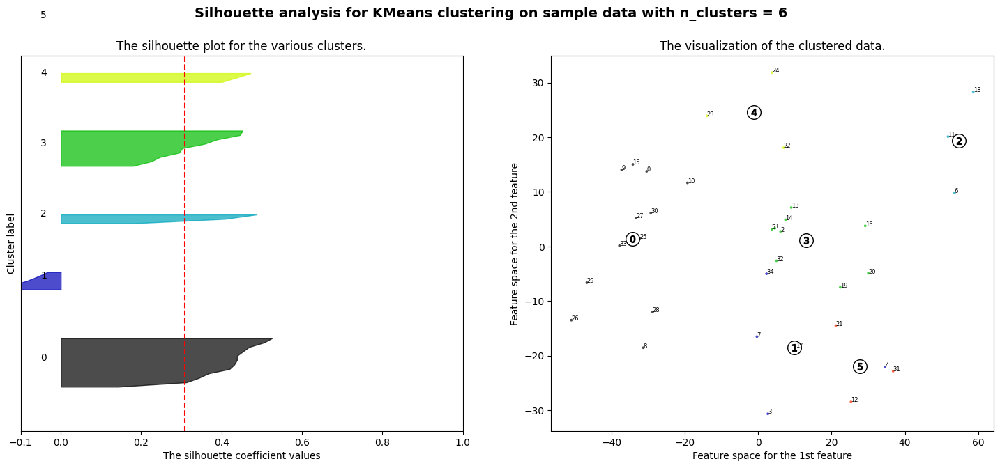

clusterization 2 iteration number 5008 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5009 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5009 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 5010 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 5010 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 5011 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5012 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5013 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5014 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5015 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5017 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5017 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 5018 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5020 max_sil_a

<Figure size 640x480 with 0 Axes>

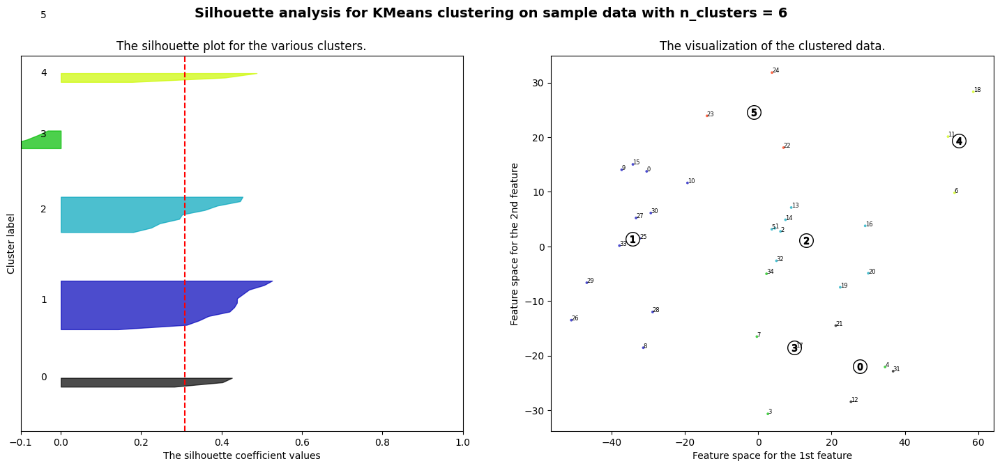

clusterization 2 iteration number 5387 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5388 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5389 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 5389 max_sil_avg =  0.33185350824204135
clusterization 3 iteration number 5390 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 5391 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5393 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5393 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 5394 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5396 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5396 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 5397 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5398 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5398 max_sil_

<Figure size 640x480 with 0 Axes>

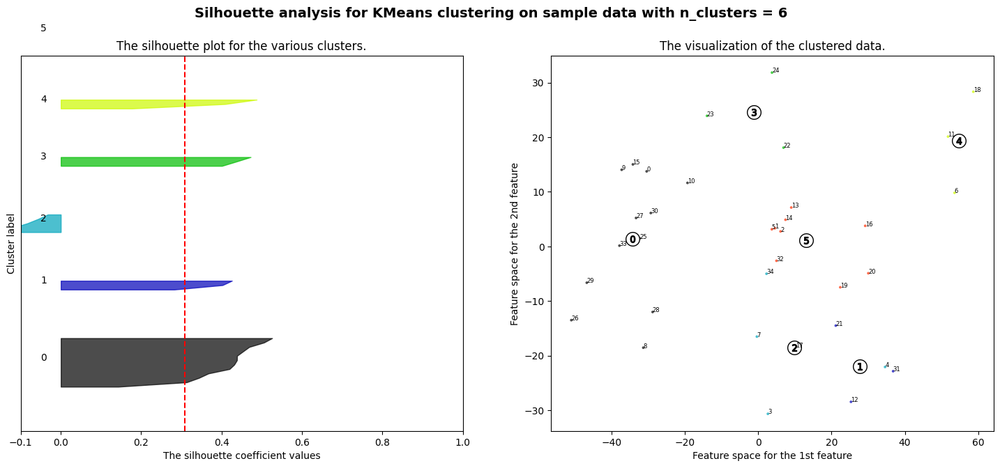

clusterization 2 iteration number 5523 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5523 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 5524 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 5526 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5526 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 5527 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5527 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 5528 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 5528 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 5532 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5533 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5534 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 5536 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 5537 max_si

<Figure size 640x480 with 0 Axes>

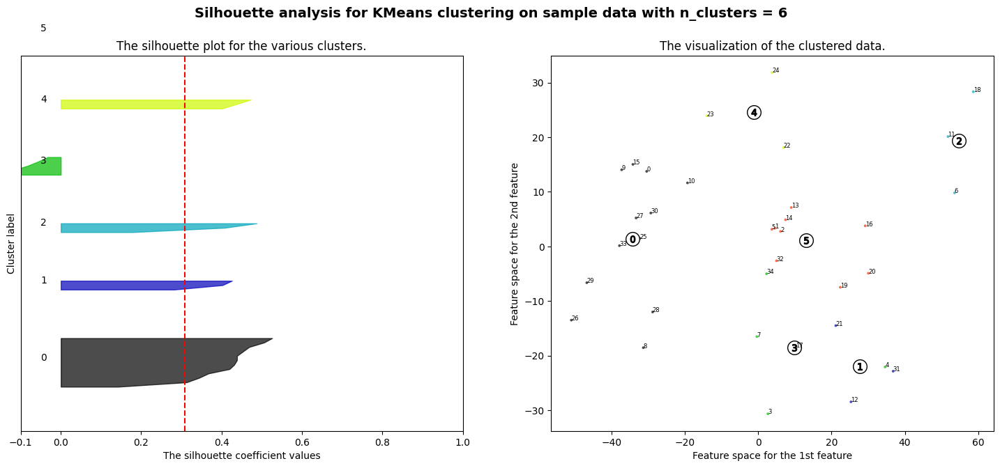

clusterization 2 iteration number 5577 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5577 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 5577 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 5578 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5579 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5579 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 5581 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5582 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 5582 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 5583 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5584 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5585 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5586 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 5587 max_sil_

<Figure size 640x480 with 0 Axes>

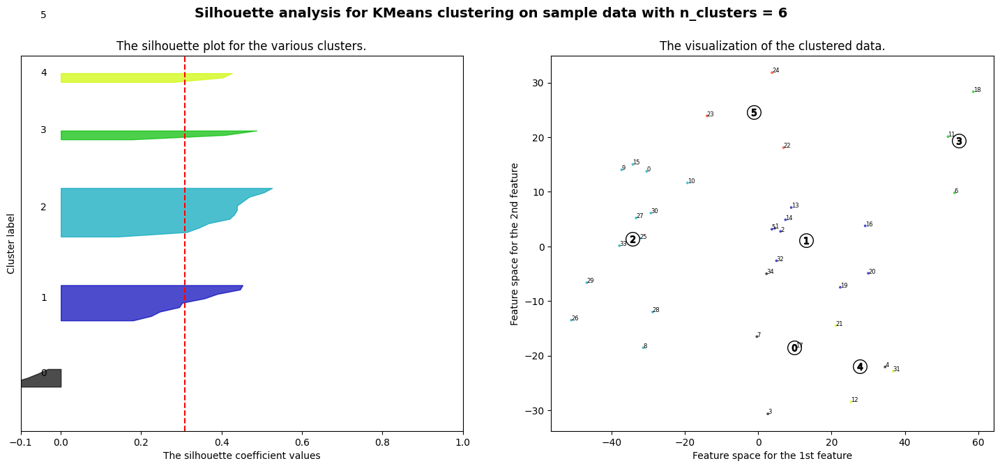

clusterization 4 iteration number 6055 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 6056 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6057 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6058 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6058 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6059 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6059 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6060 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6060 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6061 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6061 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6062 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6063 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6065 max_si

<Figure size 640x480 with 0 Axes>

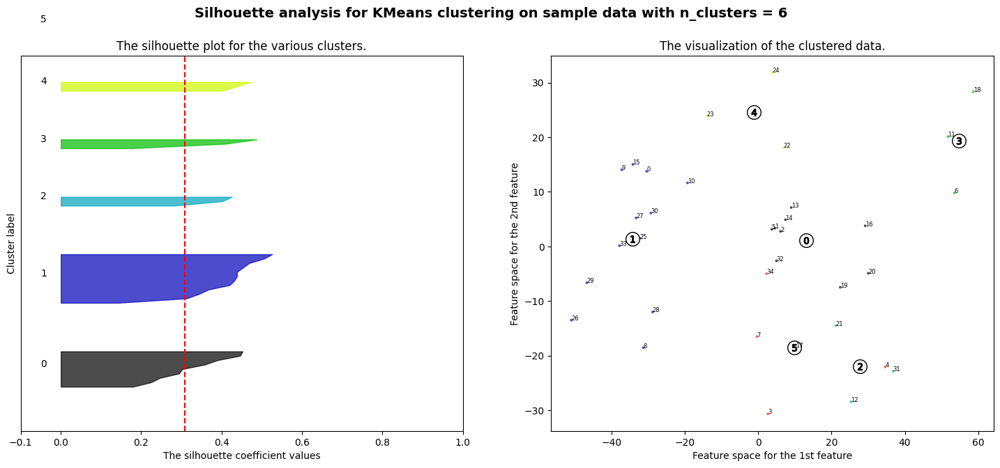

clusterization 2 iteration number 6091 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6092 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6092 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6093 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6094 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6095 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6095 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6096 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6097 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6098 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6099 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6100 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6101 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6102 max_sil_av

<Figure size 640x480 with 0 Axes>

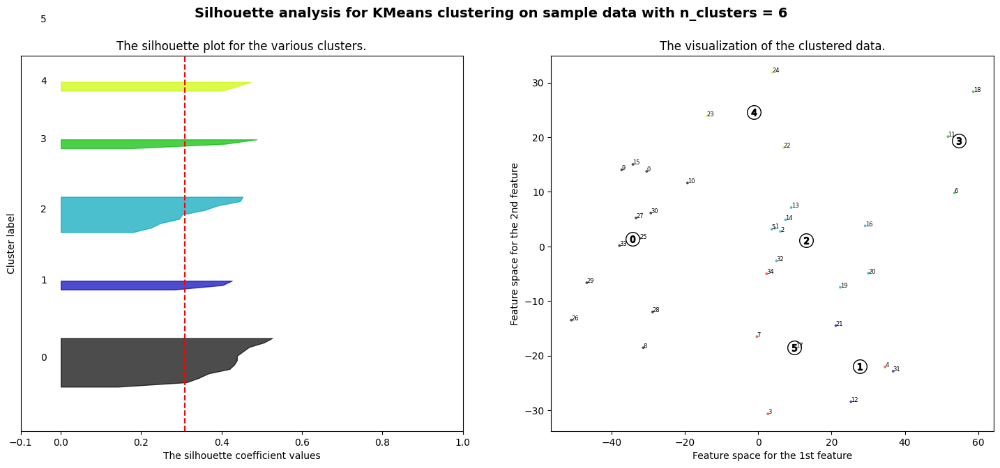

clusterization 4 iteration number 6190 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 6191 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 6191 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 6192 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6193 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6193 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6194 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6196 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6197 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6198 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6199 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6200 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6200 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6201 max_sil_

<Figure size 640x480 with 0 Axes>

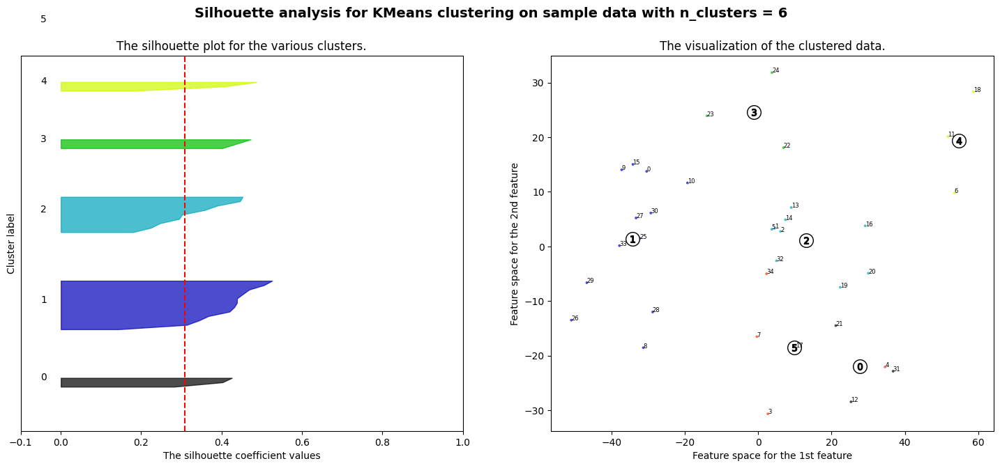

clusterization 2 iteration number 6256 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6256 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 6256 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 6257 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6259 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6260 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6261 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 6261 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 6262 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6263 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6264 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6265 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6265 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 6265 max_sil

<Figure size 640x480 with 0 Axes>

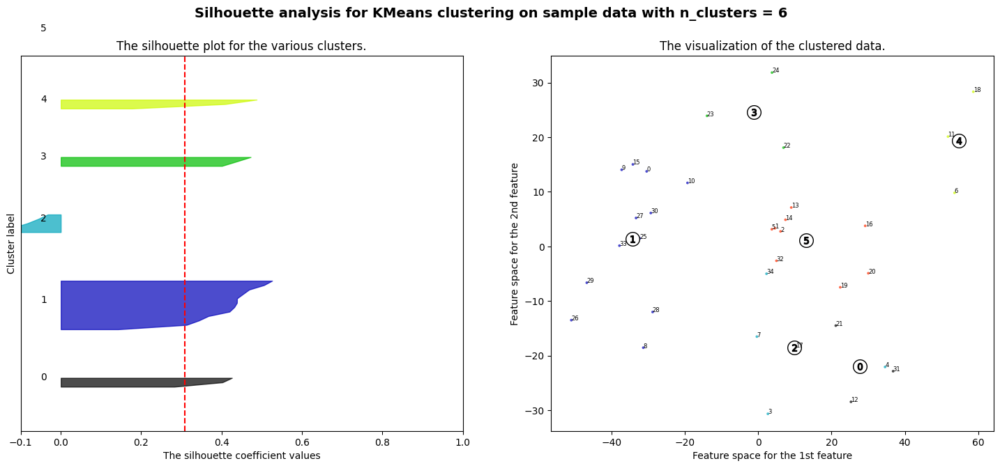

clusterization 2 iteration number 6429 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6430 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6431 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6432 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6432 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 6433 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6434 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 6434 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 6435 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6436 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6437 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6438 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6440 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6441 max_sil_

<Figure size 640x480 with 0 Axes>

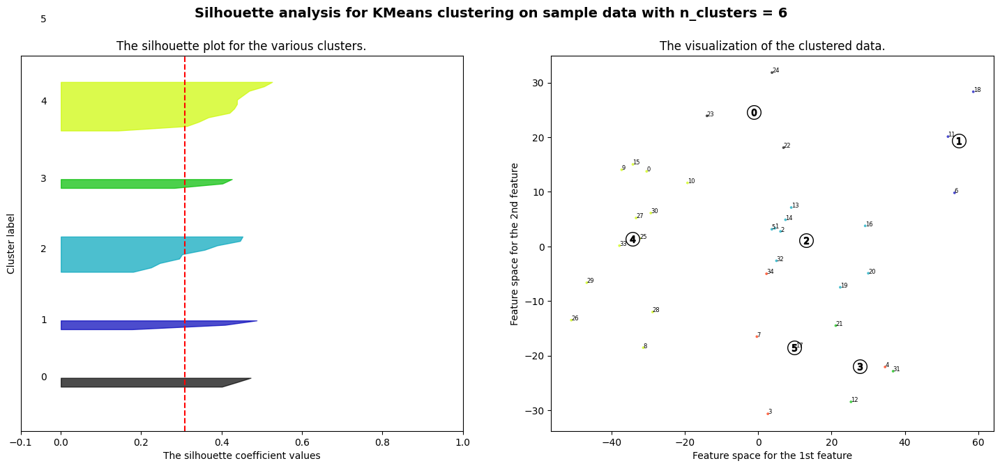

clusterization 2 iteration number 6505 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6505 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 6507 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6508 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 6508 max_sil_avg =  0.33185350824204135
clusterization 3 iteration number 6509 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6510 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6512 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6513 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6514 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6515 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6515 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 6515 max_sil_avg =  0.33185350824204135
clusterization 4 iteration number 6516 max_si

<Figure size 640x480 with 0 Axes>

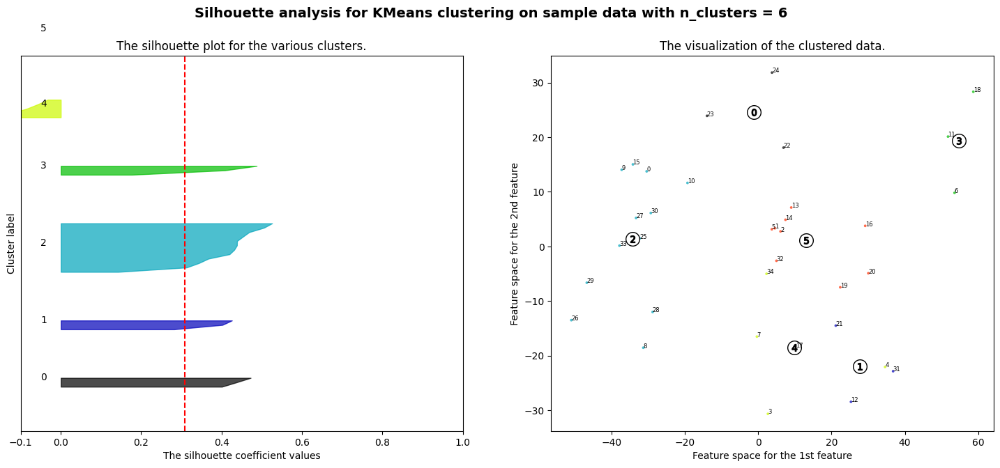

clusterization 2 iteration number 6708 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6710 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6711 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6712 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6713 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6713 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6714 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6715 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6716 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6719 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6721 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6721 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6724 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 6724 max_sil_a

<Figure size 640x480 with 0 Axes>

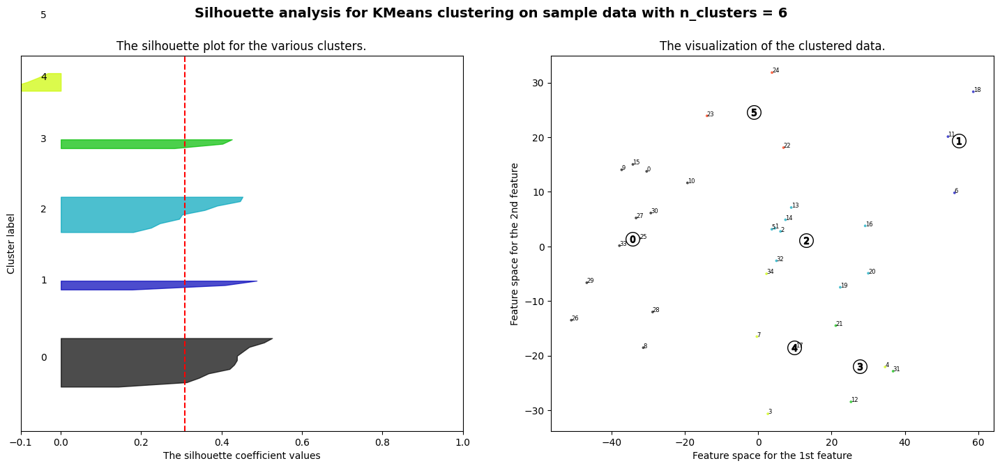

clusterization 3 iteration number 6744 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6745 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6747 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6748 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6748 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 6748 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 6749 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6750 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6750 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6751 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6753 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6754 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6755 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6756 max_si

<Figure size 640x480 with 0 Axes>

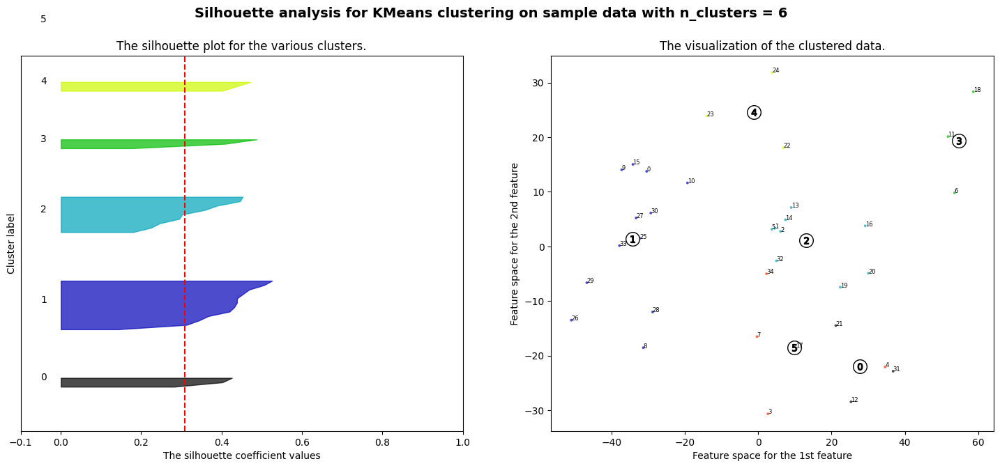

clusterization 2 iteration number 6903 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6903 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6904 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6905 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6906 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6906 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 6909 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 6909 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 6910 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6911 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6913 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 6915 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 6915 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 6916 max_sil

<Figure size 640x480 with 0 Axes>

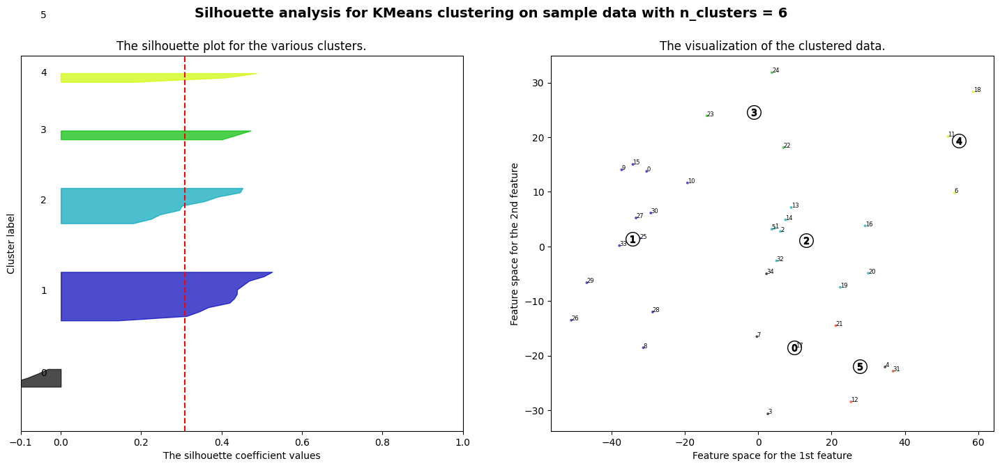

clusterization 2 iteration number 7000 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7001 max_sil_avg =  0.3313391752080792
clusterization 6 iteration number 7001 max_sil_avg =  0.30791347448636325


<Figure size 640x480 with 0 Axes>

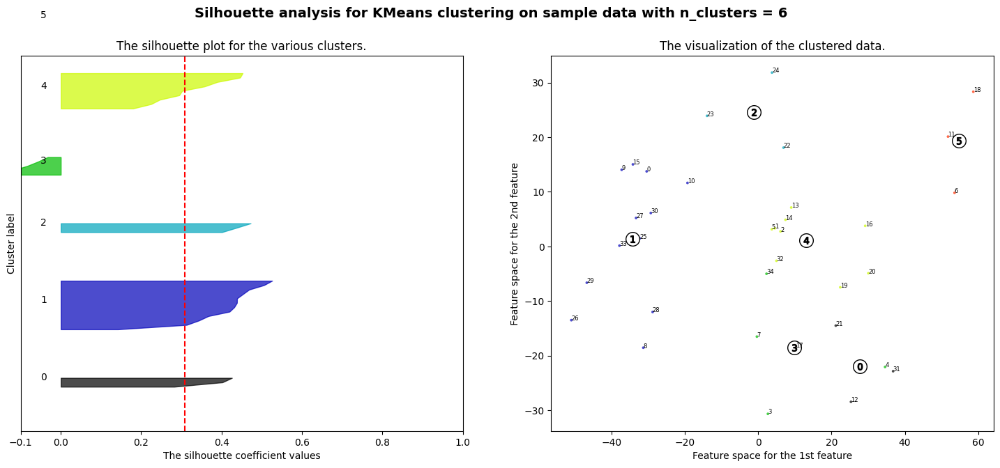

clusterization 2 iteration number 7002 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7002 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7003 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7004 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7006 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7007 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7008 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 7008 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 7009 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7009 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7010 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7011 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7011 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7012 max_sil_

<Figure size 640x480 with 0 Axes>

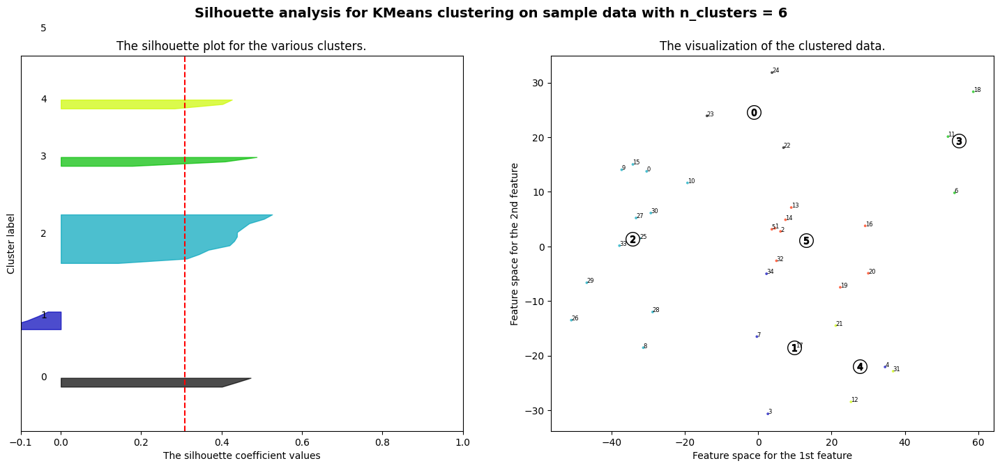

clusterization 2 iteration number 7207 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7207 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7208 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7209 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7210 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7211 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7211 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7213 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 7213 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 7214 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7215 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7215 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7216 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7217 max_sil_

<Figure size 640x480 with 0 Axes>

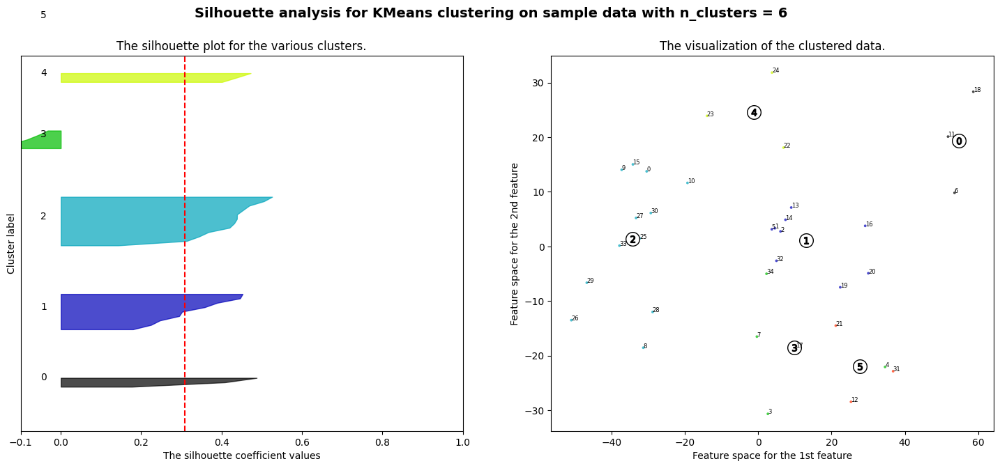

clusterization 2 iteration number 7496 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7497 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7497 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7498 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7499 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7499 max_sil_avg =  0.30665242567545176
clusterization 7 iteration number 7499 max_sil_avg =  0.3065466447685414
clusterization 3 iteration number 7500 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7501 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7501 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7502 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7502 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7503 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7504 max_sil

<Figure size 640x480 with 0 Axes>

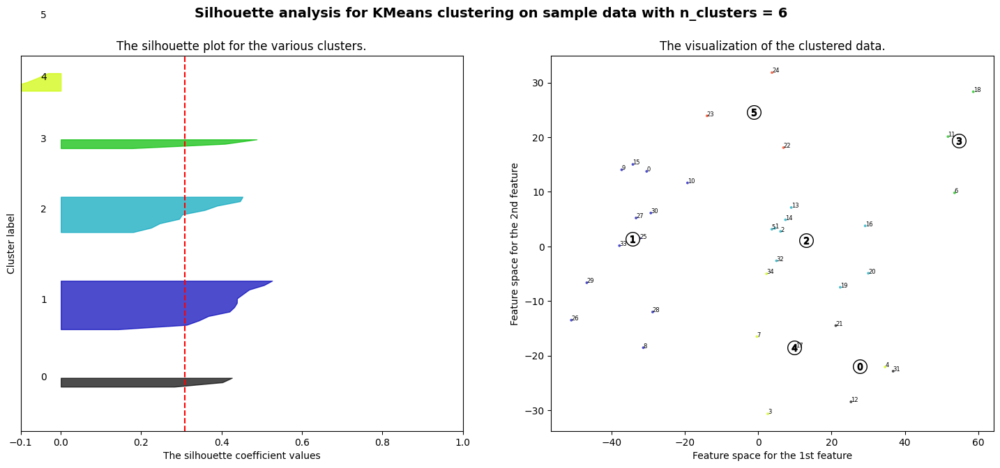

clusterization 2 iteration number 7514 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7515 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7516 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7517 max_sil_avg =  0.3313391752080792
clusterization 6 iteration number 7517 max_sil_avg =  0.30791347448636325


<Figure size 640x480 with 0 Axes>

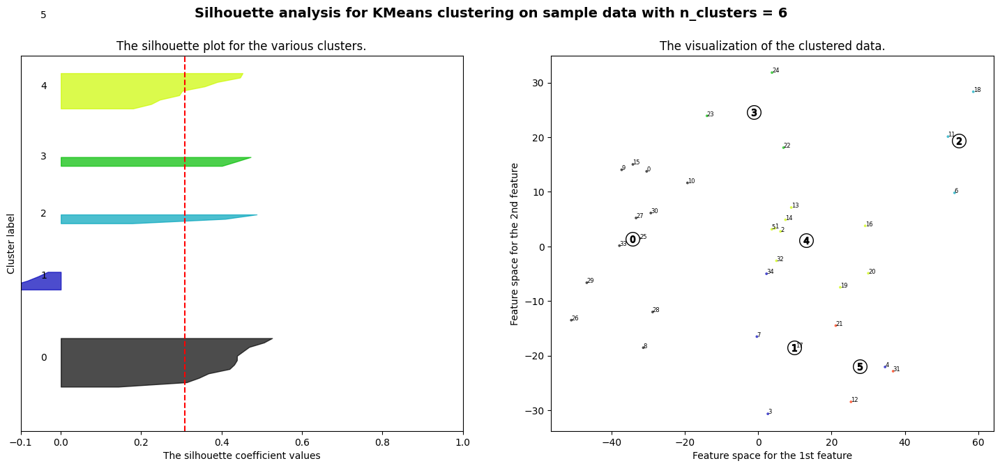

clusterization 2 iteration number 7518 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7519 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7519 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7521 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7522 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7523 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7524 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7526 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7527 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7527 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 7528 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7529 max_sil_avg =  0.3313391752080792
clusterization 6 iteration number 7529 max_sil_avg =  0.30791347448636325


<Figure size 640x480 with 0 Axes>

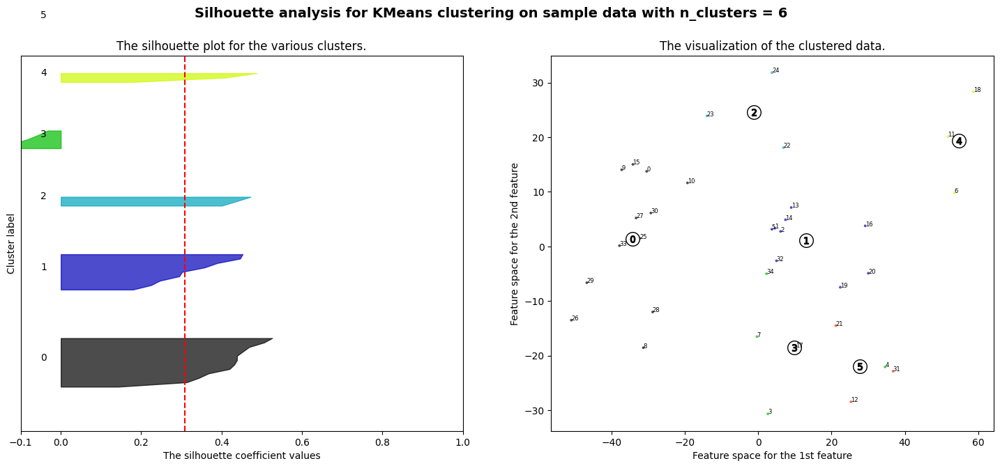

clusterization 2 iteration number 7530 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7531 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 7531 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 7532 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7533 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7533 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 7533 max_sil_avg =  0.33185350824204135
clusterization 4 iteration number 7534 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 7535 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7535 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7536 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7537 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7537 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 7538 max_si

<Figure size 640x480 with 0 Axes>

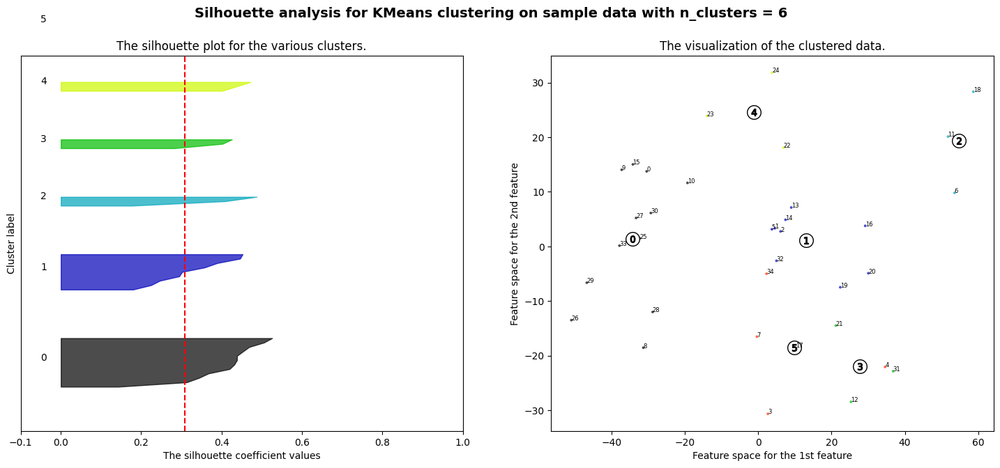

clusterization 2 iteration number 7707 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7709 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7710 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7711 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7711 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7712 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7713 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 7713 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 7715 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7716 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7717 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7717 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 7719 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 7720 max_sil_

<Figure size 640x480 with 0 Axes>

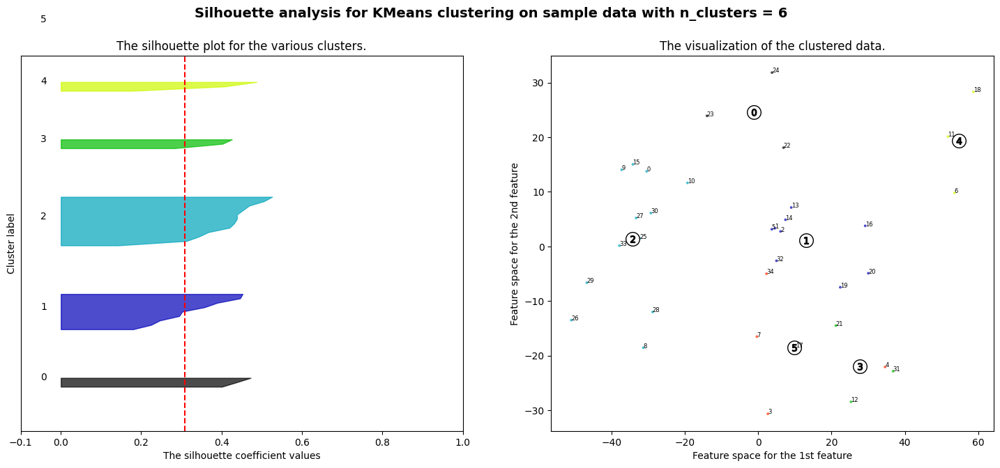

clusterization 2 iteration number 7862 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7864 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7865 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7865 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7866 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7867 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7868 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7869 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7870 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7870 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7871 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 7872 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 7872 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 7874 max_sil_

<Figure size 640x480 with 0 Axes>

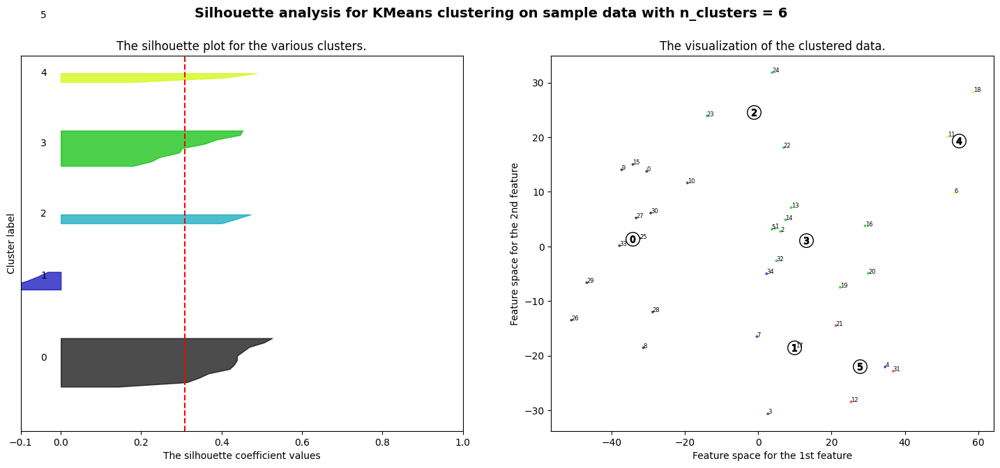

clusterization 2 iteration number 8067 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8068 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8070 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8070 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8071 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8072 max_sil_avg =  0.30665242567545176
clusterization 7 iteration number 8073 max_sil_avg =  0.3065466447685414
clusterization 2 iteration number 8074 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8075 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8076 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8076 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8077 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8078 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8079 max_sil_a

<Figure size 640x480 with 0 Axes>

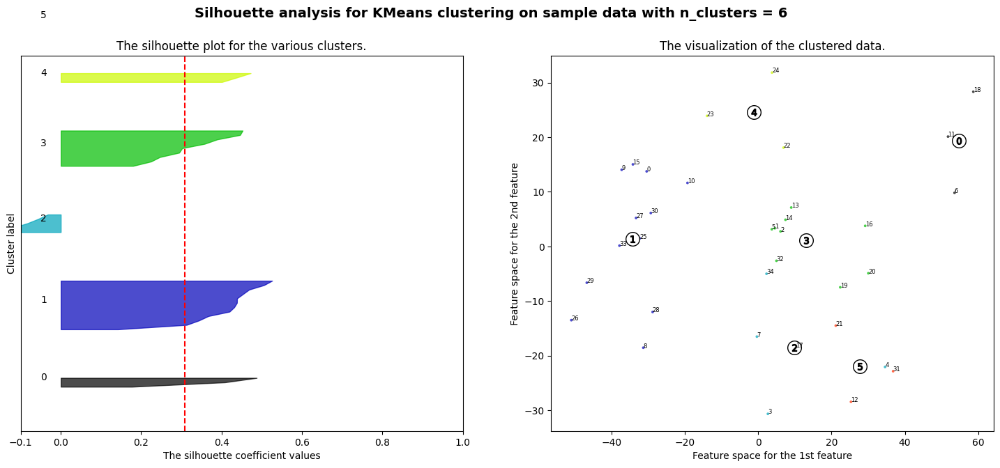

clusterization 2 iteration number 8281 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8282 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8283 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 8283 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 8284 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8284 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8285 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8286 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8287 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8288 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8288 max_sil_avg =  0.30665242567545176
clusterization 6 iteration number 8288 max_sil_avg =  0.30791347448636325


<Figure size 640x480 with 0 Axes>

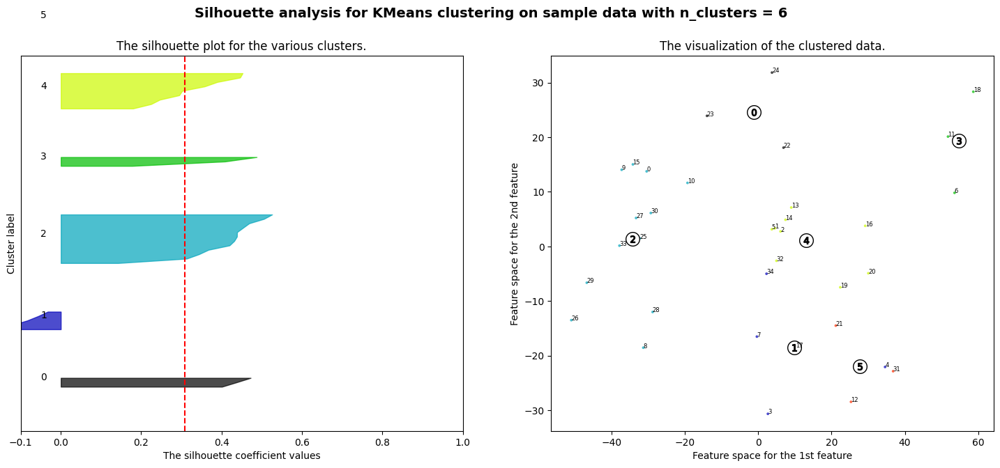

clusterization 2 iteration number 8289 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8289 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8290 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8291 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 8292 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 8293 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8293 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8294 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8295 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8295 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8296 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 8296 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 8297 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8298 max_sil

<Figure size 640x480 with 0 Axes>

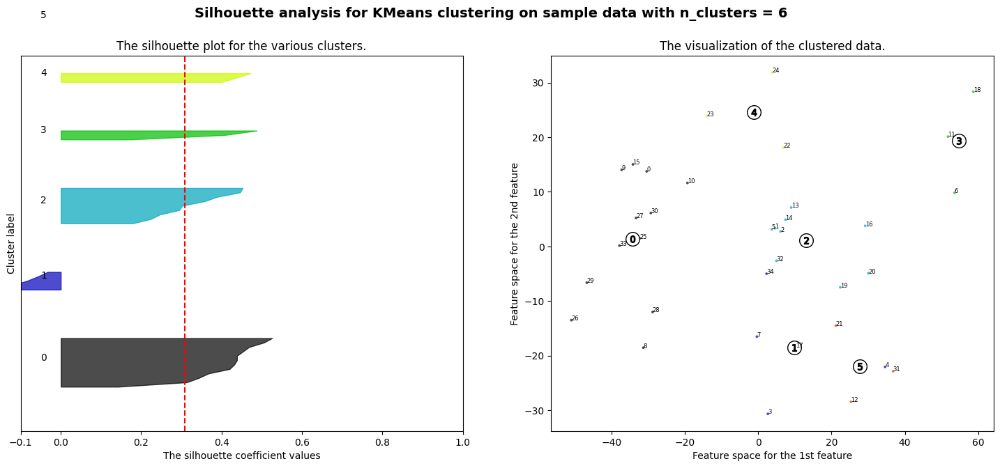

clusterization 2 iteration number 8373 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8374 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8375 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8376 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8378 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8379 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 8379 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 8380 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8381 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8381 max_sil_avg =  0.30665242567545176
clusterization 6 iteration number 8382 max_sil_avg =  0.30791347448636325


<Figure size 640x480 with 0 Axes>

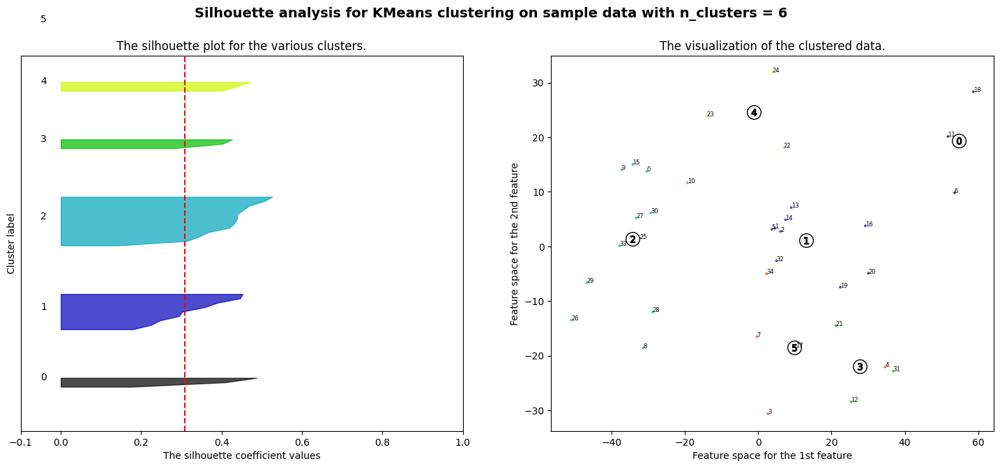

clusterization 2 iteration number 8383 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8385 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8386 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8387 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8391 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8391 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 8391 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 8392 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8392 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8393 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8394 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8395 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8396 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 8396 max_sil_a

<Figure size 640x480 with 0 Axes>

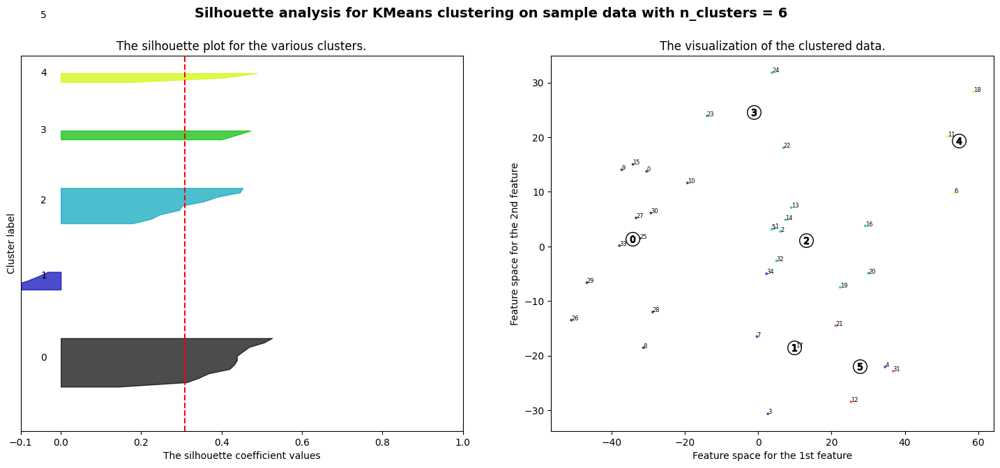

clusterization 2 iteration number 8464 max_sil_avg =  0.3313391752080792
clusterization 6 iteration number 8464 max_sil_avg =  0.30791347448636325


<Figure size 640x480 with 0 Axes>

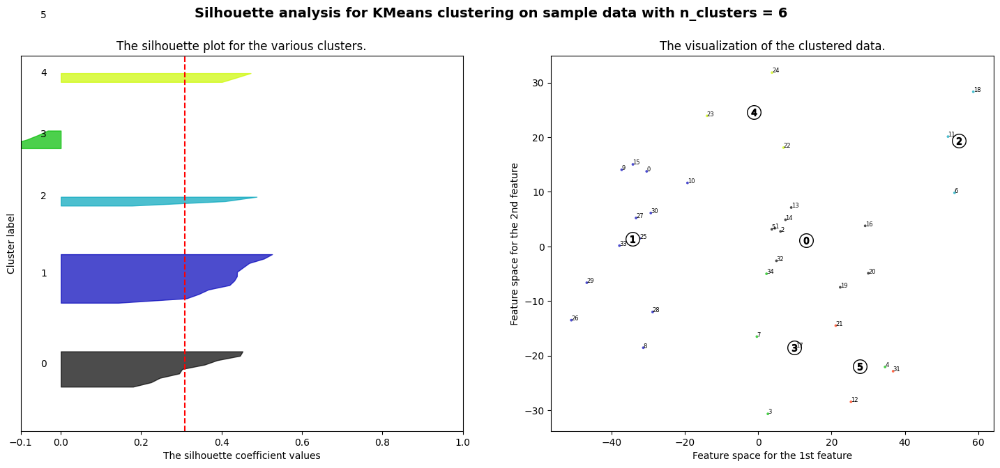

clusterization 2 iteration number 8465 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8467 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 8467 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 8468 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8469 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8470 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8472 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 8472 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 8474 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8476 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8478 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8478 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8479 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8480 max_sil_

<Figure size 640x480 with 0 Axes>

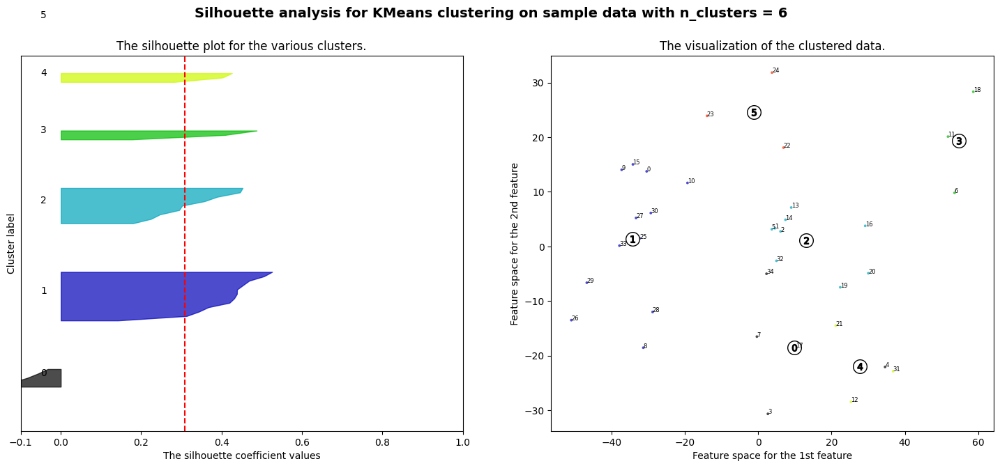

clusterization 2 iteration number 8498 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8499 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8499 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8500 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8500 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8501 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8502 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8503 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8503 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8504 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8506 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8507 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8507 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 8507 max_sil_

<Figure size 640x480 with 0 Axes>

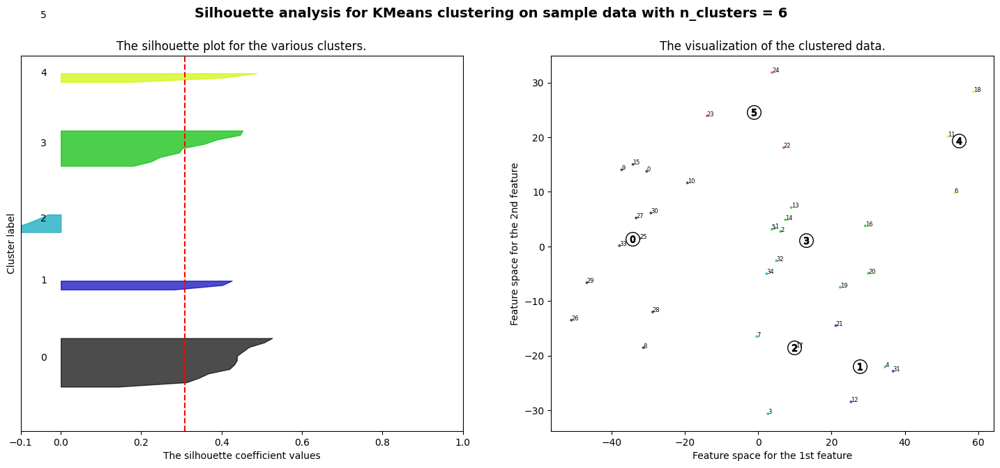

clusterization 2 iteration number 8513 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8514 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8515 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8515 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8516 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8516 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8517 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8518 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8519 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8520 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8521 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8521 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 8521 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 8522 max_sil_

<Figure size 640x480 with 0 Axes>

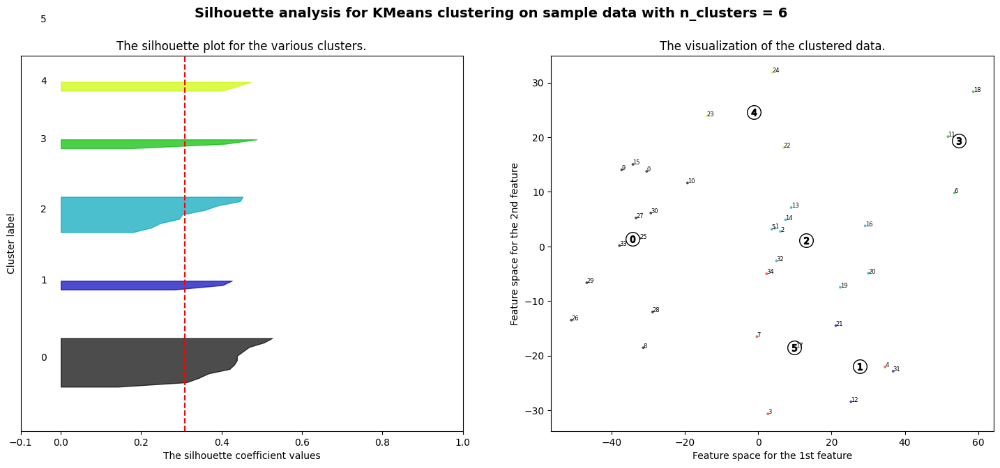

clusterization 2 iteration number 8595 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8597 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 8598 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8599 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8599 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8600 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8601 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8602 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8602 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 8604 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8606 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8606 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8609 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8610 max_s

<Figure size 640x480 with 0 Axes>

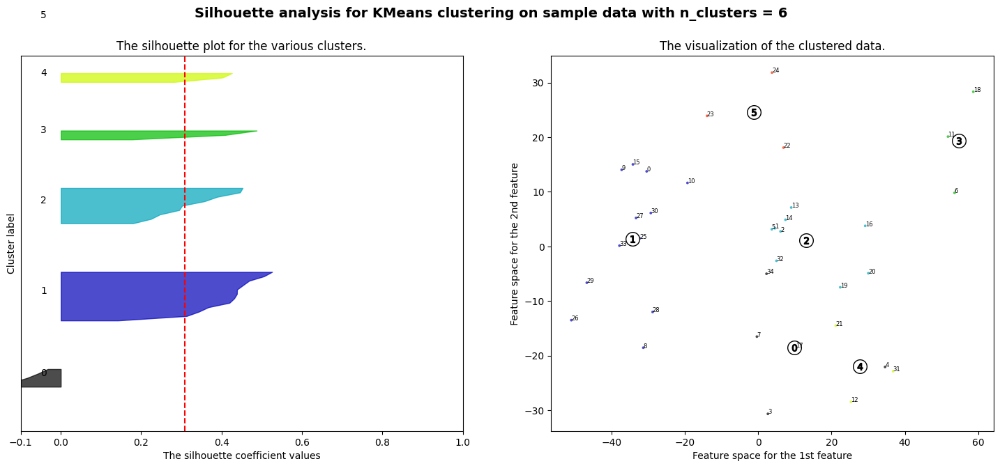

clusterization 2 iteration number 8676 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8676 max_sil_avg =  0.30665242567545176
clusterization 3 iteration number 8677 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 8678 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 8679 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8679 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8680 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8681 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8682 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8684 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8685 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8686 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8687 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8687 max_sil

<Figure size 640x480 with 0 Axes>

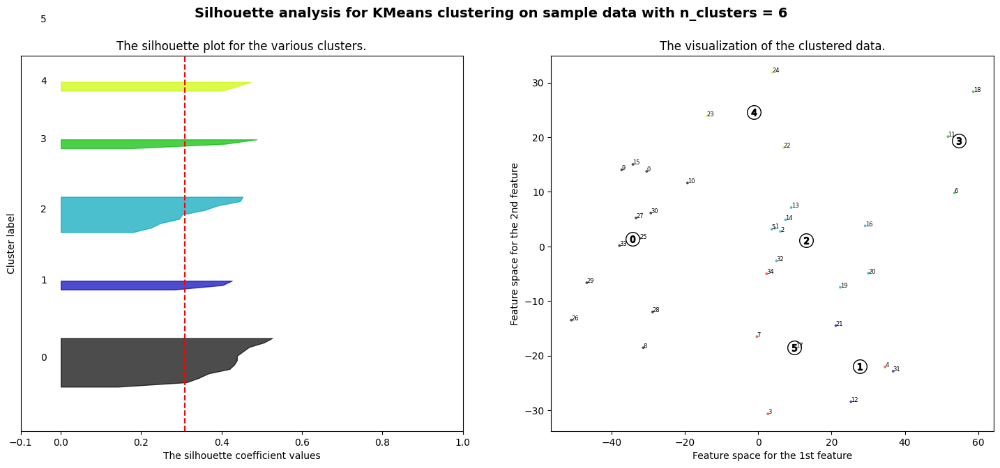

clusterization 2 iteration number 8692 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8693 max_sil_avg =  0.3313391752080792
clusterization 4 iteration number 8693 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 8694 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8694 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8695 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8697 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8697 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8699 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8700 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8701 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 8702 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 8703 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 8703 max_sil_

<Figure size 640x480 with 0 Axes>

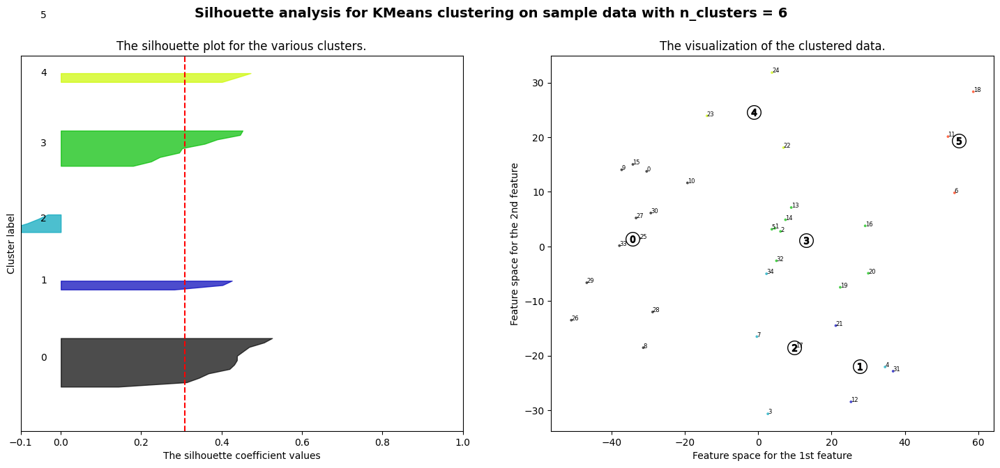

clusterization 2 iteration number 9055 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 9056 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 9057 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 9058 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 9060 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 9062 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 9062 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 9063 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 9063 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 9064 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 9064 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 9064 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 9065 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 9066 max_si

<Figure size 640x480 with 0 Axes>

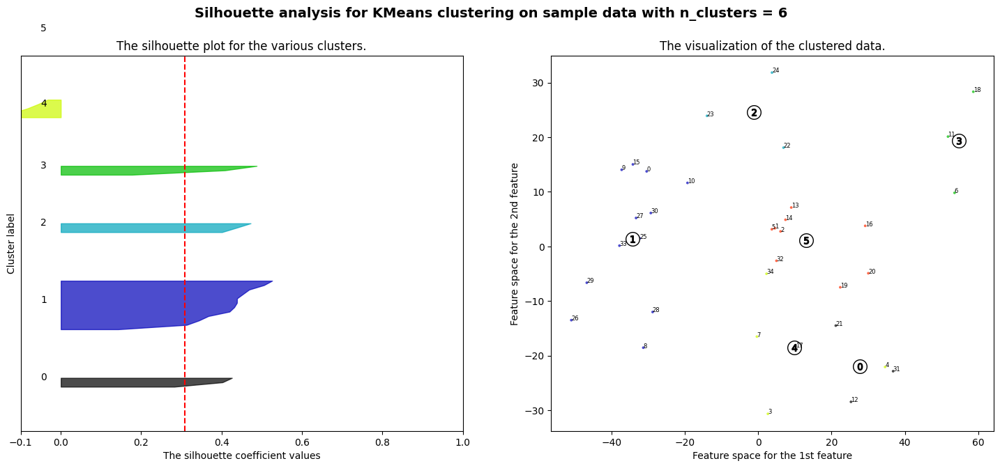

clusterization 2 iteration number 9530 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 9532 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 9532 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 9533 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 9533 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 9534 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 9535 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 9535 max_sil_avg =  0.30665242567545176
clusterization 2 iteration number 9536 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 9537 max_sil_avg =  0.3313391752080792
clusterization 3 iteration number 9539 max_sil_avg =  0.30665242567545176
clusterization 4 iteration number 9539 max_sil_avg =  0.33185350824204135
clusterization 2 iteration number 9540 max_sil_avg =  0.3313391752080792
clusterization 2 iteration number 9541 max_sil

<Figure size 640x480 with 0 Axes>

In [24]:
#100 iterazioni, con X_pca

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
#X = feature_matrix
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]
#clusterization = 5 #elemento di range_n_clusters scelto per scegliere in quanti cluster suddividere il dataset
 #Indici per il conteggio di quante volte è comparso un valore negativo, dopo 100 iterazioni
i = 0 #2 cluster
j = 0 #3 cluster
k = 0 #4 cluster
l = 0 #5 cluster
m = 0 #6 cluster
n = 0 #7 cluster
#Valori per il calcolo della media di silhouette_avg
a = 0
b = 0
c = 0
d = 0
e = 0
f = 0
g = 0
#Inizializzo il vettore in cui andrò a mettere tutti i silhouette_avg
iterations = 10000
sil_avg_pca = np.zeros((len(range_n_clusters),iterations)) #dimensioni pari al numero di iterazioni, per ogni clusterizzazione
labels_pca = np.zeros((len(range_n_clusters),len(X_pca))) #41 pari al numero di modelli
centroids_pca = np.zeros((len(range_n_clusters),len(X_pca.T))) #7x4x10
max_sil_avg_pca = - np.ones(len(range_n_clusters)) #inizializzazione per il massimo
#Inizializzo un vettore che ha indice pari al valore delle righe, in modo tale da individuare ogni modello all'interno del plot
index_models_pca = np.arange(len(X_pca))# [0,1,2,...,40]

#100 iterazioni
for p in range(iterations):
    
    for n_clusters in range_n_clusters:

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters,init='k-means++') # k-means++ per inizializzare i centroid + distanti iin modo da evitare i minimi locali
        cluster_labels = clusterer.fit_predict(X_pca)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X_pca, cluster_labels) #il valore medio del silhouette score tra tutti i cluster
        #aggiorno i valori per poi calcolare la media di silhouette_avg
        if n_clusters == range_n_clusters[0]: #2 cluster
            a = a + silhouette_avg
            sil2 = silhouette_avg  
            sil_avg_pca[0][p] = silhouette_avg
            if p == 0: #primo elemento dell'array sil_avg
                max_sil_avg_pca[0] = sil_avg_pca[0][p] #fisso il primo come il massimo 
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg_pca[0])         
            if sil_avg_pca[0][p] >= max_sil_avg_pca[0]: # scelgo il silh. coefficient maggiore e salvo i labels e i centroids. L'uguale è per p==0
                #fig.clf() #elimino il grafico pre-esistente
                labels_pca[0] = clusterer.labels_ #labels
                centroids_pca = clusterer.cluster_centers_ #centroids 
                max_sil_avg_pca[0] = sil_avg_pca[0][p] # il p-esimo elemento di sil_avg diventa il massimo valore di silhouette coefficient
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg_pca[0])

            
        elif n_clusters == range_n_clusters[1]: #3 cluster
            b = b + silhouette_avg
            sil3 = silhouette_avg  
            sil_avg_pca[1][p] = silhouette_avg
            if p == 0: #primo elemento dell'array sil_avg
                max_sil_avg_pca[1] = sil_avg_pca[1][p] #fisso il primo come il massimo 
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg_pca[1])         
            if sil_avg_pca[1][p] >= max_sil_avg_pca[1]: # scelgo il silh. coefficient maggiore e salvo i labels e i centroids. L'uguale è per p==0
                #fig.clf() #elimino il grafico pre-esistente
                labels_pca[1] = clusterer.labels_ #labels
                centroids_pca = clusterer.cluster_centers_ #centroids 
                max_sil_avg_pca[1] = sil_avg_pca[1][p] # il p-esimo elemento di sil_avg diventa il massimo valore di silhouette coefficient
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg_pca[1])

        elif n_clusters == range_n_clusters[2]: #4 cluster
            c = c + silhouette_avg            
            sil4 = silhouette_avg  
            sil_avg_pca[2][p] = silhouette_avg
            if p == 0: #primo elemento dell'array sil_avg
                max_sil_avg_pca[2] = sil_avg_pca[2][p] #fisso il primo come il massimo 
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg_pca[2])         
            if sil_avg_pca[2][p] >= max_sil_avg_pca[2]: # scelgo il silh. coefficient maggiore e salvo i labels e i centroids. L'uguale è per p==0
                #fig.clf() #elimino il grafico pre-esistente
                labels_pca[2] = clusterer.labels_ #labels
                centroids_pca = clusterer.cluster_centers_ #centroids 
                max_sil_avg_pca[2] = sil_avg_pca[2][p] # il p-esimo elemento di sil_avg diventa il massimo valore di silhouette coefficient
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg_pca[2])

        elif n_clusters == range_n_clusters[3]: #5 cluster
            d = d + silhouette_avg
            sil5 = silhouette_avg#Prendo il silhouette_avg maggiore (lo faccio solo per 4 cluster) e fisso i labels e i centers  
            sil_avg_pca[3][p] = silhouette_avg
            if p == 0: #primo elemento dell'array sil_avg
                max_sil_avg_pca[3] = sil_avg_pca[3][p] #fisso il primo come il massimo 
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg_pca[3])         
            if sil_avg_pca[3][p] >= max_sil_avg_pca[3]: # scelgo il silh. coefficient maggiore e salvo i labels e i centroids. L'uguale è per p==0
                #fig.clf() #elimino il grafico pre-esistente
                labels_pca[3] = clusterer.labels_ #labels
                centroids_pca = clusterer.cluster_centers_ #centroids 
                max_sil_avg_pca[3] = sil_avg_pca[3][p] # il p-esimo elemento di sil_avg diventa il massimo valore di silhouette coefficient
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg_pca[3])

            
        elif n_clusters == range_n_clusters[4]: #6 cluster
            e = e + silhouette_avg  
            sil6 = silhouette_avg#Inserisco silhouette_avg in un vettore  
            sil_avg_pca[4][p] = silhouette_avg
            if p == 0: #primo elemento dell'array sil_avg
                max_sil_avg_pca[4] = sil_avg_pca[4][p] #fisso il primo come il massimo 
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg_pca[4])         
            if sil_avg_pca[4][p] >= max_sil_avg_pca[4]: # scelgo il silh. coefficient maggiore e salvo i labels e i centroids. L'uguale è per p==0
                #fig.clf() #elimino il grafico pre-esistente
                labels_pca[4] = clusterer.labels_ #labels
                centroids_pca = clusterer.cluster_centers_ #centroids 
                max_sil_avg_pca[4] = sil_avg_pca[4][p] # il p-esimo elemento di sil_avg diventa il massimo valore di silhouette coefficient
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg_pca[4])
                #plot del silhouette coefficient
                #assi per il plot
                fig, (ax1, ax2) = plt.subplots(1, 2)
                fig.set_size_inches(18,7)

                # The 1st subplot is the silhouette plot
                # The silhouette coefficient can range from -1, 1 but in this example all
                # lie within [-0.1, 1]
                ax1.set_xlim([-0.1, 1])
                # The (n_clusters+1)*10 is for inserting blank space between silhouette
                # plots of individual clusters, to demarcate them clearly.
                ax1.set_ylim([0, len(X_pca) + (4 + 1) * 10]) #dove 4 = n_clusters perché il plot lo faccio solo per 4 clusters

                # The 1st subplot is the silhouette plot
                # The silhouette coefficient can range from -1, 1 but in this example all
                # lie within [-0.1, 1]
                ax1.set_xlim([-0.1, 1])
                # The (n_clusters+1)*10 is for inserting blank space between silhouette
                # plots of individual clusters, to demarcate them clearly.
                ax1.set_ylim([0, len(X_pca) + (4 + 1) * 10]) # len(X) = numero di modelli e quindi il numero di samples. 4 = n_clusters perché il plot lo faccio solo per 4 clusters

                # Compute the silhouette scores for each sample
                sample_silhouette_values = silhouette_samples(X_pca, cluster_labels)
                
                y_lower = 10
                for i in range(n_clusters):
                    # Aggregate the silhouette scores for samples belonging to
                    # cluster i, and sort them
                    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

                    ith_cluster_silhouette_values.sort()

                    size_cluster_i = ith_cluster_silhouette_values.shape[0]
                    y_upper = y_lower + size_cluster_i

                    color = cm.nipy_spectral(float(i) / n_clusters)
                    ax1.fill_betweenx(
                        np.arange(y_lower, y_upper),
                        0,
                        ith_cluster_silhouette_values,
                        facecolor=color,
                        edgecolor=color,
                        alpha=0.7,
                    )

                    # Label the silhouette plots with their cluster numbers at the middle
                    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

                    # Compute the new y_lower for next plot
                    y_lower = y_upper + 10  # 10 for the 0 samples

                ax1.set_title("The silhouette plot for the various clusters.")
                ax1.set_xlabel("The silhouette coefficient values")
                ax1.set_ylabel("Cluster label")

                # The vertical line for average silhouette score of all the values
                ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

                ax1.set_yticks([])  # Clear the yaxis labels / ticks
                ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

                # 2nd Plot showing the actual clusters formed
                colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
                ax2.scatter(
                    X_pca[:, 0], X_pca[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
                )
                # Annotazione dei numeri degli indici
                for i, txt in enumerate(index_models_pca):
                    ax2.annotate(txt, (X_pca[i, 0], X_pca[i, 1]), fontsize=6)

                # Draw white circles at cluster centers
                ax2.scatter(
                    centroids_pca[:, 0],
                    centroids_pca[:, 1],
                    marker="o",
                    c="white",
                    alpha=1,
                    s=200,
                    edgecolor="k",
                )

                for i, c in enumerate(centroids_pca):
                    ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

                ax2.set_title("The visualization of the clustered data.")
                ax2.set_xlabel("Feature space for the 1st feature")
                ax2.set_ylabel("Feature space for the 2nd feature")

                plt.suptitle(
                    "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
                    % n_clusters,
                    fontsize=14,
                    fontweight="bold",
                )

                plt.show()
                plt.savefig('sil_coeff_X_pca.pdf', format='pdf')
                fig.clf() #elimino il grafico pre-esistente 
            
        elif n_clusters == range_n_clusters[5]: #7 cluster
            f = f + silhouette_avg
            sil7 = silhouette_avg   
            sil_avg_pca[5][p] = silhouette_avg
            if p == 0: #primo elemento dell'array sil_avg
                max_sil_avg_pca[5] = sil_avg_pca[5][p] #fisso il primo come il massimo 
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg_pca[5])         
            if sil_avg_pca[5][p] >= max_sil_avg_pca[5]: # scelgo il silh. coefficient maggiore e salvo i labels e i centroids. L'uguale è per p==0
                #fig.clf() #elimino il grafico pre-esistente
                labels_pca[5] = clusterer.labels_ #labels
                centroids_pca = clusterer.cluster_centers_ #centroids 
                max_sil_avg_pca[5] = sil_avg_pca[5][p] # il p-esimo elemento di sil_avg diventa il massimo valore di silhouette coefficient
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg_pca[5])     
                 
        elif n_clusters == range_n_clusters[6]: #8 cluster
            g = g + silhouette_avg
            sil8 = silhouette_avg  
            sil_avg_pca[6][p] = silhouette_avg
            if p == 0: #primo elemento dell'array sil_avg
                max_sil_avg_pca[6] = sil_avg_pca[6][p] #fisso il primo come il massimo 
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg_pca[6])         
            if sil_avg_pca[6][p] >= max_sil_avg_pca[6]: # scelgo il silh. coefficient maggiore e salvo i labels e i centroids. L'uguale è per p==0
                #fig.clf() #elimino il grafico pre-esistente
                labels_pca[6] = clusterer.labels_ #labels
                centroids_pca = clusterer.cluster_centers_ #centroids 
                max_sil_avg_pca[6] = sil_avg_pca[6][p] # il p-esimo elemento di sil_avg diventa il massimo valore di silhouette coefficient
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg_pca[6])


        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X_pca, cluster_labels)
    
        if np.any(sample_silhouette_values < 0):
            #print("For n_clusters =", n_clusters, "there are negative silhouette values.") #Se almeno uno dei samples ha sil coeff < 0
            #Aggiorno il conteggio quando ho un valore dei coefficienti negativo per ogni iterazione
            if n_clusters == range_n_clusters[0]:
                i = i + 1
            elif n_clusters == range_n_clusters[1]:
                j = j + 1
            elif n_clusters == range_n_clusters[2]:
                k = k + 1
            elif n_clusters == range_n_clusters[3]:
                l = l + 1
            elif n_clusters == range_n_clusters[4]:
                m = m + 1  
            elif n_clusters == range_n_clusters[5]:
                n = n + 1

cluster_2_mean = a / iterations
cluster_3_mean = b / iterations
cluster_4_mean = c / iterations
cluster_5_mean = d / iterations
cluster_6_mean = e / iterations
cluster_7_mean = f / iterations

#print("n_clusters = ", range_n_clusters[0], "has", i, "negative silhouette coefficient values and average silhouette coefficient is in 100 iterations is", cluster_2_mean)
#print("n_clusters = ", range_n_clusters[1], "has", j, "negative silhouette coefficient values and average silhouette coefficient is in 100 iterations is", cluster_3_mean)
#print("n_clusters = ", range_n_clusters[2], "has", k, "negative silhouette coefficient values and average silhouette coefficient is in 100 iterations is", cluster_4_mean)
#print("n_clusters = ", range_n_clusters[3], "has", l, "negative silhouette coefficient values and average silhouette coefficient is in 100 iterations is", cluster_5_mean)
#print("n_clusters = ", range_n_clusters[4], "has", m, "negative silhouette coefficient values and average silhouette coefficient is in 100 iterations is", cluster_6_mean)
#print("n_clusters = ", range_n_clusters[5], "has", n, "negative silhouette coefficient values and average silhouette coefficient is in 100 iterations is", cluster_7_mean)


In [25]:
max_sil_avg_pca

array([0.33133918, 0.30665243, 0.33185351, 0.31977857, 0.30791347,
       0.30654664, 0.30718237])

clusterization 2 iteration number 0 max_sil_avg =  0.31272294120894606
clusterization 2 iteration number 0 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 0 max_sil_avg =  0.28407073411745004
clusterization 3 iteration number 0 max_sil_avg =  0.28407073411745004
clusterization 4 iteration number 0 max_sil_avg =  0.28407073411745004
clusterization 4 iteration number 0 max_sil_avg =  0.24234641524173064
clusterization 5 iteration number 0 max_sil_avg =  0.22957019006934715
clusterization 5 iteration number 0 max_sil_avg =  0.22957019006934715
clusterization 6 iteration number 0 max_sil_avg =  0.20289862479919435
clusterization 6 iteration number 0 max_sil_avg =  0.20289862479919435


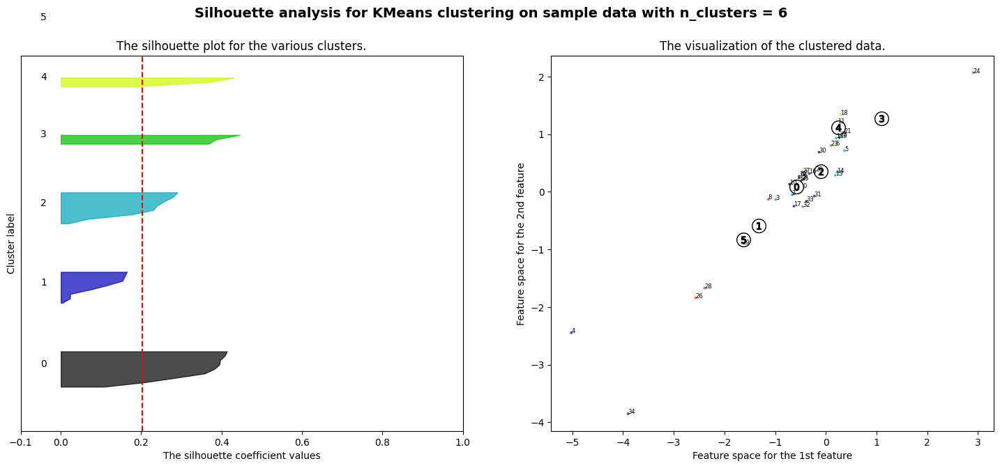

clusterization 7 iteration number 0 max_sil_avg =  0.19770308927194616
clusterization 7 iteration number 0 max_sil_avg =  0.19770308927194616
clusterization 8 iteration number 0 max_sil_avg =  0.2008067377035046
clusterization 8 iteration number 0 max_sil_avg =  0.2008067377035046
clusterization 2 iteration number 1 max_sil_avg =  0.31272294120894606
clusterization 4 iteration number 1 max_sil_avg =  0.24694013219835448
clusterization 5 iteration number 1 max_sil_avg =  0.24098402247454095
clusterization 2 iteration number 2 max_sil_avg =  0.31272294120894606
clusterization 5 iteration number 2 max_sil_avg =  0.2494542618498326
clusterization 6 iteration number 2 max_sil_avg =  0.2181320074154323


<Figure size 640x480 with 0 Axes>

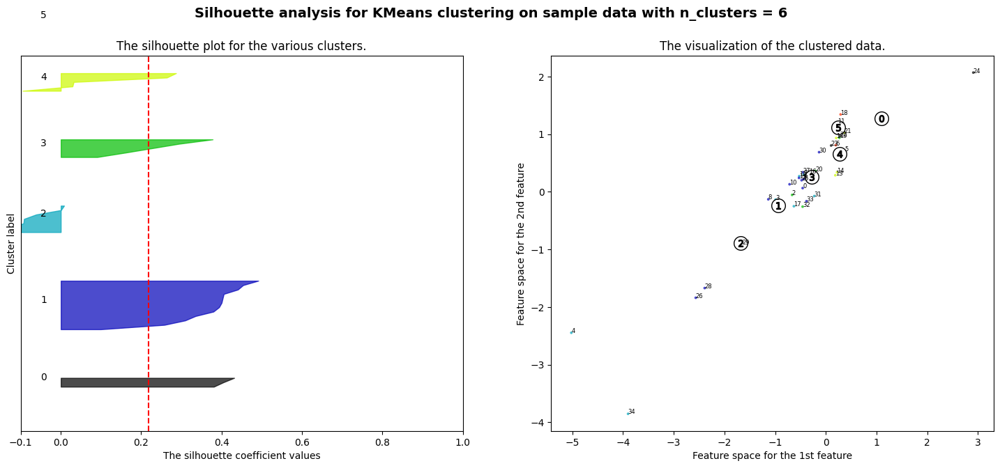

clusterization 7 iteration number 2 max_sil_avg =  0.19978578157975516
clusterization 2 iteration number 3 max_sil_avg =  0.31272294120894606
clusterization 4 iteration number 3 max_sil_avg =  0.25318664424684545
clusterization 6 iteration number 3 max_sil_avg =  0.2474255660322206


<Figure size 640x480 with 0 Axes>

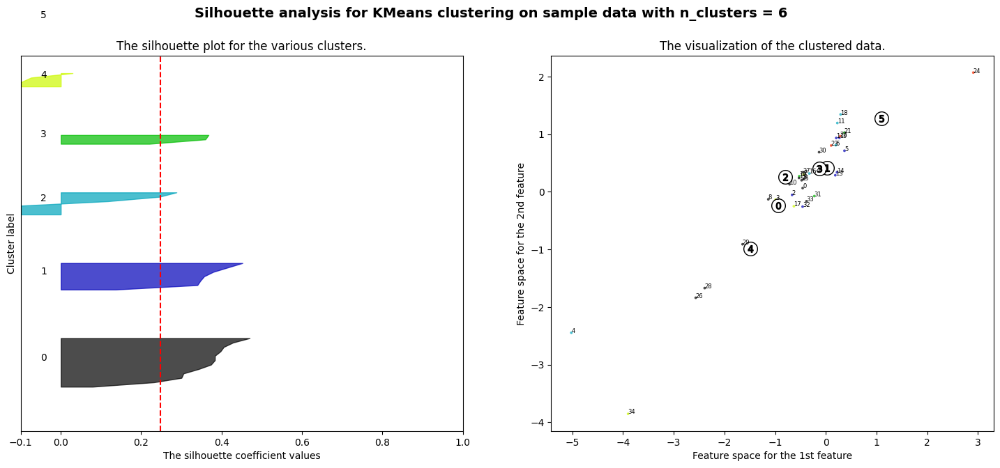

clusterization 7 iteration number 3 max_sil_avg =  0.21787415643130736
clusterization 2 iteration number 4 max_sil_avg =  0.31272294120894606
clusterization 4 iteration number 4 max_sil_avg =  0.2566223160878582
clusterization 5 iteration number 4 max_sil_avg =  0.28159856365336244
clusterization 8 iteration number 4 max_sil_avg =  0.21950949314496238
clusterization 3 iteration number 5 max_sil_avg =  0.2847812822838683
clusterization 2 iteration number 6 max_sil_avg =  0.31272294120894606
clusterization 2 iteration number 7 max_sil_avg =  0.31272294120894606
clusterization 4 iteration number 7 max_sil_avg =  0.30566865774792995
clusterization 6 iteration number 7 max_sil_avg =  0.25823750803696893


<Figure size 640x480 with 0 Axes>

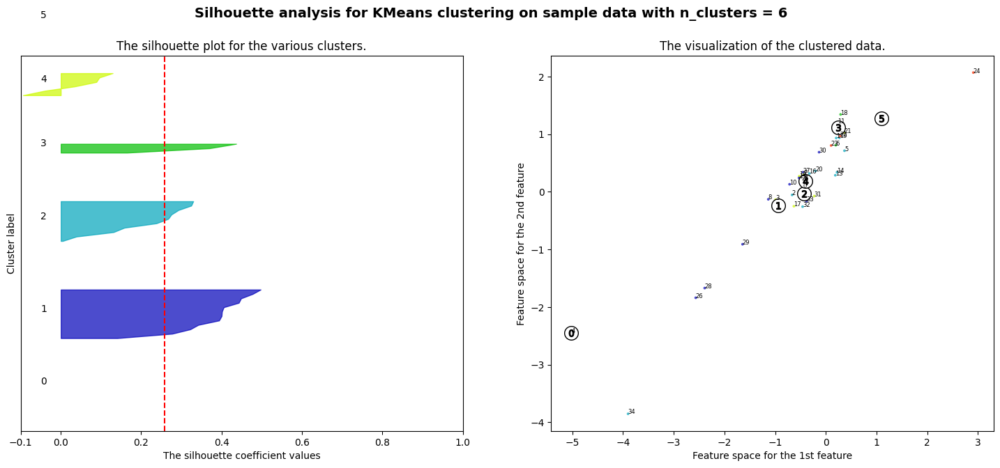

clusterization 7 iteration number 7 max_sil_avg =  0.2379406346024287
clusterization 2 iteration number 8 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 8 max_sil_avg =  0.2847812822838683
clusterization 7 iteration number 8 max_sil_avg =  0.27516957994823593
clusterization 2 iteration number 9 max_sil_avg =  0.31272294120894606
clusterization 2 iteration number 10 max_sil_avg =  0.31272294120894606
clusterization 6 iteration number 10 max_sil_avg =  0.26739038641490404


<Figure size 640x480 with 0 Axes>

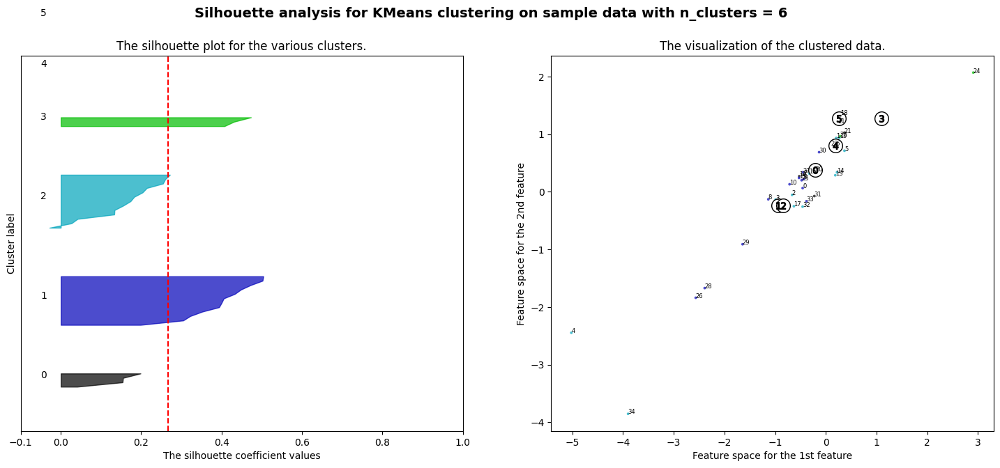

clusterization 2 iteration number 11 max_sil_avg =  0.31272294120894606
clusterization 4 iteration number 11 max_sil_avg =  0.30566865774792995
clusterization 2 iteration number 12 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 12 max_sil_avg =  0.2847812822838683
clusterization 3 iteration number 13 max_sil_avg =  0.2847812822838683
clusterization 6 iteration number 13 max_sil_avg =  0.27303307248528474


<Figure size 640x480 with 0 Axes>

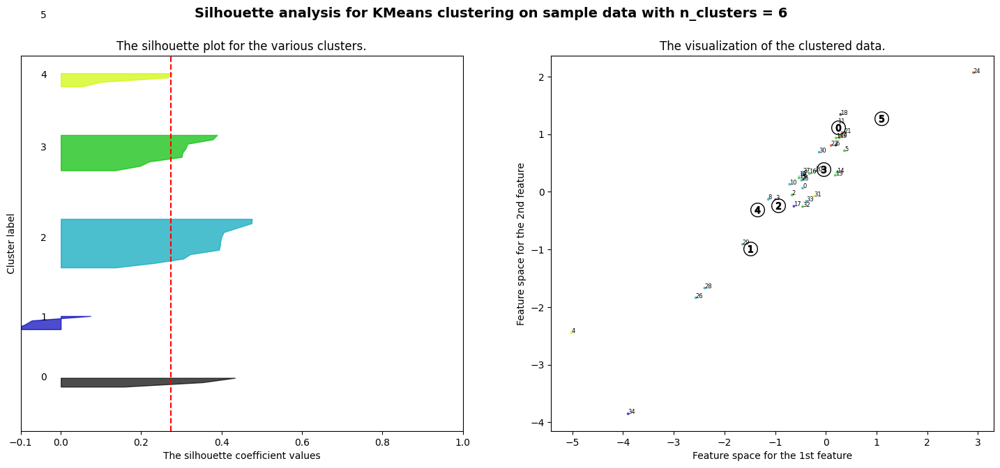

clusterization 8 iteration number 13 max_sil_avg =  0.2519224947103375
clusterization 2 iteration number 15 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 16 max_sil_avg =  0.2847812822838683
clusterization 2 iteration number 17 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 17 max_sil_avg =  0.2847812822838683
clusterization 2 iteration number 18 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 18 max_sil_avg =  0.2847812822838683
clusterization 2 iteration number 20 max_sil_avg =  0.31272294120894606
clusterization 2 iteration number 21 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 21 max_sil_avg =  0.2847812822838683
clusterization 4 iteration number 21 max_sil_avg =  0.30566865774792995
clusterization 2 iteration number 22 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 22 max_sil_avg =  0.2847812822838683
clusterization 2 iteration number 24 max_sil_avg =  0.3127229412089460

<Figure size 640x480 with 0 Axes>

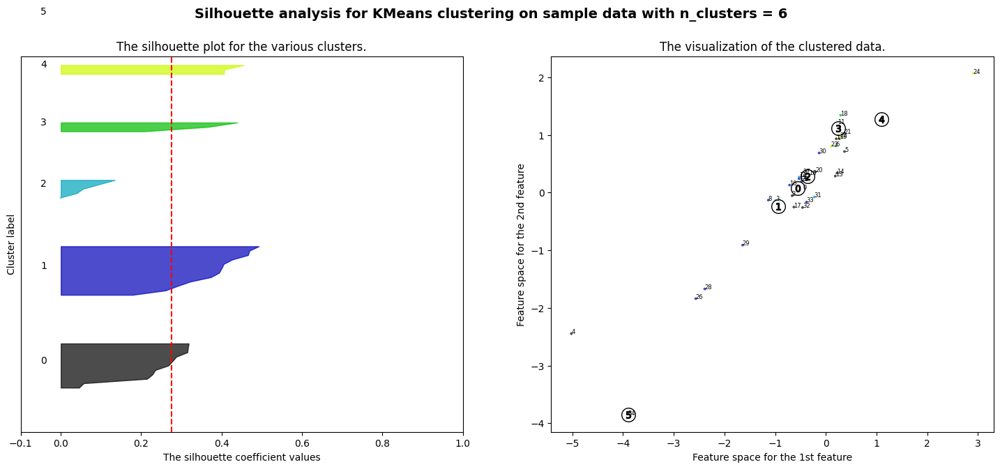

clusterization 2 iteration number 32 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 32 max_sil_avg =  0.2847812822838683
clusterization 2 iteration number 34 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 34 max_sil_avg =  0.2847812822838683
clusterization 2 iteration number 35 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 35 max_sil_avg =  0.2847812822838683
clusterization 2 iteration number 37 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 37 max_sil_avg =  0.2847812822838683
clusterization 6 iteration number 37 max_sil_avg =  0.2766514579989774


<Figure size 640x480 with 0 Axes>

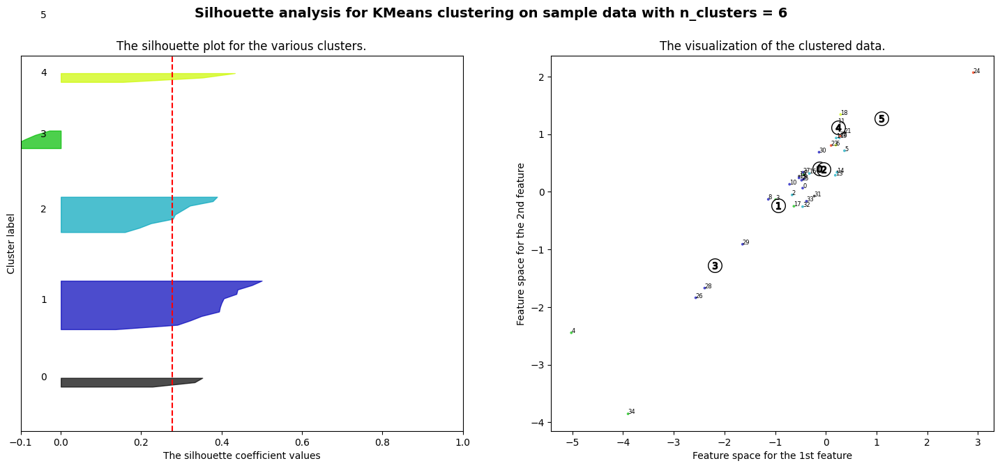

clusterization 2 iteration number 38 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 38 max_sil_avg =  0.2847812822838683
clusterization 3 iteration number 39 max_sil_avg =  0.2847812822838683
clusterization 2 iteration number 40 max_sil_avg =  0.31272294120894606
clusterization 2 iteration number 41 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 41 max_sil_avg =  0.2847812822838683
clusterization 2 iteration number 42 max_sil_avg =  0.31272294120894606
clusterization 3 iteration number 42 max_sil_avg =  0.2847812822838683
clusterization 2 iteration number 43 max_sil_avg =  0.31272294120894606
clusterization 2 iteration number 44 max_sil_avg =  0.31272294120894606
clusterization 2 iteration number 45 max_sil_avg =  0.31272294120894606
clusterization 2 iteration number 46 max_sil_avg =  0.31272294120894606
clusterization 4 iteration number 46 max_sil_avg =  0.30566865774792995
clusterization 2 iteration number 47 max_sil_avg =  0.31272294120894

<Figure size 640x480 with 0 Axes>

In [26]:
#100 iterazioni, con X

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
#X = feature_matrix
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

 #Indici per il conteggio di quante volte è comparso un valore negativo, dopo 100 iterazioni
i = 0 #2 cluster
j = 0 #3 cluster
k = 0 #4 cluster
l = 0 #5 cluster
m = 0 #6 cluster
n = 0 #7 cluster
#Valori per il calcolo della media di silhouette_avg
a = 0
b = 0
c = 0
d = 0
e = 0
f = 0
g = 0
#Inizializzo il vettore in cui andrò a mettere tutti i silhouette_avg
iterations = 100
sil_avg = np.zeros((len(range_n_clusters),iterations)) #dimensioni pari al numero di iterazioni
labels = np.zeros((len(range_n_clusters),len(X))) #41 pari al numero di modelli
centroids = np.zeros((len(range_n_clusters),len(X.T)))  #5x10
max_sil_avg = - np.ones(len(range_n_clusters))
#Inizializzo un vettore che ha indice pari al valore delle righe, in modo tale da individuare ogni modello all'interno del plot
index_models = np.arange(len(X)) # [0,1,2,...,40]

#100 iterazioni
for p in range(iterations):
    
    for n_clusters in range_n_clusters:

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters,init='k-means++') # k-means++ per inizializzare i centroid + distanti iin modo da evitare i minimi locali
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels) #il valore medio del silhouette score tra tutti i cluster
        #aggiorno i valori per poi calcolare la media di silhouette_avg
        if n_clusters == range_n_clusters[0]: #2 cluster
            a = a + silhouette_avg
            sil_avg[0][p] = silhouette_avg
            if p == 0: #primo elemento dell'array sil_avg
                max_sil_avg[0] = sil_avg[0][p] #fisso il primo come il massimo 
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg[0])         
            if sil_avg[0][p] >= max_sil_avg[0]: # scelgo il silh. coefficient maggiore e salvo i labels e i centroids. L'uguale è per p==0
                #fig.clf() #elimino il grafico pre-esistente
                labels[0] = clusterer.labels_ #labels
                centroids = clusterer.cluster_centers_ #centroids 
                max_sil_avg[0] = sil_avg[0][p] # il p-esimo elemento di sil_avg diventa il massimo valore di silhouette coefficient
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg[0])
        elif n_clusters == range_n_clusters[1]: #3 cluster
            b = b + silhouette_avg
            sil_avg[1][p] = silhouette_avg
            if p == 0: #primo elemento dell'array sil_avg
                max_sil_avg[1] = sil_avg[1][p] #fisso il primo come il massimo 
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg[1])         
            if sil_avg[1][p] >= max_sil_avg[1]: # scelgo il silh. coefficient maggiore e salvo i labels e i centroids. L'uguale è per p==0
                #fig.clf() #elimino il grafico pre-esistente
                labels[1] = clusterer.labels_ #labels
                centroids = clusterer.cluster_centers_ #centroids 
                max_sil_avg[1] = sil_avg[1][p] # il p-esimo elemento di sil_avg diventa il massimo valore di silhouette coefficient
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg[1])
        elif n_clusters == range_n_clusters[2]: #4 cluster
            c = c + silhouette_avg
            sil_avg[2][p] = silhouette_avg
            if p == 0: #primo elemento dell'array sil_avg
                max_sil_avg[2] = sil_avg[2][p] #fisso il primo come il massimo 
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg[1])         
            if sil_avg[2][p] >= max_sil_avg[2]: # scelgo il silh. coefficient maggiore e salvo i labels e i centroids. L'uguale è per p==0
                #fig.clf() #elimino il grafico pre-esistente
                labels[2] = clusterer.labels_ #labels
                centroids = clusterer.cluster_centers_ #centroids 
                max_sil_avg[2] = sil_avg[2][p] # il p-esimo elemento di sil_avg diventa il massimo valore di silhouette coefficient
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg[2])
        elif n_clusters == range_n_clusters[3]: #5 cluster
            d = d + silhouette_avg
            sil_avg[3][p] = silhouette_avg
            if p == 0: #primo elemento dell'array sil_avg
                max_sil_avg[3] = sil_avg[3][p] #fisso il primo come il massimo 
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg[3])         
            if sil_avg[3][p] >= max_sil_avg[3]: # scelgo il silh. coefficient maggiore e salvo i labels e i centroids. L'uguale è per p==0
                #fig.clf() #elimino il grafico pre-esistente
                labels[3] = clusterer.labels_ #labels
                centroids = clusterer.cluster_centers_ #centroids 
                max_sil_avg[3] = sil_avg[3][p] # il p-esimo elemento di sil_avg diventa il massimo valore di silhouette coefficient
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg[3])
            
        elif n_clusters == range_n_clusters[4]: #6 cluster
            e = e + silhouette_avg  
            sil_avg[4][p] = silhouette_avg
            if p == 0: #primo elemento dell'array sil_avg
                max_sil_avg[4] = sil_avg[4][p] #fisso il primo come il massimo 
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg[4])         
            if sil_avg[4][p] >= max_sil_avg[4]: # scelgo il silh. coefficient maggiore e salvo i labels e i centroids. L'uguale è per p==0
                #fig.clf() #elimino il grafico pre-esistente
                labels[4] = clusterer.labels_ #labels
                centroids = clusterer.cluster_centers_ #centroids 
                max_sil_avg[4] = sil_avg[4][p] # il p-esimo elemento di sil_avg diventa il massimo valore di silhouette coefficient
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg[4])
                #plot del silhouette coefficient
                #assi per il plot
                fig, (ax1, ax2) = plt.subplots(1, 2)
                fig.set_size_inches(18,7)

                # The 1st subplot is the silhouette plot
                # The silhouette coefficient can range from -1, 1 but in this example all
                # lie within [-0.1, 1]
                ax1.set_xlim([-0.1, 1])
                # The (n_clusters+1)*10 is for inserting blank space between silhouette
                # plots of individual clusters, to demarcate them clearly.
                ax1.set_ylim([0, len(X) + (4 + 1) * 10]) #dove 4 = n_clusters perché il plot lo faccio solo per 4 clusters

                # The 1st subplot is the silhouette plot
                # The silhouette coefficient can range from -1, 1 but in this example all
                # lie within [-0.1, 1]
                ax1.set_xlim([-0.1, 1])
                # The (n_clusters+1)*10 is for inserting blank space between silhouette
                # plots of individual clusters, to demarcate them clearly.
                ax1.set_ylim([0, len(X) + (4 + 1) * 10]) # len(X) = numero di modelli e quindi il numero di samples. 4 = n_clusters perché il plot lo faccio solo per 4 clusters

                # Compute the silhouette scores for each sample
                sample_silhouette_values = silhouette_samples(X, cluster_labels)
                
                y_lower = 10
                for i in range(n_clusters):
                    # Aggregate the silhouette scores for samples belonging to
                    # cluster i, and sort them
                    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

                    ith_cluster_silhouette_values.sort()

                    size_cluster_i = ith_cluster_silhouette_values.shape[0]
                    y_upper = y_lower + size_cluster_i

                    color = cm.nipy_spectral(float(i) / n_clusters)
                    ax1.fill_betweenx(
                        np.arange(y_lower, y_upper),
                        0,
                        ith_cluster_silhouette_values,
                        facecolor=color,
                        edgecolor=color,
                        alpha=0.7,
                    )

                    # Label the silhouette plots with their cluster numbers at the middle
                    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

                    # Compute the new y_lower for next plot
                    y_lower = y_upper + 10  # 10 for the 0 samples

                ax1.set_title("The silhouette plot for the various clusters.")
                ax1.set_xlabel("The silhouette coefficient values")
                ax1.set_ylabel("Cluster label")

                # The vertical line for average silhouette score of all the values
                ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

                ax1.set_yticks([])  # Clear the yaxis labels / ticks
                ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

                # 2nd Plot showing the actual clusters formed
                colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
                ax2.scatter(
                    X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
                )
                # Annotazione dei numeri degli indici
                for i, txt in enumerate(index_models):
                    ax2.annotate(txt, (X[i, 0], X[i, 1]), fontsize=6)

                # Draw white circles at cluster centers
                ax2.scatter(
                    centroids[:, 0],
                    centroids[:, 1],
                    marker="o",
                    c="white",
                    alpha=1,
                    s=200,
                    edgecolor="k",
                )

                for i, c in enumerate(centroids):
                    ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

                ax2.set_title("The visualization of the clustered data.")
                ax2.set_xlabel("Feature space for the 1st feature")
                ax2.set_ylabel("Feature space for the 2nd feature")

                plt.suptitle(
                    "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
                    % n_clusters,
                    fontsize=14,
                    fontweight="bold",
                )

                plt.show()
                plt.savefig('sil_coeff_X.pdf', format='pdf')  
            
        elif n_clusters == range_n_clusters[5]: #7 cluster
            f = f + silhouette_avg
            #Prendo il silhouette_avg maggiore (lo faccio solo per 4 cluster) e fisso i labels e i centers
            #Inserisco silhouette_avg in un vettore
            sil_avg[5][p] = silhouette_avg
            if p == 0: #primo elemento dell'array sil_avg
                max_sil_avg[5] = sil_avg[5][p] #fisso il primo come il massimo 
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg[5])         
            if sil_avg[5][p] >= max_sil_avg[5]: # scelgo il silh. coefficient maggiore e salvo i labels e i centroids. L'uguale è per p==0
                fig.clf() #elimino il grafico pre-esistente
                labels[5] = clusterer.labels_ #labels
                centroids = clusterer.cluster_centers_ #centroids 
                max_sil_avg[5] = sil_avg[5][p] # il p-esimo elemento di sil_avg diventa il massimo valore di silhouette coefficient
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg[5]) 
     
        elif n_clusters == range_n_clusters[6]: #8 cluster
            g = g + silhouette_avg
            sil_avg[6][p] = silhouette_avg
            if p == 0: #primo elemento dell'array sil_avg
                max_sil_avg[6] = sil_avg[6][p] #fisso il primo come il massimo 
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg[6])         
            if sil_avg[6][p] >= max_sil_avg[6]: # scelgo il silh. coefficient maggiore e salvo i labels e i centroids. L'uguale è per p==0
                #fig.clf() #elimino il grafico pre-esistente
                labels[6] = clusterer.labels_ #labels
                centroids = clusterer.cluster_centers_ #centroids 
                max_sil_avg[6] = sil_avg[6][p] # il p-esimo elemento di sil_avg diventa il massimo valore di silhouette coefficient
                print("clusterization",n_clusters,"iteration number",p,"max_sil_avg = ",max_sil_avg[6])

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)
    
        if np.any(sample_silhouette_values < 0):
            #print("For n_clusters =", n_clusters, "there are negative silhouette values.") #Se almeno uno dei samples ha sil coeff < 0
            #Aggiorno il conteggio quando ho un valore dei coefficienti negativo per ogni iterazione
            if n_clusters == range_n_clusters[0]:
                i = i + 1
            elif n_clusters == range_n_clusters[1]:
                j = j + 1
            elif n_clusters == range_n_clusters[2]:
                k = k + 1
            elif n_clusters == range_n_clusters[3]:
                l = l + 1
            elif n_clusters == range_n_clusters[4]:
                m = m + 1  
            elif n_clusters == range_n_clusters[5]:
                n = n + 1

cluster_2_mean = a / iterations
cluster_3_mean = b / iterations
cluster_4_mean = c / iterations
cluster_5_mean = d / iterations
cluster_6_mean = e / iterations
cluster_7_mean = f / iterations

#print("n_clusters = ", range_n_clusters[0], "has", i, "negative silhouette coefficient values and average silhouette coefficient is in 100 iterations is", cluster_2_mean)
#print("n_clusters = ", range_n_clusters[1], "has", j, "negative silhouette coefficient values and average silhouette coefficient is in 100 iterations is", cluster_3_mean)
#print("n_clusters = ", range_n_clusters[2], "has", k, "negative silhouette coefficient values and average silhouette coefficient is in 100 iterations is", cluster_4_mean)
#print("n_clusters = ", range_n_clusters[3], "has", l, "negative silhouette coefficient values and average silhouette coefficient is in 100 iterations is", cluster_5_mean)
#print("n_clusters = ", range_n_clusters[4], "has", m, "negative silhouette coefficient values and average silhouette coefficient is in 100 iterations is", cluster_6_mean)
#print("n_clusters = ", range_n_clusters[5], "has", n, "negative silhouette coefficient values and average silhouette coefficient is in 100 iterations is", cluster_7_mean)


In [27]:
print(max_sil_avg_pca)
print('\n')
print(max_sil_avg)

[0.33133918 0.30665243 0.33185351 0.31977857 0.30791347 0.30654664
 0.30718237]


[0.31272294 0.28478128 0.30566866 0.28982623 0.27665146 0.27516958
 0.27087275]


In [28]:
print(labels_pca[4])
print(labels[4])

[1. 5. 5. 4. 4. 5. 3. 4. 1. 1. 1. 3. 0. 5. 5. 1. 5. 4. 3. 5. 5. 0. 2. 2.
 2. 1. 1. 1. 1. 1. 1. 0. 5. 1. 4.]
[1. 2. 2. 3. 3. 2. 4. 3. 1. 1. 1. 4. 0. 2. 2. 1. 2. 3. 4. 2. 2. 0. 5. 5.
 5. 1. 1. 1. 1. 1. 1. 0. 2. 1. 3.]


In [29]:
#Creo una lista con il nome dei modelli
models_list = list(models_atmos.keys())

In [30]:
#X_pca
#Inizializzo l'indice per l'i-esimo cluster
cluster0_pca = 0
cluster1_pca = 0
cluster2_pca = 0
cluster3_pca = 0
cluster4_pca = 0
cluster5_pca = 0
#cluster6_pca = 0
#Inizializzo le liste in cui andrò a mettere il nome dei modelli per ogni cluster
list_cluster0_pca = []
list_cluster1_pca = []
list_cluster2_pca = []
list_cluster3_pca = []
list_cluster4_pca = []
list_cluster5_pca = []
#list_cluster6_pca = []
#conto quanti modelli ci sono per ogni cluster
for i in range(len(models_atmos)):
    if labels_pca[4][i] == 0:
        cluster0_pca = cluster0_pca + 1 #aggiorno il numero di elementi all'interno del cluster 0
        list_cluster0_pca.append(models_list[i]) #aggiungo un nome alla volta: cioè l'elemento j-esimo della lista dei nomi del cluster 0 è pari all'elemento i-esimo della lista dei nomi di tutti i modelli
    elif labels_pca[4][i] == 1:
        cluster1_pca = cluster1_pca + 1
        list_cluster1_pca.append(models_list[i])
        #print(i,cluster_1)
    elif labels_pca[4][i] == 2:
        cluster2_pca = cluster2_pca + 1
        list_cluster2_pca.append(models_list[i])
    elif labels_pca[4][i] == 3:
        cluster3_pca = cluster3_pca + 1
        list_cluster3_pca.append(models_list[i])
    elif labels_pca[4][i] == 4:
        cluster4_pca = cluster4_pca + 1
        list_cluster4_pca.append(models_list[i])
    elif labels_pca[4][i] == 5:
        cluster5_pca = cluster5_pca + 1
        list_cluster5_pca.append(models_list[i])
#    elif labels_pca[5][i] == 6:
#        cluster6_pca = cluster6_pca + 1
#        list_cluster6_pca.append(models_list[i])

print(cluster0_pca,cluster1_pca,cluster2_pca,cluster3_pca,cluster4_pca,cluster5_pca)#,cluster6_pca)
print(sum([cluster0_pca,cluster1_pca,cluster2_pca,cluster3_pca,cluster4_pca,cluster5_pca]))#,cluster6_pca]))
print(list_cluster0_pca)
print(list_cluster1_pca)
print(list_cluster2_pca)
print(list_cluster3_pca)
print(list_cluster4_pca)
print(list_cluster5_pca)
#print(list_cluster6_pca)

3 12 3 3 5 9
35
['E3SM-1-0', 'MRI-ESM2-0', 'GFDL-ESM4']
['TaiESM1', 'CanESM5', 'CMCC-CM2-SR5', 'ACCESS-ESM1-5', 'FIO-ESM-2-0', 'CESM2', 'CESM2-FV2', 'CESM2-WACCM', 'CESM2-WACCM-FV2', 'NorESM2-LM', 'NorESM2-MM', 'SAM0-UNICON']
['GISS-E2-1-G', 'GISS-E2-1-G-CC', 'GISS-E2-1-H']
['CAS-ESM2-0', 'ACCESS-CM2', 'MIROC6']
['BCC-CSM2-MR', 'BCC-ESM1', 'FGOALS-g3', 'IPSL-CM6A-LR', 'MCM-UA-1-0']
['AWI-CM-1-1-MR', 'AWI-ESM-1-1-LR', 'CAMS-CSM1-0', 'EC-Earth3', 'EC-Earth3-Veg', 'MPI-ESM-1-2-HAM', 'MPI-ESM1-2-HR', 'MPI-ESM1-2-LR', 'NESM3']


In [31]:
#X
#Inizializzo l'indice per l'i-esimo cluster
cluster0 = 0
cluster1 = 0
cluster2 = 0
cluster3 = 0
cluster4 = 0
cluster5 = 0
#cluster6 = 0
#Inizializzo le liste in cui andrò a mettere il nome dei modelli per ogni cluster
list_cluster0 = []
list_cluster1 = []
list_cluster2 = []
list_cluster3 = []
list_cluster4 = []
list_cluster5 = []
#list_cluster6 = []
#conto quanti modelli ci sono per ogni cluster
for i in range(len(models_atmos)):
    if labels[4][i] == 0:
        cluster0 = cluster0 + 1 #aggiorno il numero di elementi all'interno del cluster 0
        list_cluster0.append(models_list[i]) #aggiungo un nome alla volta: cioè l'elemento j-esimo della lista dei nomi del cluster 0 è pari all'elemento i-esimo della lista dei nomi di tutti i modelli
    elif labels[4][i] == 1:
        cluster1 = cluster1 + 1
        list_cluster1.append(models_list[i])
        #print(i,cluster_1)
    elif labels[4][i] == 2:
        cluster2 = cluster2 + 1
        list_cluster2.append(models_list[i])
    elif labels[4][i] == 3:
        cluster3 = cluster3 + 1
        list_cluster3.append(models_list[i])
    elif labels[4][i] == 4:
        cluster4 = cluster4 + 1
        list_cluster4.append(models_list[i])
    elif labels[4][i] == 5:
        cluster5 = cluster5 + 1
        list_cluster5.append(models_list[i])
#    elif labels[5][i] == 6:
#        cluster6 = cluster6 + 1
#        list_cluster6.append(models_list[i])

print(cluster0,cluster1,cluster2,cluster3,cluster4,cluster5)#,cluster6)
print(sum([cluster0,cluster1,cluster2,cluster3,cluster4,cluster5]))#,cluster6]))
print(list_cluster0)
print(list_cluster1)
print(list_cluster2)
print(list_cluster3)
print(list_cluster4)
print(list_cluster5)
#print(list_cluster6)

3 12 9 5 3 3
35
['E3SM-1-0', 'MRI-ESM2-0', 'GFDL-ESM4']
['TaiESM1', 'CanESM5', 'CMCC-CM2-SR5', 'ACCESS-ESM1-5', 'FIO-ESM-2-0', 'CESM2', 'CESM2-FV2', 'CESM2-WACCM', 'CESM2-WACCM-FV2', 'NorESM2-LM', 'NorESM2-MM', 'SAM0-UNICON']
['AWI-CM-1-1-MR', 'AWI-ESM-1-1-LR', 'CAMS-CSM1-0', 'EC-Earth3', 'EC-Earth3-Veg', 'MPI-ESM-1-2-HAM', 'MPI-ESM1-2-HR', 'MPI-ESM1-2-LR', 'NESM3']
['BCC-CSM2-MR', 'BCC-ESM1', 'FGOALS-g3', 'IPSL-CM6A-LR', 'MCM-UA-1-0']
['CAS-ESM2-0', 'ACCESS-CM2', 'MIROC6']
['GISS-E2-1-G', 'GISS-E2-1-G-CC', 'GISS-E2-1-H']


In [32]:
print(list_cluster0_pca)
print(list_cluster1_pca)
print(list_cluster2_pca)
print(list_cluster3_pca)
print(list_cluster4_pca)
print(list_cluster5_pca)
#print(list_cluster6_pca)
print('\n')
print(list_cluster0)
print(list_cluster1)
print(list_cluster2)
print(list_cluster3)
print(list_cluster4)
print(list_cluster5)
#print(list_cluster6)

['E3SM-1-0', 'MRI-ESM2-0', 'GFDL-ESM4']
['TaiESM1', 'CanESM5', 'CMCC-CM2-SR5', 'ACCESS-ESM1-5', 'FIO-ESM-2-0', 'CESM2', 'CESM2-FV2', 'CESM2-WACCM', 'CESM2-WACCM-FV2', 'NorESM2-LM', 'NorESM2-MM', 'SAM0-UNICON']
['GISS-E2-1-G', 'GISS-E2-1-G-CC', 'GISS-E2-1-H']
['CAS-ESM2-0', 'ACCESS-CM2', 'MIROC6']
['BCC-CSM2-MR', 'BCC-ESM1', 'FGOALS-g3', 'IPSL-CM6A-LR', 'MCM-UA-1-0']
['AWI-CM-1-1-MR', 'AWI-ESM-1-1-LR', 'CAMS-CSM1-0', 'EC-Earth3', 'EC-Earth3-Veg', 'MPI-ESM-1-2-HAM', 'MPI-ESM1-2-HR', 'MPI-ESM1-2-LR', 'NESM3']


['E3SM-1-0', 'MRI-ESM2-0', 'GFDL-ESM4']
['TaiESM1', 'CanESM5', 'CMCC-CM2-SR5', 'ACCESS-ESM1-5', 'FIO-ESM-2-0', 'CESM2', 'CESM2-FV2', 'CESM2-WACCM', 'CESM2-WACCM-FV2', 'NorESM2-LM', 'NorESM2-MM', 'SAM0-UNICON']
['AWI-CM-1-1-MR', 'AWI-ESM-1-1-LR', 'CAMS-CSM1-0', 'EC-Earth3', 'EC-Earth3-Veg', 'MPI-ESM-1-2-HAM', 'MPI-ESM1-2-HR', 'MPI-ESM1-2-LR', 'NESM3']
['BCC-CSM2-MR', 'BCC-ESM1', 'FGOALS-g3', 'IPSL-CM6A-LR', 'MCM-UA-1-0']
['CAS-ESM2-0', 'ACCESS-CM2', 'MIROC6']
['GISS-E2-1-G', 'GISS-E

Fisso nome modelli e numero all'interno delle liste per ogni cluster

In [33]:
#list_cluster0_new = ['CAS-ESM2-0', 'ACCESS-CM2', 'MIROC6']
#list_cluster1_new = ['GISS-E2-1-G', 'GISS-E2-1-G-CC', 'GISS-E2-1-H']
#list_cluster2_new = ['TaiESM1', 'CanESM5', 'CMCC-CM2-SR5', 'ACCESS-ESM1-5', 'FIO-ESM-2-0', 'CESM2', 'CESM2-FV2', 'CESM2-WACCM', 'CESM2-WACCM-FV2', 'NorESM2-LM', 'NorESM2-MM', 'SAM0-UNICON']
#list_cluster3_new = ['AWI-CM-1-1-MR', 'AWI-ESM-1-1-LR', 'BCC-CSM2-MR', 'BCC-ESM1', 'CAMS-CSM1-0', 'FGOALS-g3', 'E3SM-1-0', 'EC-Earth3', 'EC-Earth3-Veg', 'MPI-ESM-1-2-HAM', 'IPSL-CM6A-LR', 'MPI-ESM1-2-HR', 'MPI-ESM1-2-LR', 'MRI-ESM2-0', 'GFDL-ESM4', 'NESM3', 'MCM-UA-1-0']

In [34]:
#lon = (-125,30)
#list_cluster0_new = ['CAS-ESM2-0', 'ACCESS-CM2', 'MIROC6']
#list_cluster1_new = ['GISS-E2-1-G', 'GISS-E2-1-G-CC', 'GISS-E2-1-H']
#list_cluster2_new = ['TaiESM1', 'CanESM5', 'CMCC-CM2-SR5', 'ACCESS-ESM1-5', 'FIO-ESM-2-0', 'CESM2', 'CESM2-FV2', 'CESM2-WACCM', 'CESM2-WACCM-FV2', 'NorESM2-LM', 'NorESM2-MM', 'SAM0-UNICON']
#list_cluster3_new = ['AWI-CM-1-1-MR', 'AWI-ESM-1-1-LR', 'CAMS-CSM1-0', 'EC-Earth3', 'EC-Earth3-Veg', 'MPI-ESM-1-2-HAM', 'IPSL-CM6A-LR', 'MPI-ESM1-2-HR', 'MPI-ESM1-2-LR', 'NESM3']
#list_cluster4_new = ['BCC-CSM2-MR', 'FGOALS-g3', 'E3SM-1-0', 'MRI-ESM2-0', 'GFDL-ESM4']
#list_cluster5_new = ['BCC-ESM1', 'MCM-UA-1-0']

In [50]:
#lon = (-105,30)
list_cluster0_new = ['CAS-ESM2-0', 'ACCESS-CM2', 'MIROC6']
list_cluster1_new = ['GISS-E2-1-G', 'GISS-E2-1-G-CC', 'GISS-E2-1-H']
list_cluster2_new = ['TaiESM1', 'CanESM5', 'CMCC-CM2-SR5', 'ACCESS-ESM1-5', 'FIO-ESM-2-0', 'CESM2', 'CESM2-FV2', 'CESM2-WACCM', 'CESM2-WACCM-FV2', 'NorESM2-LM', 'NorESM2-MM', 'SAM0-UNICON']
list_cluster3_new = ['AWI-CM-1-1-MR', 'AWI-ESM-1-1-LR', 'CAMS-CSM1-0', 'EC-Earth3', 'EC-Earth3-Veg', 'MPI-ESM-1-2-HAM', 'MPI-ESM1-2-HR', 'MPI-ESM1-2-LR', 'NESM3']
list_cluster4_new = ['BCC-CSM2-MR', 'BCC-ESM1', 'FGOALS-g3', 'IPSL-CM6A-LR', 'MCM-UA-1-0']
list_cluster5_new = ['E3SM-1-0', 'MRI-ESM2-0', 'GFDL-ESM4']

In [51]:
list_4_clusters_new = [list_cluster0_new,list_cluster1_new,list_cluster2_new,list_cluster3_new,list_cluster4_new,list_cluster5_new]

Cluster 0

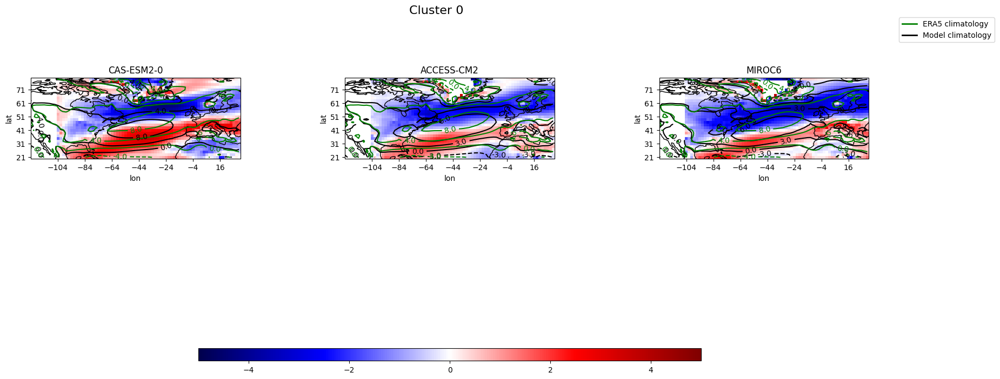

In [52]:
plot_atmos = plot_bias_atmos((int(len(list_cluster0_new)/3)+1),3,(20,8),-5,5,list_cluster0_new,models_atmos,era_na_seas_mean,'Cluster 0','atmos_cluster0_new.pdf')

Cluster 1

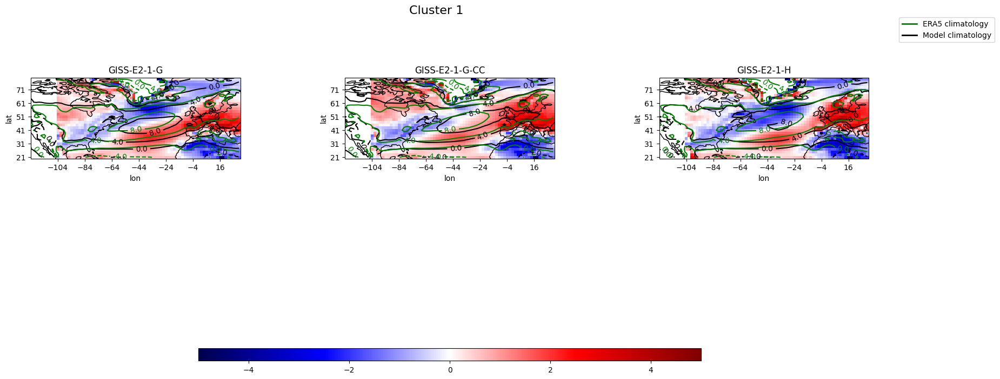

In [53]:
plot_atmos = plot_bias_atmos((int(len(list_cluster1_new)/3)+1),3,(20,8),-5,5,list_cluster1_new,models_atmos,era_na_seas_mean,'Cluster 1','atmos_cluster1_new.pdf')

Cluster 2

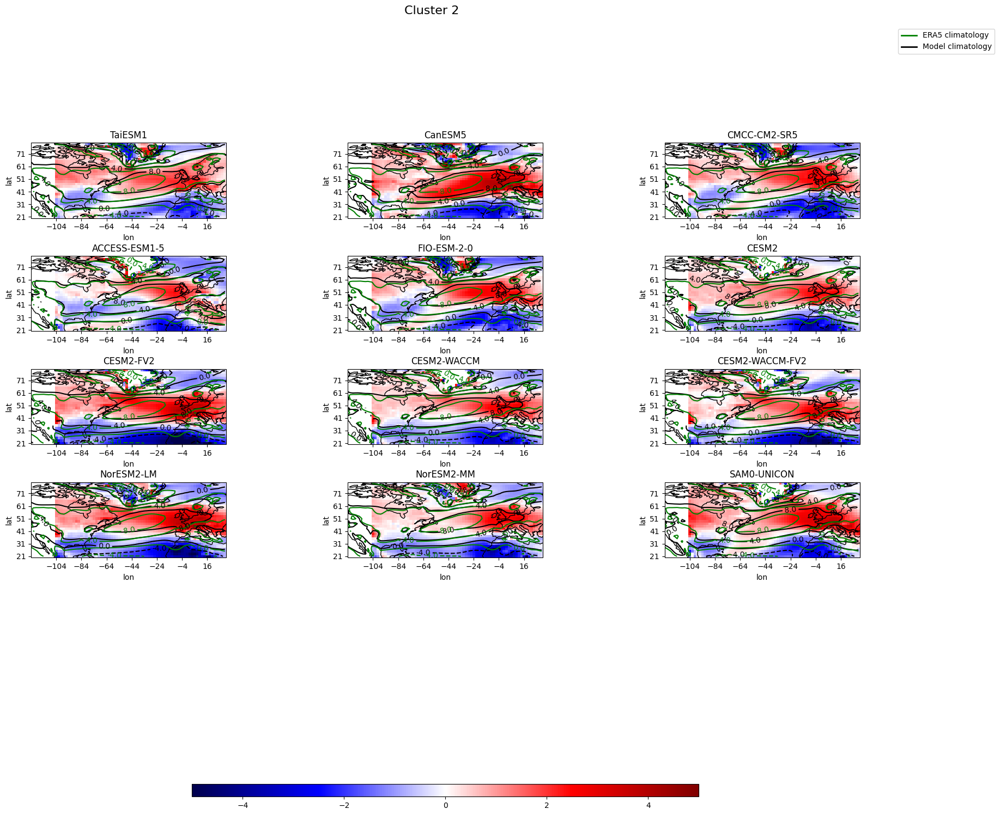

In [54]:
plot_atmos = plot_bias_atmos((int(len(list_cluster2_new)/3)+1),3,(20,18),-5,5,list_cluster2_new,models_atmos,era_na_seas_mean,'Cluster 2','atmos_cluster2_new.pdf')

Cluster 3

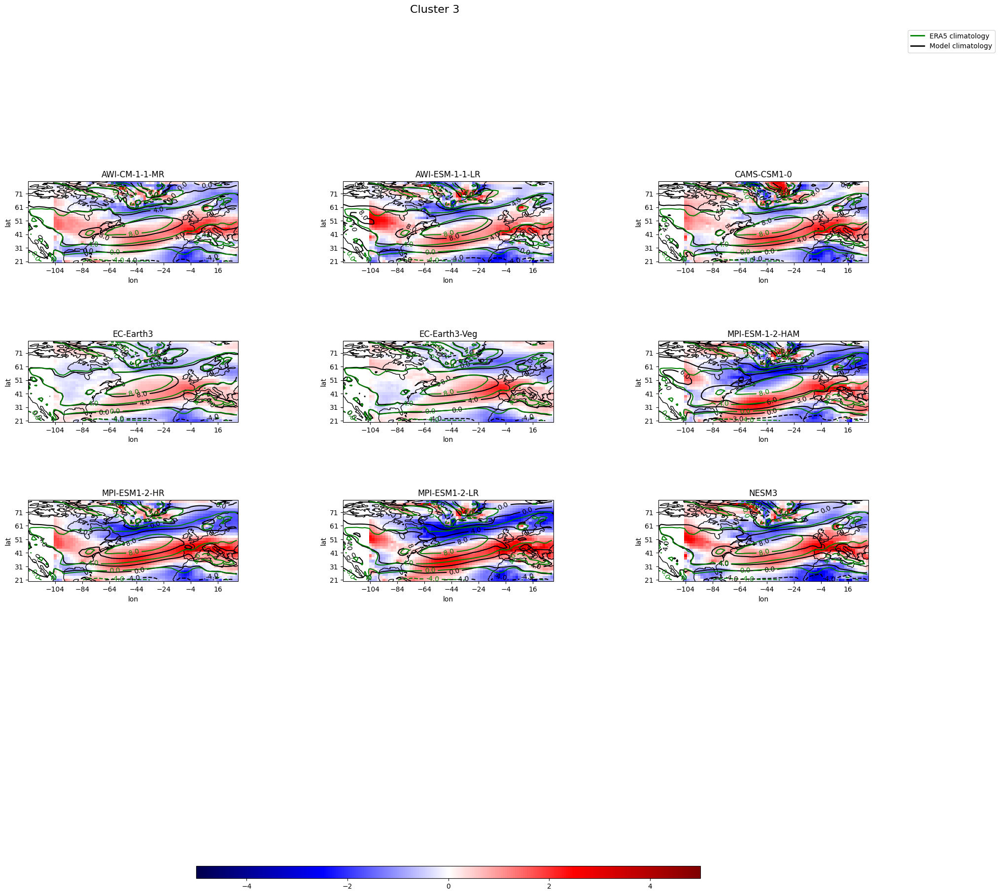

In [55]:
plot_atmos = plot_bias_atmos((int(len(list_cluster3_new)/3)+1),3,(22,22),-5,5,list_cluster3_new,models_atmos,era_na_seas_mean,'Cluster 3','atmos_cluster3_new.pdf')

Cluster 4

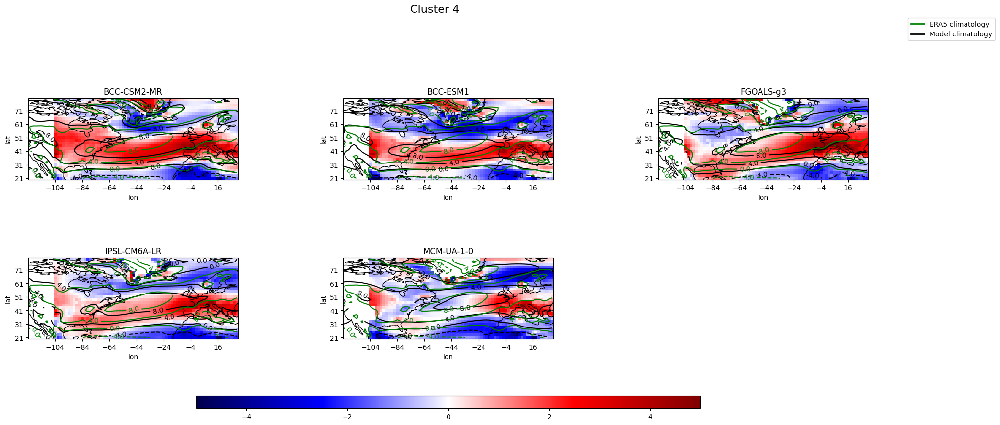

In [56]:
plot_atmos = plot_bias_atmos((int(len(list_cluster4_new)/3)+1),3,(22,10),-5,5,list_cluster4_new,models_atmos,era_na_seas_mean,'Cluster 4','atmos_cluster4_new.pdf')

Cluster 5

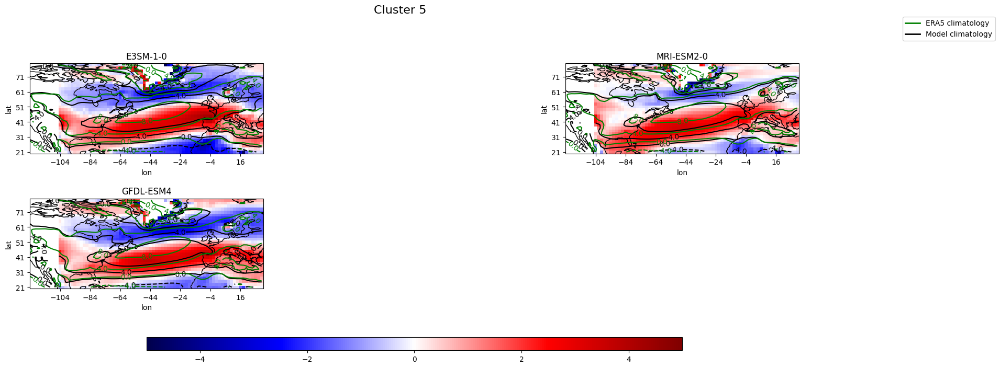

In [57]:
plot_atmos = plot_bias_atmos((int(len(list_cluster5_new)/2)+1),2,(22,8),-5,5,list_cluster5_new,models_atmos,era_na_seas_mean,'Cluster 5','atmos_cluster5_new.pdf')

Cluster medi

In [58]:
def plot_6_mean_cluster_atmos(list_4_clusters, dataset_seas_mean, fig_size, name_dict, v_min, v_max, title_plot, title_pdf):
    fig, ax = plt.subplots(nrows=2, ncols=3, figsize=fig_size, subplot_kw={"projection": ccrs.PlateCarree()})
    fig.subplots_adjust(hspace=0.5, wspace=0.5)  # Aggiungo spazi verticali tra le subplots
    
    for j in range(len(list_4_clusters)):  # ciclo su tutti i 6 cluster medi
        sum_bias = 0
        for i in range(len(list_4_clusters[j])):  # ciclo sui modelli del cluster j-esimo
            model_name = list_4_clusters[j][i]
            sum_bias += name_dict[model_name]['atmos North Atlantic bias DJF']
        
        # Calcolo del valor medio
        mean_bias_atmos = sum_bias / len(list_4_clusters[j])
        
        # Indicizzazione
        k = j // 3  # indice per le righe
        l = j % 3  # indice per le colonne
        
        plot_mod = ax[k, l].pcolormesh(mean_bias_atmos[0].lon, mean_bias_atmos[0].lat, mean_bias_atmos[0], vmin=v_min, vmax=v_max, cmap='seismic')
        
        data_era = dataset_seas_mean[4]
        contour_era = ax[k, l].contour(data_era[0].lon, data_era[0].lat, data_era[0], colors='g')
        ax[k, l].clabel(contour_era, fmt='%1.1f')
        ax[k, l].coastlines()
        
        # Valori assi
        ax[k, l].set_xticks(np.arange(mean_bias_atmos[0].lon.min(), mean_bias_atmos[0].lon.max(), 20))
        ax[k, l].set_yticks(np.arange(mean_bias_atmos[0].lat.min(), mean_bias_atmos[0].lat.max(), 10))
        ax[k, l].set_xlabel('longitude(deg)')
        ax[k, l].set_ylabel('latitude(deg)')
        ax[k, l].set_title(f'Cluster {j}', fontsize=16, y=1.02)
    
    # Creazione di un oggetto Line2D per la legenda
    green_line = Line2D([0], [0], color='green', lw=2, label='ERA5 climatology')
    
    # Aggiungo la legenda al plot
    fig.legend(handles=[green_line], loc='upper center', bbox_to_anchor=(0.5, 0.97), ncol=1)
    
    # Barra del colore
    fig.colorbar(plot_mod, ax=ax.ravel().tolist(), orientation='horizontal', shrink=0.6, aspect=40).set_label('Zonal wind(m/s)')
    
    # Titolo
    fig.suptitle(title_plot, fontsize=16, y=1.02)
    
    # Salva il plot come PDF
    fig.savefig(title_pdf, format='pdf')


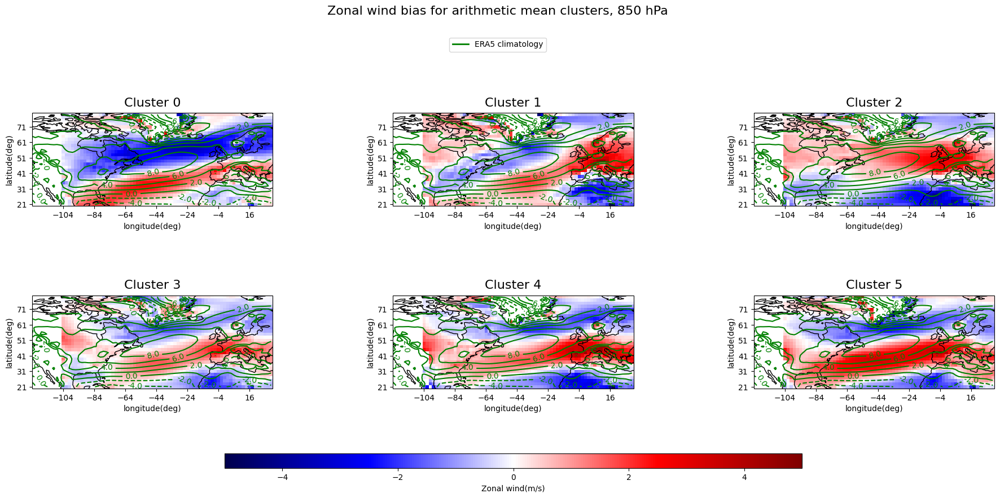

In [59]:
plot_6_mean_cluster_atmos(list_4_clusters_new,era_na_seas_mean,(22,10),models_atmos,-5,5,'Zonal wind bias for arithmetic mean clusters, 850 hPa','cluster_mean_atmos_new.pdf')

In [60]:
#plot_5_mean_cluster_atmos(list_4_clusters_new,era_na_seas_mean,(12,8),models_atmos,-5,5,'Zonal wind bias for arithmetic mean clusters, 850 hPa','cluster_mean_atmos_new.pdf')

Cluster medi tos

In [61]:
def plot_6_mean_cluster_tos(list_4_clusters,dataset_seas_mean,fig_size,name_dict,v_min,v_max,title_plot,title_pdf): #funzione per il plot dei 5 cluster medi di tos
    fig,ax = plt.subplots(nrows=2,ncols=3,figsize=fig_size,subplot_kw={"projection": ccrs.PlateCarree()})
    fig.subplots_adjust(hspace=0.5, wspace=0.5)  # Aggiungo spazi verticali tra le subplots
    #calcolo il valor medio
    for j in range(len(list_4_clusters)): #ciclo su tutti i 4 cluster medi
        #Inizializzo sum_bias per il calcolo della media di tos
        sum_bias = 0
        for i in range(len(list_4_clusters[j])): #ciclo sui modelli del cluster j-esimo
            model_name = list_4_clusters[j][i]
            sum_bias = sum_bias + name_dict[model_name]['North Atlantic bias DJF']
        #valor medio
        mean_bias_tos = sum_bias / len(list_4_clusters[j])
        mean_bias_tos = mean_bias_tos.assign_coords(lon=(np.where(mean_bias_tos.lon >= 280, mean_bias_tos.lon - 360, mean_bias_tos.lon))) #metto i valori negativi di lon per mean_bias
        #plot
        # Indicizzazione
        k = j // 3  # indice per le righe
        l = j % 3  # indice per le colonne
        plot_mod = ax[k,l].pcolormesh(mean_bias_tos.lon,mean_bias_tos.lat,mean_bias_tos,vmin=v_min, vmax=v_max,cmap='seismic')  #trasformazione cartografica = lonxlat
        data_esa = dataset_seas_mean[4]
        contour_esa = ax[k, l].contour(data_esa.lon, data_esa.lat, data_esa, colors='g')
        ax[k,l].clabel(contour_esa, fmt='%1.1f')
        ax[k,l].coastlines() #gca = get current axis
        #valori assi            
        ax[k,l].set_xticks(np.arange(mean_bias_tos.lon.min(),mean_bias_tos.lon.max(), 20))
        ax[k,l].set_yticks(np.arange(mean_bias_tos.lat.min(),mean_bias_tos.lat.max(), 10))
        ax[k,l].set_ylabel('latitude(deg)')
        ax[k,l].set_xlabel('longitude(deg)')
        ax[k,l].set_title(f'Cluster {j}', fontsize=16, y=1.02)
    # Creazione di un oggetto Line2D per la legenda
    green_line = Line2D([0], [0], color='green', lw=2, label='ESA-CCI climatology')  
    # Aggiungo la legenda al plot
    fig.legend(handles=[green_line],loc='upper center', bbox_to_anchor=(0.5, 0.97), ncol=1) 
    # Titolo
    fig.colorbar(plot_mod, ax=ax, orientation='horizontal', shrink=0.6, aspect=40).set_label('SST(°C)')
    fig.suptitle(title_plot, fontsize=16, y=1.02)
    fig.savefig(title_pdf, format='pdf')


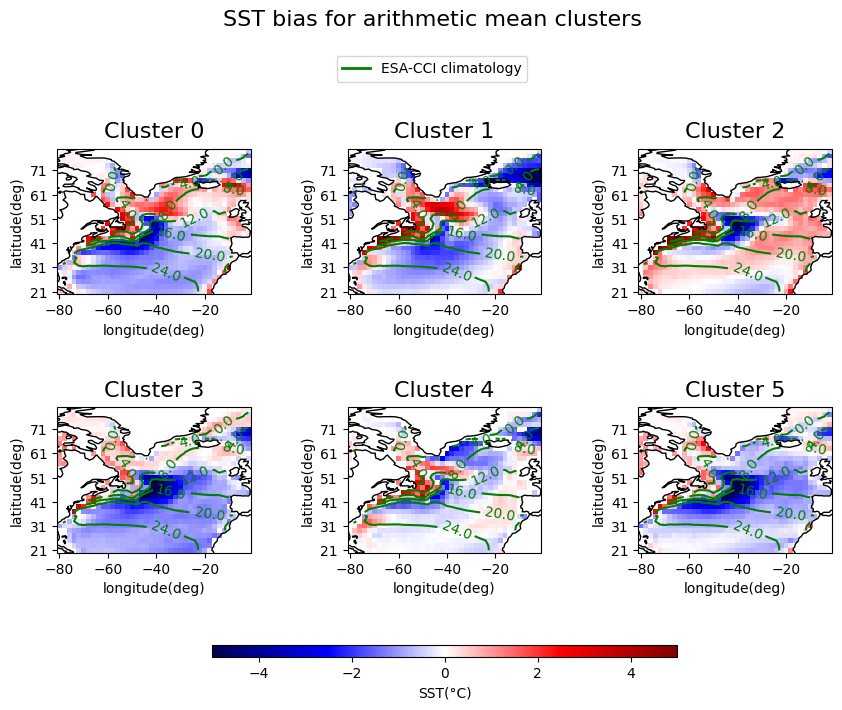

In [62]:
plot_6_mean_cluster_tos(list_4_clusters_new,esa_na_seas_mean_tos,(10,8),models,-5,5,'SST bias for arithmetic mean clusters','cluster_mean_tos_new.pdf')

Cluster medi zonmean

In [63]:
def plot_6_mean_cluster_zonmean(list_4_clusters, dataset_seas_mean, fig_size, name_dict, v_min, v_max, title_plot, title_pdf): #plot dei 5 cluster medi di zonmean    
    fig,ax = plt.subplots(nrows=2,ncols=3,figsize=fig_size)
    fig.subplots_adjust(hspace=0.5, wspace=0.5)  # Aggiungo spazi verticali tra le subplots
    #calcolo il valor medio
    for j in range(len(list_4_clusters)): # ciclo su tutti i 5 cluster medi
        #Inizializzo sum_zonmean per il calcolo della media di zonmean
        sum_zonmean = 0
        for i in range(len(list_4_clusters[j])):  # ciclo sui modelli del cluster j-esimo
            model_name = list_4_clusters[j][i]
            zonmean = name_dict[model_name]['zonmean bias DJF']
            zonmean = zonmean.assign_coords({"plev" : zonmean.plev.round()}) #arrotondo in modo tale che i livelli di pressione siano gli stessi per ogni modello
            sum_zonmean = sum_zonmean + zonmean
        #valor medio
        mean_zonmean = sum_zonmean / len(list_4_clusters[j])
        # Plot
        # Indicizzazione
        k = j // 3  # indice per le righe
        l = j % 3  # indice per le colonne        
        plot_mod = mean_zonmean.plot(vmin=v_min, vmax=v_max, cmap='seismic', ax=ax[k,l], add_colorbar=False)
        data_era = dataset_seas_mean[4]
        contour_era = data_era.sel(lon=0).plot.contour(ax=ax[k,l],colors='g')
        ax[k,l].clabel(contour_era, fmt='%1.1f')
        ax[k,l].set_xlabel('latitude(deg)')
        ax[k,l].set_ylabel('plev(Pa)')
        ax[k,l].invert_yaxis()
        # Titolo
        ax[k,l].set_title(f'Cluster {j}', fontsize=16, y=1.02)
   
    # Creazione di un oggetto Line2D per la legenda
    green_line = Line2D([0], [0], color='green', lw=2, label='ERA5 climatology')     
    # Aggiungo la legenda al plot
    fig.legend(handles=[green_line],loc='upper center', bbox_to_anchor=(0.5, 0.97), ncol=1)
    # Barra del colore
    fig.colorbar(plot_mod, ax=ax, orientation='horizontal', shrink=0.6, aspect=40).set_label('Zonal wind(m/s)')         
    # Titolo
    fig.suptitle(title_plot, fontsize=16, y=1.02)
    fig.savefig(title_pdf, format='pdf')

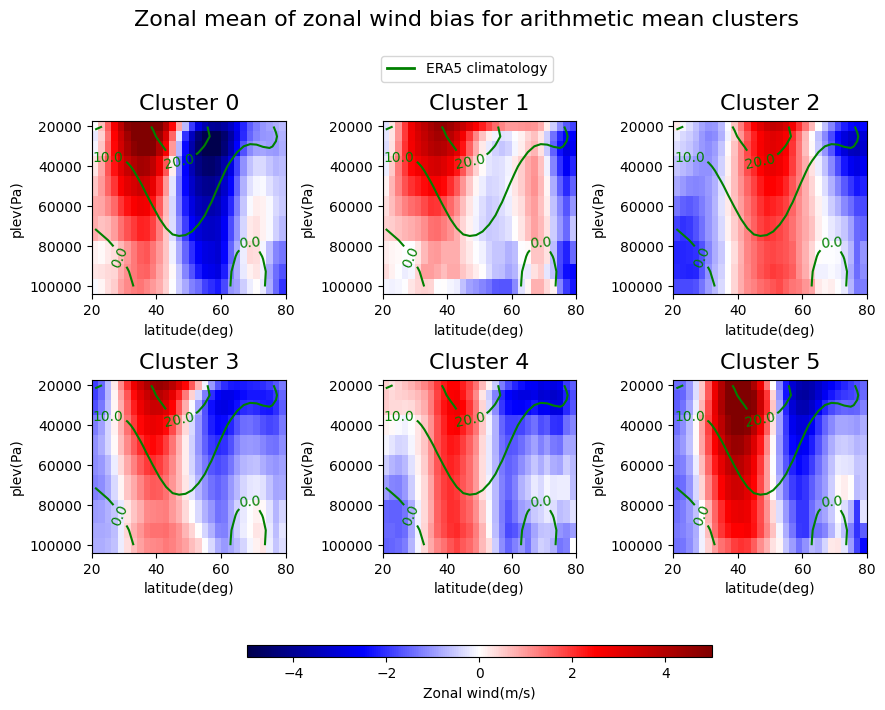

In [64]:
plot_6_mean_cluster_zonmean(list_4_clusters_new, era_seas_mean, (10,8), models_zonmean, -5, 5, 'Zonal mean of zonal wind bias for arithmetic mean clusters', 'cluster_mean_zonmean_new.pdf')

Salvo in file pickle

In [65]:
# Salvataggio di models_atmos
with open('models_atmos_new.pkl', 'wb') as file:
    dill.dump(models_atmos, file)
    dill.dump(era_na_seas_mean,file)
    dill.dump(list_4_clusters_new,file)